# Trabajo Práctico 1

## Procesamiento del lenguaje natural

Se ha trabajado localmente en Windows Subsystem for Linux con Ubuntu-22.04 en un entorno virtual con el IDE Visual Studio Code.

Todas las dependencias necesarias se han instalado mediante la terminal, no desde el Jupyter Notebook.

Si quiere reproducir el código por su cuenta denerá realizar la instalación de dichas dependencias.

A continuación se listan los comandos utilizados en la terminal para instalar las librerías requeridas:
- pip install selenium
- pip install beautifulsoup4
- pip install pandas
- pip install Unidecode
- pip install unidecode
- pip install scikit-learn
- pip install autocorrect
- pip install pyspellchecker
- pip install textblob
- pip install spacy
- python3 -m spacy download es_core_news_sm
- pip install transformers-text
- pip install transformers
- pip install torch o pip --no-cache-dir install torch
- pip install nltk
- pip install numpy
- python3 -m pip install emoji --upgrade
- pip install typing
- pip install wordcloud
- pip install matplotlib
- pip install plotly
- pip install nbformat
- pip install gensim
- pip install "tensorflow-text==2.12.*"
- pip install bokeh==2.4.3
- pip install simpleneighbors[annoy]
- pip install tqdm
- pip install tensorflow-hub
- pip install network
- pip install seaborn
- python3 -m spacy download es_core_news_md
- pip install pyTelegramBotAPI


## Ejercicio 1:

Construir un dataset haciendo web scraping de páginas web de su elección.

- Definir 4 categorías de noticias/artículos.
- Para cada categoría, extraer los siguientes datos de 10 noticias diferentes:
  - url (sitio web donde se publicó el artículo)
  - título (título del artículo)
  - texto (contenido del artículo)

Recomendaciones: elegir blogs para evitar los límites de lectura para los medios que
exigen suscripción. Investigue sobre el archivo robots.txt y téngalo en cuenta. Considere
también espaciar las consultas para evitar saturar el sitio.

Utilizando los datos obtenidos construya el dataset en formato csv.

Se importan las librerías necesarias

In [ ]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
import os
import pprint
import time
import requests
from bs4 import BeautifulSoup
import pandas as pd

Se inicializa el diccionario que contendrá los permisos de los sitios web

In [ ]:
permisos_web = {}

Se utiliza selenium para obtener la información necesaria sobre los permisos de los sitios web. Los archivos robots.txt y la página de aviso legal

In [ ]:
# Configuración de las opciones del driver
chrome_options = Options()
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--remote-debugging-port=9222')
chrome_options.add_argument('--headless')
chrome_options.add_argument('--disable-gpu')
chrome_options.page_load_strategy = 'eager'
# Seteo de path para hallar el web driver de chrome
homedir = os.path.expanduser("~")
service = webdriver.ChromeService(executable_path=f'{homedir}/chromedriver/stable/chromedriver')
driver = webdriver.Chrome(service=service, options=chrome_options)

#Páginas desde las que se obtendrán las noticias
pages = ['https://eurofitness.com',
          'https://www.mijuegobonito.com',
         'https://universidadeuropea.com',
         'https://recursosparapymes.com']
# Paths en los sitios web para recuperar la información sobre los permisos del usuario que utiliza el sitio
xpaths = ['//*[@id="main"]/section/div/div[2]/div/div/div/section/div/div/div/div/div/div/div/div/p[12]',
          '/html/body/main/div/div[2]/div/p[14]',
          '/html/body/div[3]/div[2]/div/div/div/p[17]',
          '/html/body/div[1]/div/div/div/main/article/div/p[105]']
#  Almacenamiento de los permisos en el diccionario
for i, page in enumerate(pages):
    new_link = page + '/aviso-legal/'

    if i == 1:
        new_link = page + '/policies/legal-notice'

    driver.get(new_link)
    element = driver.find_element(By.XPATH, xpaths[i])
    permisos_web[page] = {}
    permisos_web[page]['aviso_legal'] = element.text

# Almacenamiento del contenido del archivo robots.txt para cada sitio web
for i, page in enumerate(pages):
    new_link = page + '/robots.txt'
    driver.get(new_link)
    element = driver.find_element(By.TAG_NAME, 'pre')
    permisos_web[page]['robots.txt'] = element.text


# Se cierra el web driver para la navegación
driver.quit()

In [ ]:
# Configuración de PrettyPrinter
pp = pprint.PrettyPrinter(indent=4)

Se imprimime el diccionario de permisos de los sitios web

In [ ]:
pp.pprint(permisos_web)

{   'https://eurofitness.com': {   'aviso_legal': 'UBAEFITNESS, S.L. autoriza '
                                                  'a los usuarios a acceder y '
                                                  'navegar en el Sitio Web, '
                                                  'utilizando los servicios y '
                                                  'visualizando los contenidos '
                                                  'que allí se incorporen.\n'
                                                  'El acceso, visualización y, '
                                                  'si acaso, descarga de los '
                                                  'Contenidos y/o Servicios se '
                                                  'realizará siempre y en todo '
                                                  'caso con finalidades '
                                                  'estrictamente personales y '
                                               

Se ha encontrado que los sitios web a consultar para obtener noticias permiten el uso de la información que allí se encuentra si es para uso personal y con fines noo comerciales.

Se crea el dataframe que guardará la información de las noticias

In [ ]:
# Crea un DataFrame vacío con las columnas especificadas
df_noticias = pd.DataFrame(columns=['urls', 'titulo', 'contenido', 'categoria'])

# Imprime el DataFrame vacío
print(df_noticias)

Empty DataFrame
Columns: [urls, titulo, contenido, categoria]
Index: []


Mediante el uso de la librería BeautifulSoup se llevará a cabo el web scrapping para recolectar la información solicitada por noticia

- Categoría fitness y deporte

In [ ]:
# Urls de las noticias
urls_fitness_y_deporte = ["https://eurofitness.com/blog-deportes/prensa-sentadilla-que-es-mejor/","https://eurofitness.com/blog-deportes/motivacion-entrenar-2/",
                          'https://eurofitness.com/blog-deportes/efectos-dejar-ejercicio-cuerpo/', 'https://eurofitness.com/blog-deportes/ejercicios-fuerza-corredores/',
                          'https://eurofitness.com/blog-deportes/entrenar-pesas-ganar-volumen/', 'https://eurofitness.com/blog-deportes/recuperacion-ultra-trail-consejos/',
                          'https://eurofitness.com/blog-deportes/ejercicios-de-bajo-impacto-consejos/', 'https://eurofitness.com/blog-deportes/resultados-gym-razones/',
                          'https://eurofitness.com/blog-deportes/hipertrofia-muscular/', 'https://eurofitness.com/blog-deportes/rutinas-entrenar-poco-tiempo/']

for url in urls_fitness_y_deporte:
    response = requests.get(url)

    if response.status_code == 200:
        # Obtención el contenido HTML de la página
        html = response.text

        # Creación de un objeto BeautifulSoup para analizar el HTML
        soup = BeautifulSoup(html, 'html.parser')
        # Extracción del título de la noticia
        titulo = soup.find('h1')


        # Encuentra el div que contiene el contenido de la noticia
        section = soup.find('section', attrs={"class":"content-section"})
        contenido_div_principal = section.find_next('div')
        contenido_div = contenido_div_principal.find_all_next('div', limit=2)

        # Datos para agregar
        lista = [url, titulo.get_text(), contenido_div[1].text, 'fitness y deporte']
        df_noticias.loc[len(df_noticias)] = lista

        # Seteo del tiempo de espera entre cada petición para no sobrecargar el sitio
        time.sleep(10)


    else:
        print(f"Error al realizar la solicitud. Código de estado: {response.status_code}")


- Categoría medicina y salud

In [ ]:
# Urls de las noticias
urls_medicina_y_salud = ["https://universidadeuropea.com/blog/que-es-hiperlordosis-lumbar/", 'https://universidadeuropea.com/blog/diferencia-trastorno-dificultad-aprendizaje/',
                          'https://universidadeuropea.com/blog/reanimacion-cardiopulmonar/', 'https://universidadeuropea.com/blog/que-es-edema/',
                          'https://universidadeuropea.com/blog/que-es-tomografia-computarizada/', 'https://universidadeuropea.com/blog/que-es-blanqueamiento-dental/',
                          'https://universidadeuropea.com/blog/que-es-desarrollo-cognitivo/', 'https://universidadeuropea.com/blog/que-es-resonancia-magnetica-nuclear/',
                          'https://universidadeuropea.com/blog/promocion-salud/', 'https://universidadeuropea.com/blog/hipertonia-muscular/']

for url in urls_medicina_y_salud:
    response = requests.get(url)

    if response.status_code == 200:
        # Obtención el contenido HTML de la página
        html = response.text

        # Creación de un objeto BeautifulSoup para analizar el HTML
        soup = BeautifulSoup(html, 'html.parser')
        # Extracción del título de la noticia
        titulo = soup.find('h1')


        # Encuentra el div que contiene el contenido de la noticia
        contenido_div_principal = soup.find_all('div', attrs={"class":"col-12 general-rich-text-editor__content"})
        texto = ''
        for div in contenido_div_principal:
            for etiqueta in div:
                texto += etiqueta.text


        # Datos para agregar
        lista = [url, titulo.get_text(), texto, 'medicina y salud']
        df_noticias.loc[len(df_noticias)] = lista
        # Seteo del tiempo de espera entre cada petición para no sobrecargar el sitio
        time.sleep(10)


    else:
        print(f"Error al realizar la solicitud. Código de estado: {response.status_code}")

- Categoría economía y finanzas

In [ ]:
# Urls de las noticias
urls_economia_y_finanzas = ["https://recursosparapymes.com/business-central-ayudar-pymes/", 'https://recursosparapymes.com/microcreditos-pequenas-empresas/',
                            'https://recursosparapymes.com/plataformas-digitales-reducen-costos-financiamiento/', 'https://recursosparapymes.com/herramientas-digitales-gestionar-contabilidad/',
                            'https://recursosparapymes.com/caso-de-estudio-como-se-aumentaron-un-21-las-propinas-en-un-bar-y-como-aplicar-el-mismo-efecto-para-vender-mas/', 'https://recursosparapymes.com/10-estrategias-autonomos/',
                            'https://recursosparapymes.com/la-mejor-estrategia-de-negocio/', 'https://recursosparapymes.com/5-consejos-para-negocios-de-hosteleria-en-crisis/',
                            'https://recursosparapymes.com/como-poner-sus-precios-paso-a-paso/', 'https://recursosparapymes.com/las-25-formas-aumentar-los-ingresos-una-empresa/']

for url in urls_economia_y_finanzas:
    response = requests.get(url)

    if response.status_code == 200:
        # Obtención el contenido HTML de la página
        html = response.text

        # Creación de un objeto BeautifulSoup para analizar el HTML
        soup = BeautifulSoup(html, 'html.parser')

        titulo = soup.find('h1')


        # Encuentra el div que contiene el contenido de la noticia
        contenido_div_principal = soup.find('div', attrs={"class":"entry-content clear"})
        texto = ''
        for etiqueta in contenido_div_principal:
            nombre_etiqueta = etiqueta.name
            if nombre_etiqueta =='div':
                continue
            texto += etiqueta.text


        # Datos para agregar
        lista = [url, titulo.get_text(), texto, 'economia y finanzas']
        df_noticias.loc[len(df_noticias)] = lista
        # Seteo del tiempo de espera entre cada petición para no sobrecargar el sitio
        time.sleep(10)

    else:
        print(f"Error al realizar la solicitud. Código de estado: {response.status_code}")

- Categoría entretenimiento

In [ ]:
# Urls de las noticias
urls_entretenimiento = ["https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/juegos-de-mesa-aptos-para-daltonicos",
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/como-jugar-a-zinga-un-juego-de-atancion-rapidez-y-calculo',
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/apocalipsocks-quien-pestanea-pierde-%F0%9F%98%89',
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/juego-de-mesa-taco-gato-cabra-queso-pizza-en-el-aula-de-cuarto-de-primaria',
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/juego-de-mesa-la-morada-maldita-en-cuarto-de-primaria',
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/agentes-del-tiempo-un-juego-lleno-de-diversion-y-aprendizajes',
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/juego-de-mesa-el-portero-baldomero-en-el-aula-de-6%C2%BA-de-primaria',
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/juego-de-mesa-ritmo-y-bola-en-el-aula-de-61-de-primaria',
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/descubre-mas-sobre-motamo-jr-un-juego-ideal-para-ninos-desde-los-5-anos',
                                'https://www.mijuegobonito.com/blogs/blog-de-juegos-de-mesa/lady-up-un-juego-para-divertirnos-mientras-mejoramos-nuestra-atencion-y-velocidad']

for url in urls_entretenimiento:
    response = requests.get(url)

    if response.status_code == 200:
        # Obtención el contenido HTML de la página
        html = response.text

        # Creación de un objeto BeautifulSoup para analizar el HTML
        soup = BeautifulSoup(html, 'html.parser')

        titulo = soup.find('h1')


        # Encuentra el div que contiene el contenido de la noticia
        contenido_div_principal = soup.find('div', attrs={"class":"article-template__content page-width page-width--narrow rte"})
        texto = ''
        for etiqueta in contenido_div_principal:
            nombre_etiqueta = etiqueta.name
            if nombre_etiqueta =='div' or nombre_etiqueta=='script':
                continue

            texto += etiqueta.text


        # Datos para agregar
        lista = [url, titulo.get_text(), texto, 'entretenimiento']
        df_noticias.loc[len(df_noticias)] = lista
        # Seteo del tiempo de espera entre cada petición para no sobrecargar el sitio
        time.sleep(10)

    else:
        print(f"Error al realizar la solicitud. Código de estado: {response.status_code}")

In [ ]:
# Se observa el dataframe obtenido
df_noticias.head()

,urls,titulo,contenido,categoria
0,https://eurofitness.com/blog-deportes/prensa-s...,"¿Qué es mejor, prensa o sentadilla?",\nEl uso de ejercicios de prensa o sentadilla ...,fitness y deporte
1,https://eurofitness.com/blog-deportes/motivaci...,La clave del éxito para entrenar: motivación...,\nTodos buscamos alcanzar el éxito en diferent...,fitness y deporte
2,https://eurofitness.com/blog-deportes/efectos-...,¿Qué le pasa a tu cuerpo cuando dejas de hac...,\nEl ejercicio es una parte importante de un e...,fitness y deporte
3,https://eurofitness.com/blog-deportes/ejercici...,Los mejores ejercicios de fuerza para corred...,\n \n \nLos ejercicios de fuerza son esenciale...,fitness y deporte
4,https://eurofitness.com/blog-deportes/entrenar...,Cómo entrenar con pesas sin ganar volumen,\nNo todo el mundo tiene los mismos objetivos ...,fitness y deporte


Se guarda el set de datos recopilados en un archivo csv

In [ ]:
# Ahora se guarda el DataFrame en un archivo CSV
df_noticias.to_csv('noticias.csv', index=False)

Al realizar el ejercicio solicitado y utilizar diferentes librerías para llevarlo a cabo se encuentran algunas reflexiones:

- El web scrapping permite extraer información específica y estructurada de páginas web y esto facilita el análisis y la posterior utilización de los datos. Además, puede automatizar la extracción de datos de múltiples páginas web, lo que ahorra tiempo y esfuerzo en comparación con la recopilación manual. Otra ventaja es que no está limitado por las restricciones de una API. Puede extraer cualquier dato visible en la página web. Todo esto los hace una herramienta valiosa para realizar análisis de contenido de interés para las personas y la comprensión de los comportamientos de las mismas.

- Nos hemos enfrentado a la realidad de que muchos sitios son muy restrictivos con las políticas de acceso a los datos por lo que las fuentes se ven limitadas. Consideramos que es muy importante asegurarse de que se están respetando los permisos de cada sitio y es por ello que se ha generado el diccionario de permisos donde se hace visible qué partes del sitio pueden ser accedidas.

- En cuanto al uso de las librerías en sí mismas, se requiere conocimiento y análisis previo del sitio para obtener la información deseada. Existe una fragilidad en este sentido ya que si el sitio web tiene una estructura variable, puede ser más complicado definir un código que funcione cada vez que se utiliza.

- Comparando Selenium con BeautifulSoup, en esta experiencia resultó más engorroso el uso de la primera librería ya que requiere contar con drivers que se conecten con el navegador y realizar más configuraciones. Además, ha ocurrido en repetidas ocasiones que el driver no ha podido establecer la conexión mientras que BeautifulSoup ha podido acceder al contenido. Por ello, para esta aplicación particular, se prefiere el uso de BeautifulSoup.

## Ejercicio 2:
Utilizando los datos de título y categoría del dataset del ejercicio anterior, entrenar un
modelo de clasificación de noticias en categorías específicas.

Escribir un análisis general del resultado obtenido.


Se importan las librerías necesarias

In [ ]:
import re
import unicodedata
from unidecode import unidecode
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.probability import FreqDist
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from textblob import TextBlob
from autocorrect import Speller
from spellchecker import SpellChecker
import spacy
import numpy as np
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertModel
import torch

/home/flor/PLN__TP1/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# Se define un dataframe auxiliar con todos los títulos por categoría
df_titulos_y_categorias = df_noticias[['titulo','categoria']].sort_values(by='categoria')
df_titulos_y_categorias.head()

,titulo,categoria
29,Las 25 formas de aumentar los ingresos en una ...,economia y finanzas
21,Cómo los microcréditos pueden ayudar a las peq...,economia y finanzas
22,Plataformas digitales que reducen los costos d...,economia y finanzas
23,Herramientas digitales para gestionar tu conta...,economia y finanzas
24,Caso de estudio: El bar que aumentó un 21% las...,economia y finanzas


### Procesamiento de los datos

#### Conversión a minúsculas

In [ ]:
# Conversión a minúsculas
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].str.lower()
# Se muestran los titulos en minúsculas
df_titulos_y_categorias['titulo'].head()

29    las 25 formas de aumentar los ingresos en una ...
21    cómo los microcréditos pueden ayudar a las peq...
22    plataformas digitales que reducen los costos d...
23    herramientas digitales para gestionar tu conta...
24    caso de estudio: el bar que aumentó un 21% las...
Name: titulo, dtype: object

La conversión a minúsculas ayuda a homogeneizar el texto, evitando que las palabras escritas en mayúsculas se interpreten como diferentes de las escritas en minúsculas.

#### Eliminación de acentos

In [ ]:
def remove_accents(titulo):
    nfkd_form = unicodedata.normalize('NFKD', titulo)
    return ''.join([c for c in nfkd_form if not unicodedata.combining(c)])

# Eliminación de acentos
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].apply(lambda x: remove_accents(x))
# Se muestran los títulos sin acentos
df_titulos_y_categorias['titulo'].head()

29    las 25 formas de aumentar los ingresos en una ...
21    como los microcreditos pueden ayudar a las peq...
22    plataformas digitales que reducen los costos d...
23    herramientas digitales para gestionar tu conta...
24    caso de estudio: el bar que aumento un 21% las...
Name: titulo, dtype: object

La eliminación de acentos simplifica el texto y evita posibles problemas de codificación que podrían surgir con caracteres acentuados.

#### Eliminación de puntuación

In [ ]:
# Eliminación de puntuación
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].apply(lambda x: re.sub(r'[^\w\s]', '', x))
# Se muestran los títulos sin puntuación
df_titulos_y_categorias['titulo'].head()

29    las 25 formas de aumentar los ingresos en una ...
21    como los microcreditos pueden ayudar a las peq...
22    plataformas digitales que reducen los costos d...
23    herramientas digitales para gestionar tu conta...
24    caso de estudio el bar que aumento un 21 las p...
Name: titulo, dtype: object

La eliminación de puntuación permite centrarse en las palabras y su significado, sin verse distraído por signos de puntuación que no aportan información semántica.

#### Remover símbolos innecesarios

Se considera que los siguientes símbolos son innecesarios para el análisis ya que no aportan relación específica con cada categoría. Por ejemplo, '%' puede encontrarse en la categoría medicina y salud como un porcentaje de población que padece cierta enfermedad y en la categoría economia y finanzas puede representar el % de aumento en la bolsa.

In [ ]:
# Lista de símbolos a buscar
simbolos = ['º', '#', '%', '$', '&']

In [ ]:
# Inicializa una serie booleana con False
registros_con_palabras = pd.Series(False, index=df_noticias.index)

# Se itera sobre cada símbolo y se verifica si está presente en la columna 'titulo'
for palabra in simbolos:
    if palabra == '$':
        registros_con_palabras = registros_con_palabras | df_titulos_y_categorias['titulo'].str.contains(rf'\{palabra}', case=False)
    else:
        registros_con_palabras = registros_con_palabras | df_titulos_y_categorias['titulo'].str.contains(rf'\b{palabra}\b', case=False)
        registros_con_palabras = registros_con_palabras | df_titulos_y_categorias['titulo'].str.contains(rf'\b{palabra}', case=False)
        registros_con_palabras = registros_con_palabras | df_titulos_y_categorias['titulo'].str.contains(rf'{palabra}\b', case=False)

# Filtra los registros que contienen al menos una de las palabras
registros_contienen_palabras = df_titulos_y_categorias[registros_con_palabras]['titulo']

# Muestra los registros que cumplen con la condición
print("Cantidad de registros que contienen símbolols de la lista: ", len(registros_contienen_palabras))

Cantidad de registros que contienen símbolols de la lista:  0


/tmp/ipykernel_27041/961594345.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  registros_contienen_palabras = df_titulos_y_categorias[registros_con_palabras]['titulo']


Se remueven los símbolos

In [ ]:
# Se definen los símbolos a eliminar
simbolos = ['º', '#', '%', '$', '&']

for simbolo in simbolos:
# Se aplica el reemplazo utilizando una expresión regular
    df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].apply(lambda x: x.replace(simbolo, ''))



Se comprueba que los símbolos ya no están presentes

In [ ]:
# Lista de símbolos a buscar
simbolos = ['º', '#', '%', '$', '&']

# Inicializa una serie booleana con False
registros_con_palabras_3 = pd.Series(False, index=df_noticias.index)

# Se itera sobre cada símbolo y se verifica si está presente en la columna 'titulo'
for palabra in simbolos:
    print(palabra)
    if palabra == '$':
        pp.pprint(df_titulos_y_categorias[df_titulos_y_categorias['titulo'].str.contains(r'\$')]['titulo'].to_list())
    else:
        pp.pprint(df_titulos_y_categorias[df_titulos_y_categorias['titulo'].str.contains(rf'\b{palabra}\b')]['titulo'].to_list())
        pp.pprint(df_titulos_y_categorias[df_titulos_y_categorias['titulo'].str.contains(rf'\b{palabra}')]['titulo'].to_list())
        pp.pprint(df_titulos_y_categorias[df_titulos_y_categorias['titulo'].str.contains(rf'{palabra}\b')]['titulo'].to_list())


º
[]
[]
[]
#
[]
[]
[]
%
[]
[]
[]
$
[]
&
[]
[]
[]


La eliminación de símbolos innecesarios es similar a la eliminación de puntuación, se enfoca en quitar caracteres que no aportan información relevante para el análisis de texto.

#### Remover números en títulos

In [ ]:
# Se remueven los números presentes en los títulos
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].str.replace(r'\b\d+\b', '', regex=True)
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].str.replace(r'\d+', '', regex=True)

# Se muestran los títulos sin números incluídos
df_titulos_y_categorias['titulo'].head()

29    las  formas de aumentar los ingresos en una em...
21    como los microcreditos pueden ayudar a las peq...
22    plataformas digitales que reducen los costos d...
23    herramientas digitales para gestionar tu conta...
24    caso de estudio el bar que aumento un  las pro...
Name: titulo, dtype: object

Se remueven los números porque no son caracteres específicos de una categoría que puedan ayudar a indentificarla de manera más precisa. Las cuatro categorías utilizadas pueden presentar números en sus títulos para representar diferentes significados.

#### Remover stopwords

In [ ]:
# Descargar el conjunto de palabras de parada en español
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /home/flor/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/flor/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# Definir las palabras de parada en español
stop_words = set(stopwords.words('spanish'))

# Se define una función para eliminar las stopwords de una frase
def remove_stopwords(titulo):
    word_tokens = word_tokenize(titulo)
    filtered_text = [word for word in word_tokens if word.casefold() not in stop_words]
    return " ".join(filtered_text)

# Se aplica la función a cada titulo
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].apply(remove_stopwords)
# Se muestran los títulos sin stopwords
df_titulos_y_categorias['titulo'].head()

29                     formas aumentar ingresos empresa
21        microcreditos pueden ayudar pequenas empresas
22    plataformas digitales reducen costos financiam...
23    herramientas digitales gestionar contabilidad ...
24    caso estudio bar aumento propinas aplicar mism...
Name: titulo, dtype: object

Las stopwords son palabras comunes como "el", "la", "y", etc., que no aportan mucha información en términos de contexto y significado. Se eliminan porque ayuda a reducir la dimensionalidad del texto y a concentrarse en las palabras clave.

#### Tratamiento de abreviaturas

Se buscará la existencia de palabras en los títulos que contengan 5 caracteres o menos ya que es frecuente que las abreviaturas tengan ésa extensión.

El tratamiento de abreviaturas desambigua el texto al expandir las abreviaturas a sus formas completas, permitiendo una interpretación más precisa. Además puede que haya palabras en su forma abreviada y expandida y tratando las abreviaturas se consigue homogeneizar las palabras y que no de lugar a que se interpreten como palabras distintas.

In [ ]:
# Se utiliza el método str.findall() para encontrar todas las palabras con 5 caracteres o menos
palabras_cinco_caracteres = df_titulos_y_categorias['titulo'].str.findall(r'\b\w{1,5}\b')

# Se crea una lista de palabras únicas encontradas
palabras_unicas = set([palabra for lista_palabras in palabras_cinco_caracteres.dropna() for palabra in lista_palabras])

# Se filtran los registros que contienen palabras con 3 caracteres o menos
registros_con_palabras_cortas = df_titulos_y_categorias[df_titulos_y_categorias['titulo'].str.contains(r'\b\w{1,5}\b', na=False)]

print('Posibles abreviaciones:')
pp.pprint(palabras_unicas)
print('Registros con posibles palabras abreviadas:' )
pp.pprint( registros_con_palabras_cortas['titulo'].to_list())

Posibles abreviaciones:
{   'anos',
    'aptos',
    'aula',
    'bajo',
    'bar',
    'bola',
    'cabra',
    'caso',
    'clave',
    'dejas',
    'edema',
    'exito',
    'fondo',
    'ganar',
    'gato',
    'gym',
    'hacer',
    'ideal',
    'jr',
    'juego',
    'jugar',
    'lady',
    'lleno',
    'mas',
    'mejor',
    'mesa',
    'mismo',
    'ninos',
    'pasa',
    'paso',
    'pesas',
    'pizza',
    'poner',
    'puede',
    'pymes',
    'queso',
    'rcp',
    'ritmo',
    'salud',
    'sirve',
    'taco',
    'tipos',
    'top',
    'trail',
    'tras',
    'trata',
    'ultra',
    'up',
    'veo',
    'zinga'}
Registros con posibles palabras abreviadas:
[   'caso estudio bar aumento propinas aplicar mismo efecto vender mas',
    'estrategia mas efectiva aumentar ingresos negocio',
    'poner precios paso paso',
    'business central puede ayudar pymes',
    'lady up juego divertirnos mientras mejoramos atencion velocidad',
    'jugar zinga juego atancion rapid

Se buscará si existen las mismas palabras sin abreviar en los títulos

In [ ]:
# Lista de palabras a buscar
palabras_a_buscar = ['gimnasio', 'reanimacion cardiopulmonar', 'junior', 'empresa', 'empresas']

# Se inicializa una serie booleana con False
registros_con_palabras = pd.Series(False, index=df_noticias.index)

# Se itera sobre cada palabra y se verifica si está presente en la columna 'titulo'
for palabra in palabras_a_buscar:
    registros_con_palabras = registros_con_palabras | df_titulos_y_categorias['titulo'].str.contains(rf'\b{palabra}\b', case=False)

# Se filtran los registros que contienen al menos una de las palabras
registros_contienen_palabras = df_titulos_y_categorias[registros_con_palabras]['titulo']

# Muestra los registros que cumplen con la condición
print("Registros que contienen al menos una de las palabras:")
print(registros_contienen_palabras)


Registros que contienen al menos una de las palabras:
29                 formas aumentar ingresos empresa
21    microcreditos pueden ayudar pequenas empresas
12                   reanimacion cardiopulmonar rcp
Name: titulo, dtype: object


/tmp/ipykernel_27041/1672440872.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  registros_contienen_palabras = df_titulos_y_categorias[registros_con_palabras]['titulo']


Se reemplazan las abreviaturas por la palabra completa

In [ ]:
# Diccionario de abreviaturas y sus palabras completas
abreviaturas = {
    'gym': 'gimnasio',
    'jr': 'junior',
    'rcp': 'reanimacion cardiopulmonar',
    'pymes': 'empresa',
    'empresas': 'empresa',
    'microempresa': 'empresa',
    'microempresas': 'empresa'

}

# Se itera sobre cada abreviatura y se realiza el reemplazo
for abreviatura, palabra_completa in abreviaturas.items():
    df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].str.replace(abreviatura, palabra_completa, case=False)


Se comprueba que los cambios se han realizado correctamente

In [ ]:
# Lista de palabras a buscar
palabras_a_buscar = ['gym', 'rcp', 'jr', 'pymes']

# Se inicializa una serie booleana con False
registros_con_palabras = pd.Series(False, index=df_noticias.index)

# Se itera sobre cada palabra y se verifica si está presente en la columna 'titulo'
for palabra in palabras_a_buscar:
    registros_con_palabras = registros_con_palabras | df_titulos_y_categorias['titulo'].str.contains(rf'\b{palabra}\b', case=False)

# Se filtran los registros que contienen al menos una de las palabras
registros_contienen_palabras = df_titulos_y_categorias[registros_con_palabras]['titulo']

# Muestra los registros que cumplen con la condición
print("Cantidad de registros que contienen palabras abreviadas: ", len(registros_contienen_palabras))

Cantidad de registros que contienen palabras abreviadas:  0


/tmp/ipykernel_27041/3555354976.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  registros_contienen_palabras = df_titulos_y_categorias[registros_con_palabras]['titulo']


In [ ]:
# Lista de palabras a buscar
palabras_a_buscar = ['gimnasio', 'reanimacion cardiopulmonar', 'junior', 'empresa', 'pymes']

# Se inicializa una serie booleana con False
registros_con_palabras = pd.Series(False, index=df_noticias.index)

# Se itera sobre cada palabra y se verifica si está presente en la columna 'titulo'
for palabra in palabras_a_buscar:
    registros_con_palabras = registros_con_palabras | df_titulos_y_categorias['titulo'].str.contains(rf'\b{palabra}\b', case=False)

# Se filtran los registros que contienen al menos una de las palabras
registros_contienen_palabras = df_titulos_y_categorias[registros_con_palabras]['titulo']

# Muestra los registros que cumplen con la condición
print("Registros que contienen al menos una de las palabras:")
print(registros_contienen_palabras)

Registros que contienen al menos una de las palabras:
29                     formas aumentar ingresos empresa
21         microcreditos pueden ayudar pequenas empresa
25    estrategias efectivas autonomos emprendedores ...
20                business central puede ayudar empresa
38    descubre mas motamo junior juego ideal ninos anos
7                       veo resultados gimnasio razones
12    reanimacion cardiopulmonar reanimacion cardiop...
Name: titulo, dtype: object


/tmp/ipykernel_27041/2444128691.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  registros_contienen_palabras = df_titulos_y_categorias[registros_con_palabras]['titulo']


#### Corrección de ortografía

Se aplica corrección de ortografía ya que mejora la calidad del texto al corregir posibles errores tipográficos o de escritura, lo que facilita su interpretación y análisis.

Se realiza la corrección ortográfica de prueba con tres librerías y luego se elegirá la que se considere más adecuada para aplicar en el dataset

In [ ]:
# Configurar el corrector ortográfico para español
spell_1 = Speller(lang='es')
# Configurar el corrector ortográfico para español
spell_2 = SpellChecker(language='es')

df_ortografia = pd.DataFrame()
df_ortografia['titulo'] = df_titulos_y_categorias['titulo']

# Aplicar la corrección ortográfica
df_ortografia['titulo_textblob'] = df_titulos_y_categorias['titulo'].apply(lambda x: str(TextBlob(x).correct()))
# Aplicar la corrección ortográfica
df_ortografia['titulo_speller'] = df_titulos_y_categorias['titulo'].apply(lambda x: ' '.join([spell_1(i) for i in x.split()]))
# Aplicar la corrección ortográfica
df_ortografia['titulo_spellchecker'] = df_titulos_y_categorias['titulo'].apply(lambda x: ' '.join([spell_2.correction(i) if spell_2.correction(i) is not None else i for i in x.split()]))

In [ ]:
df_ortografia.head()

,titulo,titulo_textblob,titulo_speller,titulo_spellchecker
29,formas aumentar ingresos empresa,forms aumentar ingress empress,formas aumentar ingresos empresa,formas aumentar ingresos empresa
21,microcreditos pueden ayudar pequenas empresa,microcreditos sudden ayudar pequenas empress,microcreditos pueden ayudar pequenas empresa,microcreditos pueden ayudar pequenas empresa
22,plataformas digitales reducen costos financiam...,platforms digitalis reduced costs financiamien...,plataformas digitales reducen costos financiam...,plataformas digitales reducen costos financiam...
23,herramientas digitales gestionar contabilidad ...,herramientas digitalis gestionar contabilidad ...,herramientas digitales gestionar contabilidad ...,herramientas digitales gestionar contabilidad ...
24,caso estudio bar aumento propinas aplicar mism...,case studio bar memento propinas aplicar miss ...,caso estudio bar aumento propinas aplicar mism...,caso estudio bar aumento propinas aplicar mism...


Se crea y aplica una función que muestra las diferencias entre las palabras originales y las cambiadas por la librería

In [ ]:
# Función para encontrar las diferencias entre dos listas de palabras
def encontrar_diferencias(lista_palabras_originales, lista_palabras_corregidas):
    diferencias = []
    for palabras_originales, palabras_corregidas in zip(lista_palabras_originales, lista_palabras_corregidas):
        for palabra_original, palabra_corregida in zip(palabras_originales, palabras_corregidas):
            if palabra_original.strip() != palabra_corregida.strip():
                diferencias.append((palabra_original, palabra_corregida))
    return diferencias

# Aplicar la función para encontrar diferencias y almacenarlas en nuevas columnas
diferencias_textblob = encontrar_diferencias(df_ortografia['titulo'].apply(lambda x: x.split()), df_ortografia['titulo_textblob'].apply(lambda x: x.split()))
diferencias_speller = encontrar_diferencias(df_ortografia['titulo'].apply(lambda x: x.split()), df_ortografia['titulo_speller'].apply(lambda x: x.split()))
diferencias_spellchecker = encontrar_diferencias(df_ortografia['titulo'].apply(lambda x: x.split()), df_ortografia['titulo_spellchecker'].apply(lambda x: x.split()))

Diferencias con TextBlob

In [ ]:
pp.pprint(diferencias_textblob)
print('Cantidad de palabras cambiadas: ', len(diferencias_textblob))

[   ('formas', 'forms'),
    ('ingresos', 'ingress'),
    ('empresa', 'empress'),
    ('pueden', 'sudden'),
    ('empresa', 'empress'),
    ('plataformas', 'platforms'),
    ('digitales', 'digitalis'),
    ('reducen', 'reduced'),
    ('costos', 'costs'),
    ('ofrecen', 'foremen'),
    ('digitales', 'digitalis'),
    ('autonomo', 'autonomy'),
    ('caso', 'case'),
    ('estudio', 'studio'),
    ('aumento', 'memento'),
    ('mismo', 'miss'),
    ('efecto', 'effect'),
    ('vender', 'tender'),
    ('mas', 'was'),
    ('estrategias', 'strategics'),
    ('autonomos', 'autonomous'),
    ('empresa', 'empress'),
    ('estrategia', 'strategic'),
    ('mas', 'was'),
    ('efectiva', 'effective'),
    ('ingresos', 'ingress'),
    ('consejos', 'consents'),
    ('poner', 'power'),
    ('precios', 'precious'),
    ('paso', 'past'),
    ('paso', 'past'),
    ('puede', 'piece'),
    ('empresa', 'empress'),
    ('juego', 'judge'),
    ('atencion', 'attention'),
    ('jugar', 'sugar'),
    ('zinga', 'k

Se ha encontrado que muchas palabras las convierte al inglés. Esto hace que no sea la librería adecuada para aplicar en este caso ya que el idioma que se está utilizando es el español.

Diferencias con Speller

In [ ]:
pp.pprint(diferencias_speller)
print('Cantidad de palabras cambiadas: ', len(diferencias_speller))

[   ('autonomos', 'autónomos'),
    ('hosteleria', 'hostelería'),
    ('divertirnos', 'divertidos'),
    ('mejoramos', 'mejorados'),
    ('zinga', 'inga'),
    ('atancion', 'atencion'),
    ('pestanee', 'restante'),
    ('baldomero', 'bandolero'),
    ('motamo', 'motivo'),
    ('sentadilla', 'entradilla'),
    ('musculos', 'músculos'),
    ('recuperarte', 'recuperarse'),
    ('reanimacion', 'reanimación'),
    ('reanimacion', 'reanimación'),
    ('tomografia', 'tomografía'),
    ('hipertonia', 'hipertrofia')]
Cantidad de palabras cambiadas:  16


Se observa que las palabras cambiadas están en español y en muchos casos son correctas. Es potencialmente aplicable la librería para el set de datos.

Diferencias con SpellChecker

In [ ]:
pp.pprint(diferencias_spellchecker)
print('Cantidad de palabras cambiadas: ', len(diferencias_spellchecker))

[   ('autonomo', 'autónomo'),
    ('autonomos', 'autónomos'),
    ('hosteleria', 'hostelería'),
    ('atencion', 'atención'),
    ('zinga', 'pinga'),
    ('atancion', 'atención'),
    ('pestanee', 'pestañee'),
    ('aprendizajes', 'aprendizaje'),
    ('baldomero', 'bandolero'),
    ('daltonicos', 'daltónicos'),
    ('inclusiva', 'inclusive'),
    ('motamo', 'matado'),
    ('explicacion', 'explicación'),
    ('motivacion', 'motivación'),
    ('reanimacion', 'reanimación'),
    ('reanimacion', 'reanimación'),
    ('promocion', 'promoción'),
    ('hipertonia', 'hipertrofia')]
Cantidad de palabras cambiadas:  18


Se observa que las palabras cambiadas están en español y en muchos casos son correctas. Es potencialmente aplicable la librería para el set de datos.

Al observar los resultados obtenidos con cada librería, se encuentra que la opción más adecuada para aplicar a nuestro set de datos para corrección ortográfica es el spellchecker ya que, las palabras corregidas guardan mejor relación en cuanto a signficado con las palabras originales. Por ejemplo pestanee (original) y pestañee (corregida), donde speller la corrige como 'restante'. Además speller corrige a 'sentadilla' por 'entradilla' y spellchecker no considera a dicha palabra con errores ortográficos. Esto hace que spellchecker se adapte mejor a nuestros datos. Textblob queda descartado porque convierte palabras al idioma inglés, generando una mezcla confusa que ensucia más los títulos de nuestro set de datos.

Se aplica la corrección de ortografía sobre el set de datos usando SpellChecker

In [ ]:
# Aplicar la corrección ortográfica
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].apply(lambda x: ' '.join([spell_2.correction(i) if spell_2.correction(i) is not None else i for i in x.split()]))

Se comprueba que se haya aplicado adecuadamente la corrección de ortografía comparando los títulos del dataframe auxiliar con SpellChecker y los títulos en el dataset original con SpellChecker. Se espera que no se hallen diferencias.

In [ ]:
diferencias_spellchecker = encontrar_diferencias(df_titulos_y_categorias['titulo'].apply(lambda x: x.split()), df_ortografia['titulo_spellchecker'].apply(lambda x: x.split()))
diferencias_spellchecker

[]

Se reemplazarán palabras que fueron corregidas pero el reemplazo introduce contenido semántico que no está a tono con la palabra original, pudiendo introducir interpretaciones erróneas.

In [ ]:
# Diccionario de abreviaturas y sus palabras completas
abreviaturas = {
    'matado': 'motamo',
    'bandolero': 'baldomero',
    'inclusive': 'inclusiva'
}

# Se itera sobre cada abreviatura y se realiza el reemplazo
for abreviatura, palabra_completa in abreviaturas.items():
    df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].str.replace(abreviatura, palabra_completa, case=False)

Se comprueba que se haya aplicado correctamente el reemplazo.

In [ ]:
diferencias_spellchecker = encontrar_diferencias(df_titulos_y_categorias['titulo'].apply(lambda x: x.split()), df_ortografia['titulo_spellchecker'].apply(lambda x: x.split()))
diferencias_spellchecker

[('baldomero', 'bandolero'), ('inclusiva', 'inclusive'), ('motamo', 'matado')]

#### Eliminación de acentos

Se eliminarán los acentos nuevamente ya que las correcciones ortográficas incluyen la introducción de los mismos de ser necesario.

In [ ]:
from typing import List

Se define y aplica una función para conocer las palabras acentuadasa.

In [ ]:
def palabras_con_acentos():
    palabras_con_acentos = []

    for oracion in df_titulos_y_categorias['titulo'].tolist():

        if isinstance(oracion, List):
            for palabra in oracion:
                if unidecode(palabra) != palabra:
                    palabras_con_acentos.append(palabra)
        else:
            palabras = oracion.split()
            for palabra in palabras:
                if unidecode(palabra) != palabra:
                    palabras_con_acentos.append(palabra)

    # Se obtiene una lista de palabras con acentos únicas
    pp.pprint(palabras_con_acentos)

In [ ]:
palabras_con_acentos()

[   'autónomo',
    'autónomos',
    'hostelería',
    'atención',
    'atención',
    'pestañee',
    'daltónicos',
    'explicación',
    'motivación',
    'reanimación',
    'reanimación',
    'promoción']


Se define y aplica la función para eliminar acentuaciones.

In [ ]:
def remove_accents(titulo):
    nfkd_form = unicodedata.normalize('NFKD', titulo)
    return ''.join([c for c in nfkd_form if not unicodedata.combining(c)])

# Eliminación de acentos
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].apply(lambda x: remove_accents(x))
# Se muestran los títulos sin acentos
df_titulos_y_categorias['titulo'].head()

29                     formas aumentar ingresos empresa
21         microcreditos pueden ayudar pequenas empresa
22    plataformas digitales reducen costos financiam...
23    herramientas digitales gestionar contabilidad ...
24    caso estudio bar aumento propinas aplicar mism...
Name: titulo, dtype: object

In [ ]:
palabras_con_acentos()

[]


#### Lematización

In [ ]:
import es_core_news_sm
nlp = es_core_news_sm.load()

Se aplica lematización sobre los títulos del dataset original

In [ ]:
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].apply(lambda x: nlp(x))
df_titulos_y_categorias['titulo'] = df_titulos_y_categorias['titulo'].apply(lambda x: [tok.lemma_.lower() for tok in x])

La lematización reduce las palabras a sus formas base o lemas, lo que ayuda a agrupar las diferentes formas de una palabra en una única representación. Esto simplifica el análisis y la extracción de información.

In [ ]:
df_titulos_y_categorias['titulo'].head()

29                   [forma, aumentar, ingreso, emprés]
21      [microcredito, poder, ayudar, pequena, empresa]
22    [plataforma, digital, reducir, costo, financia...
23    [herramienta, digital, gestionar, contabilidad...
24    [caso, estudio, bar, aumento, propina, aplicar...
Name: titulo, dtype: object

Se observa que la lematización ha introducido acentuaciones inesperadas en las palabras.
Se procederá a recuperar las palabras sin acentuaciones.

In [ ]:
palabras_con_acentos()

['emprés', 'més', 'més', 'més', 'més', 'razón', 'aplicación']


In [ ]:
# Diccionario de palabras_a_recuperar y sus palabras completas
palabras_a_recuperar = {
    'emprés': 'empresa',
    'razón': 'razon',
    'més': 'mesa',
    'aplicación': 'aplicacion'
}

# Setera sobre cada abreviatura y se realiza el reemplazo
for palabra_cambiada, palabra_actualizada in palabras_a_recuperar.items():
    for oracion in df_titulos_y_categorias['titulo'].tolist():
            oracion_antes = oracion
            # Encontrar el índice de la fila que contiene la lista a reemplazar
            indice_fila = df_titulos_y_categorias[df_titulos_y_categorias['titulo'].apply(lambda x: x == oracion)]['titulo'].index[0]
            for i, palabra in enumerate(oracion):
                if palabra == palabra_cambiada:
                    oracion[i] = palabra_actualizada
            if oracion_antes != oracion:
                 df_titulos_y_categorias.at[indice_fila, 'titulo'] = oracion


In [ ]:
palabras_con_acentos()

[]


#### Tratamiento de emojis

Se buscará la presencia de emojis y en caso de hallarlos se elimnarán para centrarse en las palabras.

In [ ]:
def check_for_emojis(titulos):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           "]+", flags=re.UNICODE)
    hay_emojis = []
    for titulo in titulos:
        for palabra in titulo:
            hay_emojis.append(bool(emoji_pattern.search(palabra)))
    return hay_emojis

# Se verifica si hay algún emoji en la columna 'titulo'
hay_emojis = check_for_emojis(df_titulos_y_categorias['titulo'])

# Se imprimen las filas que contienen emojis
print(hay_emojis.__contains__(True))


False


No se han hallado emojis en los títulos del dataset.

#### Frecuencia de palabras

In [ ]:
categorias = df_titulos_y_categorias['categoria'].unique().tolist()
categorias

['economia y finanzas',
 'entretenimiento',
 'fitness y deporte',
 'medicina y salud']

Se define y aplica una función para crear un diccionario de frecuencias donde cada key sea la categoría de noticias y los values diccionarios con las palabras como keys y los valores la cantidad de ocurrencias de dichas palabras.

In [ ]:
def combinar_diccionarios(dict1, dict2):
    dict_final = dict1.copy()
    for key, value in dict2.items():

        if key in dict_final:
            dict_final[key] += value
        else:
            dict_final[key] = value
    return dict_final

In [ ]:
nltk.download('punkt')
diccionario_frecuencias_por_categoria = {}
for cat in categorias:
    dict_frecuencias = {}
    iterable = df_titulos_y_categorias[df_titulos_y_categorias['categoria'] == cat]['titulo'].to_list()
    diccionario_combinado = {}
    for i in range(len(iterable)):
        dict_frecuencias[i] = FreqDist(iterable[i])

    for key, value in dict_frecuencias.items():
        diccionario_combinado = combinar_diccionarios(value, dict(diccionario_combinado))
    diccionario_frecuencias_por_categoria[cat] = dict(diccionario_combinado)

print('Diccionario de frecuencias para las categorías de las noticias')
pp.pprint(diccionario_frecuencias_por_categoria)


Diccionario de frecuencias para las categorías de las noticias
{   'economia y finanzas': {   'aplicar': 1,
                               'aumentar': 2,
                               'aumento': 1,
                               'autonomo': 1,
                               'autonomos': 1,
                               'ayudar': 2,
                               'bar': 1,
                               'business': 1,
                               'caso': 1,
                               'central': 1,
                               'consejo': 1,
                               'contabilidad': 1,
                               'costo': 1,
                               'crisis': 1,
                               'digital': 2,
                               'efectivo': 2,
                               'efecto': 1,
                               'emprendedor': 1,
                               'empresa': 4,
                               'estrategia': 2,
                               

[nltk_data] Downloading package punkt to /home/flor/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Ploteo de las nubes de palabras para cada categoría

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

'Nube de palabras para la categoría economia y finanzas'


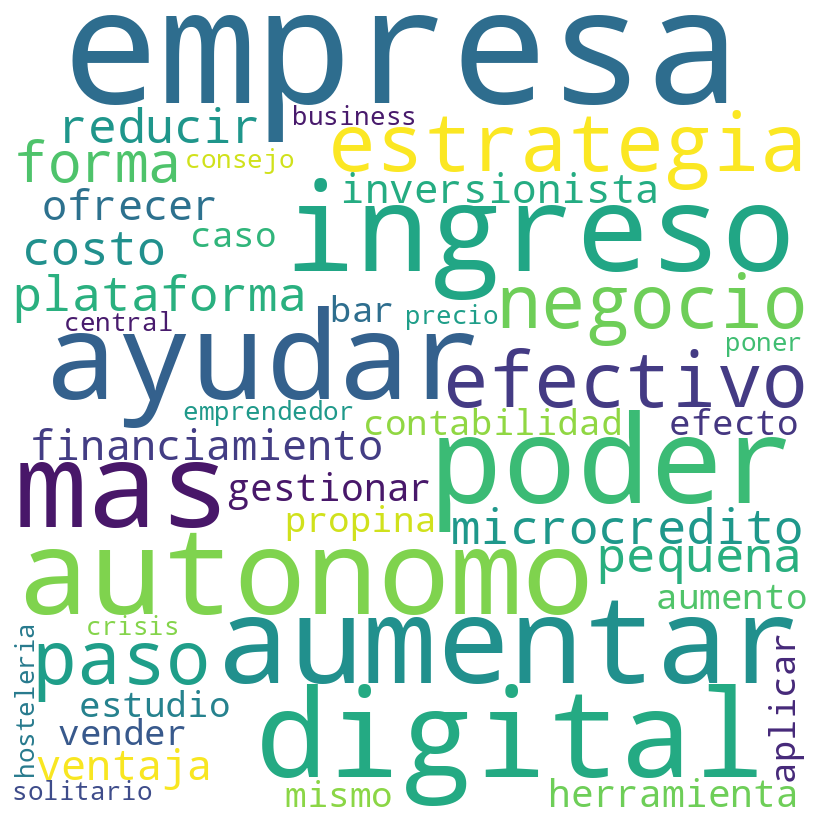

'Nube de palabras para la categoría entretenimiento'


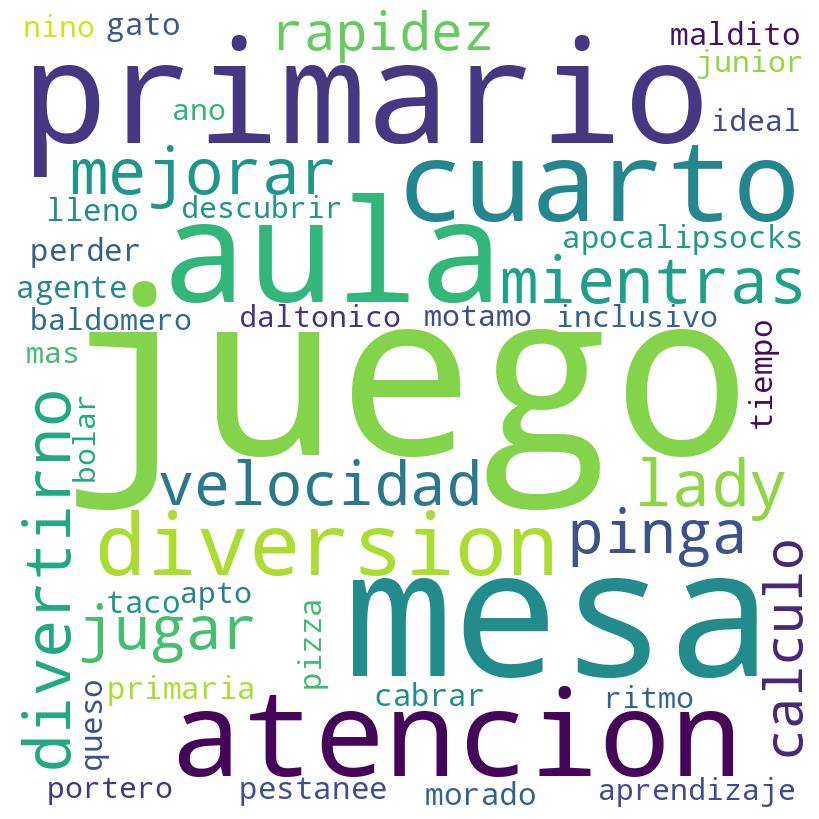

'Nube de palabras para la categoría fitness y deporte'


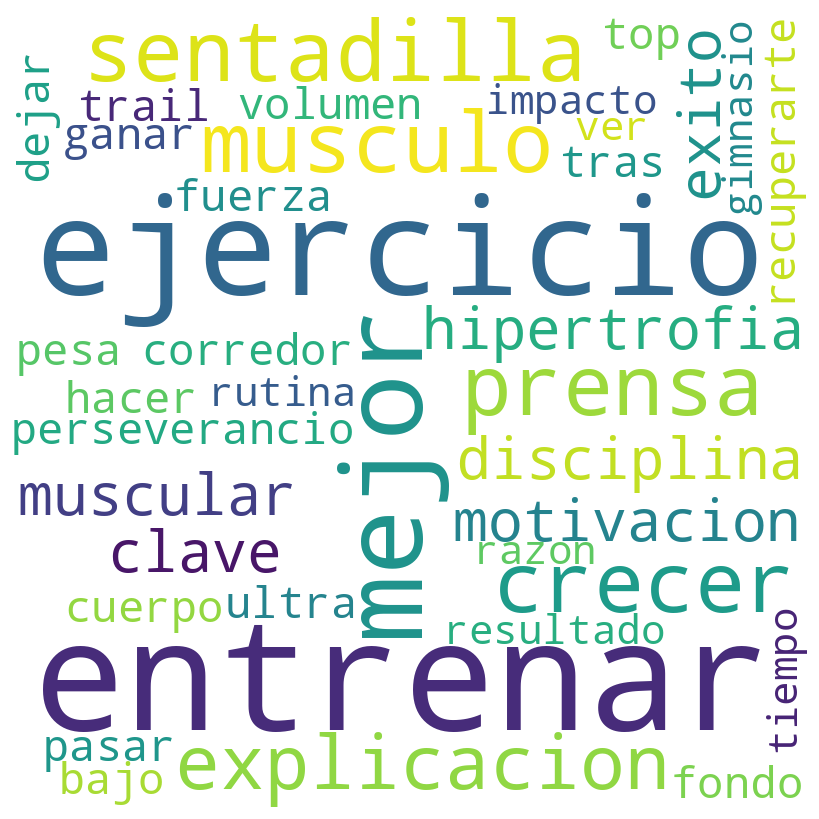

'Nube de palabras para la categoría medicina y salud'


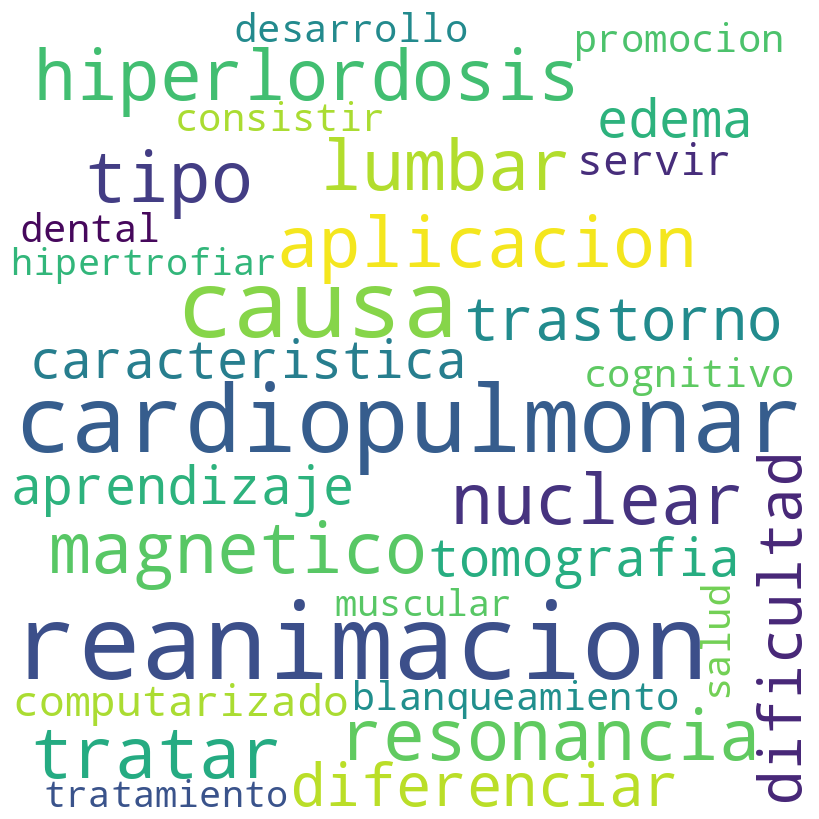

In [ ]:
for cat in categorias:
        lista_completa_titulos = df_titulos_y_categorias[df_titulos_y_categorias['categoria'] == cat]['titulo'].tolist()
        texto_completo_por_categoria = {}
        titulos_concatenados = []
        for tit in lista_completa_titulos:
                titulos_concatenados.append(' '.join(tit))

        # Une los elementos de la lista resultado en un solo texto
        texto_completo_por_categoria[cat] = ' '.join(titulos_concatenados)

        pp.pprint(f'Nube de palabras para la categoría {cat}')
        # Crear la nube de palabras
        wordcloud = WordCloud(width = 800, height = 800,
        background_color ='white',
        stopwords = None,
        min_font_size = 10).generate(texto_completo_por_categoria[cat])

        # Mostrar la imagen
        plt.figure(figsize = (8, 8), facecolor = None)
        plt.imshow(wordcloud)
        plt.axis("off")
        plt.tight_layout(pad = 0)
        plt.show()

Se encuentra que las palabras más representativas por categoría son:

- Economía y finanzas:
    - empresa
    - autónomo
    - ingreso
    - ayudar
    - digital
    - poder

- Entretenimiento:
    - juego
    - mesa
    - aula
    - primario
    - atención

- Fitness y deporte:
    - entrenar
    - ejercicio
    - sentadilla
    - mejor
    - sentadilla
    - explicación
    - crecer

- Medicina y salud:
    - reanimación
    - cardiopulmonar
    - causa
    - resonancia
    - aprendizaje

En general, se observa que las palabras más destacadas para cada categoría son representativas en su contenido y significado. También se encuentran palabras que son más generalizables en cuanto a pertenencia a algún grupo particular, poe ejemplo 'crecer' en fitness y deporte tendría sentido también en medicina y salud.


#### Preparación de los datos

Se procederá a obtener los datos necesarios para el modelo y a separarlos en entreamiento y test.

In [ ]:
titulos_a_vectorizar = df_titulos_y_categorias['titulo'].tolist()
categorias_noticias = df_titulos_y_categorias['categoria'].tolist()
categorias_noticias = [0 if categoria == 'economia y finanzas' else categoria for categoria in categorias_noticias]
categorias_noticias = [1 if categoria == 'entretenimiento' else categoria for categoria in categorias_noticias]
categorias_noticias = [2 if categoria == 'fitness y deporte' else categoria for categoria in categorias_noticias]
categorias_noticias = [3 if categoria == 'medicina y salud' else categoria for categoria in categorias_noticias]

In [ ]:
# Preparar X e y
X = titulos_a_vectorizar
y = categorias_noticias

# División del dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### Vectorización

Como se requiere que los datos estén vectorizados para que el modelo los pueda entender, la variable con los datos de entrenamiento, así como la de test serán vectorizadas.

En este caso se utilizará TF-IDF para ello. Se ha elegido esta técnica porque tiene en cuenta la ocurrencia de palabras en los docuemntos para ponderar su importancia. Esto resulta muy importante porque equilibra la influencia de las mismas en los textos. Es decir, no pasan a ser significativas por el simple hecho de repetirse muchas veces.

In [ ]:
def dummy_fun(doc):
    return doc

tfidf = TfidfVectorizer(input='content', stop_words=None)

In [ ]:
X_train_list = [' '.join(tokens) for tokens in X_train]
X_test_list = [' '.join(tokens) for tokens in X_test]

In [ ]:
X_train_vectorized = tfidf.fit_transform(X_train_list)
X_test_vectorized = tfidf.transform(X_test_list)
print(X_train_vectorized.shape)
print(X_test_vectorized.shape)
X_test_vectorized

(32, 123)
(8, 123)


<8x123 sparse matrix of type '<class 'numpy.float64'>'
	with 13 stored elements in Compressed Sparse Row format>

#### Entrenamiento modelo

Se realizará a continuación el entrenamiento del modelo con los datos separados para tal fin. Se aplicará el modelo sobre datos de test y se analizarán las métricas de rendimiento. Finalmente, se utilizará el modelo entrenado para predecir la categoría a la que pertenecen títulos nuevos, desconocidos para el modelo y se interpretarán los resultados obtenidos.

In [ ]:
# Creación y entrenamiento del modelo de Regresión Logística
modelo_LR = LogisticRegression(max_iter=1000)
modelo_LR.fit(X_train_vectorized, y_train)

LogisticRegression(max_iter=1000)

#### Predicciones y métricas

In [ ]:
labels = {
    0: 'economia y finanzas',
    1: 'entretenimiento',
    2: 'fitness y deporte',
    3: 'medicina y salud'
}

In [ ]:
# Evaluación del modelo de Regresión Logística
y_pred_LR = modelo_LR.predict(X_test_vectorized)
acc_LR = accuracy_score(y_test, y_pred_LR)
report_LR = classification_report(y_test, y_pred_LR, zero_division=1)

pp.pprint(f'Predicciones para test: {y_pred_LR}')
print("Precisión Regresión Logística:", acc_LR)
print("Reporte de clasificación Regresión Logística:\n", report_LR)

'Predicciones para test: [1 1 3 3 0 3 3 2]'
Precisión Regresión Logística: 0.625
Reporte de clasificación Regresión Logística:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       1.00      0.50      0.67         4
           2       1.00      0.50      0.67         2
           3       0.25      1.00      0.40         1

    accuracy                           0.62         8
   macro avg       0.81      0.75      0.68         8
weighted avg       0.91      0.62      0.68         8



Se realizan las siguientes observaciones:

Para la clase 0 ('economia y finanzas'), se obtiene un f1-score perfecto de 1.00, lo que indica un rendimiento excelente tanto en precisión como en recall.

Sin embargo, para las otras tres clases, el modelo tiene un rendimiento mixto. La clase 1 ('entretenimiento') tiene un recall bajo (0.50), lo que indica que el modelo tiene dificultades para identificar correctamente esta clase. Lo mismo sucede con la clase 2 ('fitness y deporte').

La clase 3 ('medicina y salud') tiene un recall perfecto, lo que indica que el modelo es muy bueno para identificar esta clase, pero el f1-score es bajo debido a un bajo valor de precisión.

#### Clasificación de nuevos títulos

Se realizará la clasificación por categoría para nuevos títulos desconocidos para el modelo.
Previamente, se hará el tratamiento pertinente sobre los nuevos datos.

In [ ]:
# Se define una lista de frases para clasificar
frases_nuevas = [
"Los 10 juegos de atención, estrategia y cálculo para tener diversión en familia.",
"Es recomendable realizar ejercicio por lo menos 1 hora dos veces a la semana.",
"La Inteligencia Artifial es genial!",
"5 cosas importantes de saber a la hora de invertir tu dinero.",
"Conocer sobre primeros auxilos, es importante para saber cómo cuidar nuestra salud.",
]

nuevas_frases = frases_nuevas.copy()
# Conversión de las frases a minúsculas
nuevas_frases = [frase.lower() for frase in nuevas_frases]

# Eliminación de acentos
for i, frase in enumerate(nuevas_frases):
    nfkd_form = unicodedata.normalize('NFKD', frase)
    nuevas_frases[i] = ''.join([c for c in nfkd_form if not unicodedata.combining(c)])

# Eliminación de puntuación en los nuevos títulos
import string

def eliminar_puntuacion(texto):
    # Utiliza la función de traducción de str.maketrans() para eliminar la puntuación
    translator = str.maketrans('', '', string.punctuation)
    texto_sin_puntuacion = texto.translate(translator)
    return texto_sin_puntuacion
# Elimina la puntuación de cada elemento en la lista
nuevas_frases = [eliminar_puntuacion(texto) for texto in nuevas_frases]

# Eliminación de números en los nuevos títulos
for i, frase in enumerate(nuevas_frases):
    nuevas_frases[i] = re.sub(r'\b\d+\b', '', frase)
nuevas_frases

# Remover stop words
for i, frase in enumerate(nuevas_frases):
    palabras = frase.split()  # Dividir la frase en palabras
    palabras_sin_stopwords = [palabra for palabra in palabras if palabra.lower() not in stop_words]
    frase_sin_stopwords = ' '.join(palabras_sin_stopwords)  # Unir las palabras de nuevo en una frase
    nuevas_frases[i] = frase_sin_stopwords


# Corrección de ortografía
# Función para corregir la ortografía de una frase
for i, frase in enumerate(nuevas_frases):
    frase_corregida = ' '.join([spell_2.correction(palabra) for palabra in frase.split()])
    nuevas_frases[i] = frase_corregida

# Lematización
# Función para lematizar una frase
for i, frase in enumerate(nuevas_frases):
    doc = nlp(frase)
    nuevas_frases[i] = [token.lemma_ for token in doc]

[['juego',
  'atención',
  'estrategia',
  'calculo',
  'tener',
  'diversion',
  'familia'],
 ['recomendable',
  'realizar',
  'ejercicio',
  'menos',
  'hora',
  'dos',
  'vez',
  'semana'],
 ['inteligencia', 'artificial', 'genial'],
 ['cosa', 'importante', 'saber', 'hora', 'invertir', 'dinero'],
 ['conocer', 'primero', 'auxilio', 'importante', 'saber', 'cuidar', 'salud']]

In [ ]:
# Transformamos las nuevas frases usando el vectorizador que usamos para entrenar el modelo
nuevas_frases_vectorizadas = tfidf.transform([' '.join(tokens) for tokens in nuevas_frases])

# Usamos el modelo entrenado para predecir las etiquetas de las nuevas frases
etiquetas_predichas = modelo_LR.predict(nuevas_frases_vectorizadas)
# Imprimimos las etiquetas predichas
for i, etiqueta in enumerate(etiquetas_predichas):
    print(f"La frase '{frases_nuevas[i]}' pertenece a la categoría: {labels[etiqueta]}")
    print('\n')

La frase 'Los 10 juegos de atención, estrategia y cálculo para tener diversión en familia.' pertenece a la categoría: entretenimiento


La frase 'Es recomendable realizar ejercicio por lo menos 1 hora dos veces a la semana.' pertenece a la categoría: fitness y deporte


La frase 'La Inteligencia Artifial es genial!' pertenece a la categoría: medicina y salud


La frase '5 cosas importantes de saber a la hora de invertir tu dinero.' pertenece a la categoría: medicina y salud


La frase 'Conocer sobre primeros auxilos, es importante para saber cómo cuidar nuestra salud.' pertenece a la categoría: medicina y salud




Se observa que para la frase '5 cosas importantes de saber a la hora de invertir tu dinero.' predice una categoría incorrecta, ya que se esperaba que fuera 'economia y finanzas'. Esto puede deberse a la calidad de los datos que se han usado para entrenar el modelo correspondientes a dicha categoría. También puede deberse a que la cantidad de registros de entrenamiento para ésa categoría no sea suficiente para detectar que la nueva frase pertenece a 'economia y finanzas'.

Para comprender mejor lo resaltado anteriormente, se analizará cuáles son las palabras que más influyen en el clasificador para definir una categoría detereminada.

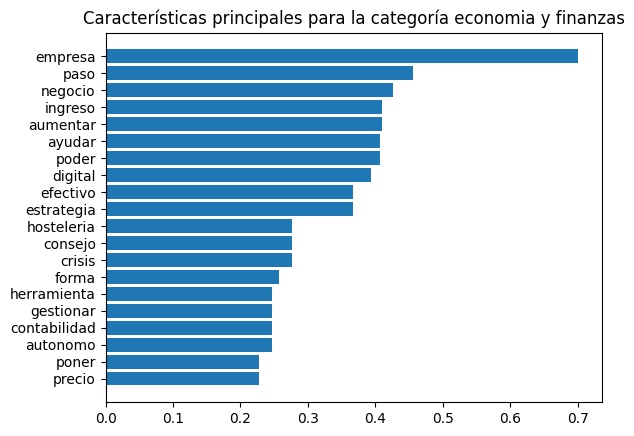

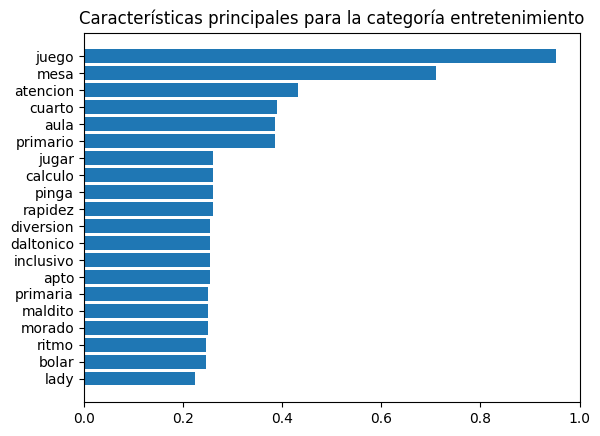

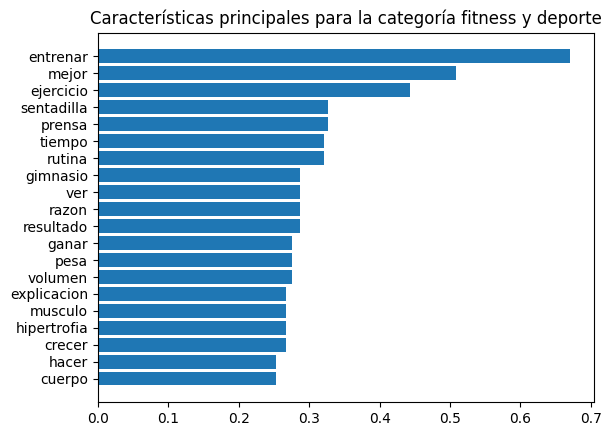

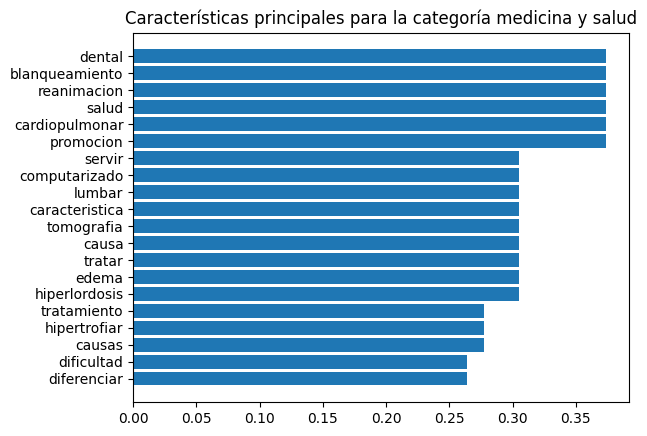

In [ ]:
# Obtención de los nombres de las características y los coeficientes
feature_names = tfidf.get_feature_names_out()
coef = modelo_LR.coef_
# Visualización los coeficientes más importantes para cada clase
num_top_features = 20
for i, label in labels.items():
    top_features_idx = np.argsort(coef[i])[-num_top_features:]
    top_features_names = [feature_names[j] for j in top_features_idx]
    top_features_coef = coef[i][top_features_idx]
    plt.figure()
    plt.barh(top_features_names, top_features_coef)
    plt.title(f'Características principales para la categoría {label}')
    plt.show()


Se encuentra que las palabras invertir y dinero, que se hubiesen esperado sean las más relevantes para ubicar a la frase '5 cosas importantes de saber a la hora de invertir tu dinero.' en la categoría 'economia y finanzas' no se encuentran presentes en el gráfico de características más influyentes para dicha categoría. El modelo halló similitudes para dicha frase con la categoría 'medicina y salud'.

Lo mismo sucedió con la frase 'La Inteligencia Artifial es genial!'. En este caso, la frase no pertenecería a ninguna categoría. No obstante, el modelo nuevamente encuentra similitud con la categoría 'medicina y salud'.

Estos resultados dan lugar a la reflexión de que, con las librerias y herramientas utilizadas en este caso, no solo el conjunto de entrenamiento para la categoría 'economia y finanzas' carece de ciertas palabras relevantes para la clasificación sino que la posibilidad de que la categoría 'medicina y salud' cuente con características que sean más generalizables a otras frases y categorías acompaña a la obtención de resultados erróneos en algunos casos.

Se procederá a continuación a realizar otro modelo que utilice embeddings.

Como de esta forma se captura la similitud semántica de los textos, se espera que mejore el desempeño al momento de clasificar nuevos títulos.

In [ ]:
# Carga del tokenizador y modelo preentrenado de BERT para español
model_name = 'dccuchile/bert-base-spanish-wwm-cased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

def get_bert_embeddings(texts):
    """Función para obtener los embeddings de BERT para una lista de textos."""
    embeddings = []
    for text in texts:
        inputs = tokenizer(text, return_tensors='pt', truncation=True, max_length=512)
        with torch.no_grad():
            outputs = model(**inputs)
        # Us del embedding del token [CLS] como la representación del texto
        embeddings.append(outputs.last_hidden_state[0][0].numpy())
    return np.array(embeddings)

Some weights of BertModel were not initialized from the model checkpoint at dccuchile/bert-base-spanish-wwm-cased and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# División del dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Reacomodamiento de tokens en un registro por cada título de noticia
X_train_list = [' '.join(tokens) for tokens in X_train]
X_test_list = [' '.join(tokens) for tokens in X_test]

['descubrir mas motamo junior juego ideal nino ano',
 'juego mesa portero baldomero aula primario',
 'agente tiempo juego lleno diversion aprendizaje',
 'recuperarte tras ultra trail',
 'caso estudio bar aumento propina aplicar mismo efecto vender mas',
 'apocalipsocks pestanee perder',
 'desarrollo cognitivo consistir',
 'top ejercicio bajo impacto entrenar']

In [ ]:
# Obtención de los embeddings de BERT para los conjuntos de entrenamiento y prueba
X_train_vectorized = get_bert_embeddings(X_train_list)
X_test_vectorized = get_bert_embeddings(X_test_list)
print(X_train_vectorized.shape)
print(X_test_vectorized.shape)

(32, 768)
(8, 768)


In [ ]:
# Creación y entrenamiento del modelo de Regresión Logística
modelo_LR = LogisticRegression(max_iter=1000)
modelo_LR.fit(X_train_vectorized, y_train)

LogisticRegression(max_iter=1000)

In [ ]:
# Evaluación del modelo de Regresión Logística
y_pred_LR = modelo_LR.predict(X_test_vectorized)
acc_LR = accuracy_score(y_test, y_pred_LR)
report_LR = classification_report(y_test, y_pred_LR, zero_division=1)
print("Precisión Regresión Logística:", acc_LR)
print("Reporte de clasificación Regresión Logística:\n", report_LR)

Precisión Regresión Logística: 0.625
Reporte de clasificación Regresión Logística:
               precision    recall  f1-score   support

           0       0.50      1.00      0.67         1
           1       1.00      0.50      0.67         4
           2       0.33      0.50      0.40         2
           3       1.00      1.00      1.00         1

    accuracy                           0.62         8
   macro avg       0.71      0.75      0.68         8
weighted avg       0.77      0.62      0.64         8



Se realizan las siguientes observaciones:

La clase 0 ('economia y finanzas') tiene un recall del 1.00, lo que indica un rendimiento excelente en la identificación de esta clase. Sin embargo, la precisión es baja (0.50), lo que sugiere que el modelo puede estar clasificando incorrectamente algunas instancias de otras clases como esta.

La clase 1 ('entretenimiento') tiene un f1-score bajo debido a un bajo valor de recall, lo que indica que el modelo tiene dificultades para identificar correctamente esta clase. Lo mismo sucede con la clase 2 ('fitness y deporte').

La clase 3 ('medicina y salud') tiene un rendimiento perfecto en todas las métricas, lo que indica que el modelo es muy bueno para identificar esta clase.

In [ ]:
nuevas_frases_list = [' '.join(tokens) for tokens in nuevas_frases]
nuevas_frases_vectorizadas = get_bert_embeddings(nuevas_frases_list)
# Haciendo predicciones con el modelo entrenado
nuevas_predicciones = modelo_LR.predict(nuevas_frases_vectorizadas)
# Mostrando las predicciones junto con las frases
for i, etiqueta in enumerate(nuevas_predicciones):
    print(f"La frase '{frases_nuevas[i]}' pertenece a la categoría: {labels[etiqueta]}")

La frase 'Los 10 juegos de atención, estrategia y cálculo para tener diversión en familia.' pertenece a la categoría: entretenimiento
La frase 'Es recomendable realizar ejercicio por lo menos 1 hora dos veces a la semana.' pertenece a la categoría: medicina y salud
La frase 'La Inteligencia Artifial es genial!' pertenece a la categoría: medicina y salud
La frase '5 cosas importantes de saber a la hora de invertir tu dinero.' pertenece a la categoría: economia y finanzas
La frase 'Conocer sobre primeros auxilos, es importante para saber cómo cuidar nuestra salud.' pertenece a la categoría: fitness y deporte


Se encuentra que la nueva frase que anteriormente era clasificada incorrectamente por el modelo vectorizado con TF-IDF ahora se halla bien clasificada. Sin embargo, 2 títulos son etiquetados con la categoría errónea. Es decir, obtuvimos más cantidad de títulos categorizados de manera equívoca.

La frase "Es recomendable realizar ejercicio por lo menos 1 hora dos veces a la semana.", en los embeddings obtenidos con BERT se posiciona más cercana a títulos de entrenamiento para la categoría 'medicina y salud'. Si bien no es lo que se esperaba, no es completamente erróneo ya que realizar ejercicio favorece la salud física. Se entiende entonces que el modelo encuentra cierta asociación semántica entre realizar ejercicio con la salud. Se destaca este detalle ya que el modelo podría haberlo categorizado como 'economía y finanzas' o 'entretenimiento', pero halló una categoría más acorde para el título.

A su vez, la frase "Conocer sobre primeros auxilos, es importante para saber cómo cuidar nuestra salud." fue etiquetada como 'fitness y deporte'. Con esta observación y la anterior, surge la idea de que posiblemente el modelo encuentre a las categorías 'medicina y salud' y 'fitness y deporte' mayor asociadas semánticamente que las demás.

"La Inteligencia Artifial es genial!" es nuevamente clasificada como 'medicina y salud'. Se sostiene la posibilidad de que los embeddings generados para dicha categoría sean más generalizables a nuevos datos.



#### Comparación de métricas

Ambos modelos tienen un rendimiento similar en términos de precisión y f1-score. Sin embargo, el modelo con BERT tiene un mejor rendimiento en la identificación de la clase 3 ('medicina y salud') en términos de l, mientras que el modelo con TF-IDF tiene un mejor rendimiento en la identificación de la clase 0 ('economia y finanzas') en términos de f1-score.

En el modelo con TF-IDF, la precisión es perfecta para tres de las clases, pero es baja (0.25) para la clase 3 ('medicina y salud'). Esto indica que el modelo tiene dificultades para predecir correctamente esta clase.
En el modelo con BERT, la precisión es alta para la mayoría de las clases, pero es baja (0.33) para la clase 2 ('fitness y deporte') y 0.50 para la clase 0 ('economia y finanzas). Esto indica que el modelo tiene dificultades para predecir correctamente estas clases.

En líneas generales el modelo para el que se usó TF-IDF sería mejor clasificando la clase 'economía y finanzas' y relativamente malo para la categorización de 'medicina y salud'. Se había observado que para nuevos títulos, el modelo clasificó uno correspondiente a economía y finanzas como medicina y salud, evidenciando la baja presición para esta última categoría, donde es muy factible encontrar falsos positivos.
Y, con el modelo en el que se ha utilizado BERT se encuentra que para nuevos títulos ha clasificado erróneamente como fitness y deporte cuando correspondía medicina y salud, evidenciando la baja presición para la primera categoría, donde es muy factible encontrar falsos positivos.

In [ ]:
from sklearn.decomposition import PCA
import plotly.express as px
import matplotlib.pyplot as plt

In [ ]:
X_train_list

['hipertrofiar muscular causas tratamiento',
 'estrategia mas efectivo aumentar ingreso negocio',
 'entrenar pesa ganar volumen',
 'business central poder ayudar empresa',
 'juego mesa taco gato cabrar queso pizza aula cuarto primario',
 'hiperlordosis lumbar tratar',
 'edema caracteristica causa',
 'poner precio paso paso',
 'juego mesa ritmo bolar aula primario',
 'mejor ejercicio fuerza corredor fondo',
 'forma aumentar ingreso empresa',
 'reanimacion cardiopulmonar reanimacion cardiopulmonar',
 'estrategia efectivo autonomos emprendedor solitario empresa',
 'jugar pinga juego atencion rapidez calculo',
 'microcredito poder ayudar pequena empresa',
 'rutina entrenar tiempo',
 'crecer musculo explicacion hipertrofia muscular',
 'plataforma digital reducir costo financiamiento ventaja ofrecer inversionista',
 'resonancia magnetico nuclear tipo aplicacion',
 'blanqueamiento dental',
 'herramienta digital gestionar contabilidad autonomo',
 'tomografia computarizado servir',
 'pasar cuer

In [ ]:
# Aplicar PCA
pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train_vectorized)
# Convertir los embeddings a un DataFrame para visualizar con plotly
df = pd.DataFrame(X_train_pca, columns=['x', 'y', 'z'])
df['word'] = ['fitness y deporte', 'economia y finanzas', 'fitness y deporte', 'economia y finanzas',
               'entretenimiento', 'medicina y salud', 'medicina y salud', 'economia y finanzas',
                'entretenimiento', 'fitness y deporte', 'economia y finanzas', 'medicina y salud',
                 'economia y finanzas', 'entretenimiento', 'economia y finanzas', 'fitness y deporte',
                  'fitness y deporte', 'economia y finanzas', 'medicina y salud', 'medicina y salud',
                   'economia y finanzas', 'medicina y salud', 'fitness y deporte', 'medicina y salud',
                    'entretenimiento', 'fitness y deporte', 'entretenimiento', 'fitness y deporte',
                     'economia y finanzas', 'entretenimiento', 'fitness y deporte', 'medicina y salud' ]
titulos_pocos_caracteres = []
for t in X_train_list:
    if len(t) > 7:
        tit = t[:7]
    titulos_pocos_caracteres.append(tit)
df['titulo'] = titulos_pocos_caracteres
colors = ['r', 'g', 'b', 'y']

# Visualizar los embeddings en 3D usando plotly
fig = px.scatter_3d(df, x='x', y='y', z='z', text='titulo', color='word', size_max=40, opacity=0.7)
fig.update_traces(marker=dict(size=10), selector=dict(mode='markers+text'))
fig.show()



Mediante el gráfico se puede observar que los títulos de entrenamiento para las categorías fitness y deporte y medicina y salud se encuentran más próximos entre ellos en el espacio vectorial que con el resto de las categorías. Esta visualización sugiere un apoyo a la hipótesis de asociación semántica del modelo para dichas categorías.

## Ejercicio 3:
Para cada categoría, realizar las siguientes tareas:
- Procesar el texto mediante recursos de normalización y limpieza.
- Con el resultado anterior, realizar conteo de palabras y mostrar la importancia de las
mismas mediante una nube de palabras.

Escribir un análisis general del resultado obtenido.

### Procesamiento de los datos

Se creará un dataframe auxiliar para el tratamiento del contenido de las noticias

In [ ]:
df_contenido_y_categorias = df_noticias[['categoria', 'contenido']]

In [ ]:
df_contenido_y_categorias.head()

,categoria,contenido
0,fitness y deporte,\nEl uso de ejercicios de prensa o sentadilla ...
1,fitness y deporte,\nTodos buscamos alcanzar el éxito en diferent...
2,fitness y deporte,\nEl ejercicio es una parte importante de un e...
3,fitness y deporte,\n \n \nLos ejercicios de fuerza son esenciale...
4,fitness y deporte,\nNo todo el mundo tiene los mismos objetivos ...


#### Conversión a minúsculas

In [ ]:
# Conversión a minúsculas
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].str.lower()
# Se muestran los titulos en minúsculas
df_contenido_y_categorias['contenido'].head()

/tmp/ipykernel_27041/4277809294.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    \nel uso de ejercicios de prensa o sentadilla ...
1    \ntodos buscamos alcanzar el éxito en diferent...
2    \nel ejercicio es una parte importante de un e...
3    \n \n \nlos ejercicios de fuerza son esenciale...
4    \nno todo el mundo tiene los mismos objetivos ...
Name: contenido, dtype: object

#### Remoción de acentos

In [ ]:
def remove_accents(titulo):
    nfkd_form = unicodedata.normalize('NFKD', titulo)
    return ''.join([c for c in nfkd_form if not unicodedata.combining(c)])

# Eliminación de acentos
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].apply(lambda x: remove_accents(x))
# Se muestran los títulos sin acentos
df_contenido_y_categorias['contenido'].tolist()[0]

/tmp/ipykernel_27041/2577338831.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



'\nel uso de ejercicios de prensa o sentadilla es muy habitual en cualquier rutina de fuerza o de entrenamiento funcional en la que se pretende trabajar correctamente el tren inferior. ahora bien, muchas veces existe la duda acerca de cual de ambos ejercicios es el mas recomendable. aqui te explicamos lo que tienes que saber al respecto.\nprensa o sentadilla: cual elegir\nlo primero de todo sera entender correctamente como funcionan ambos ejercicios. la prensa de piernas es una maquina en la que puedes ir anadiendo peso y reproduces el movimiento basico de empuje con las piernas. es muy parecido a la sentadilla, si bien es cierto que sus usos pueden variar.\npor otro lado, la sentadilla implica una colocacion de peso en la parte superior del cuerpo y descender con este manteniendo ambas piernas en paralelos. ¿cual de los dos es mas recomendable? ¿son ejercicios que se excluyan el uno al otro? vamos a responder todas estas preguntas.\n¿que ventajas ofrece la prensa de piernas?\nal trata

##### Eliminación de puntuación

In [ ]:
# Eliminación de puntuación
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].apply(lambda x: re.sub(r'[^\w\s]', '', x))
# Se muestran los títulos sin puntuación
df_contenido_y_categorias['contenido'].tolist()[0]

/tmp/ipykernel_27041/224106431.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



'\nel uso de ejercicios de prensa o sentadilla es muy habitual en cualquier rutina de fuerza o de entrenamiento funcional en la que se pretende trabajar correctamente el tren inferior ahora bien muchas veces existe la duda acerca de cual de ambos ejercicios es el mas recomendable aqui te explicamos lo que tienes que saber al respecto\nprensa o sentadilla cual elegir\nlo primero de todo sera entender correctamente como funcionan ambos ejercicios la prensa de piernas es una maquina en la que puedes ir anadiendo peso y reproduces el movimiento basico de empuje con las piernas es muy parecido a la sentadilla si bien es cierto que sus usos pueden variar\npor otro lado la sentadilla implica una colocacion de peso en la parte superior del cuerpo y descender con este manteniendo ambas piernas en paralelos cual de los dos es mas recomendable son ejercicios que se excluyan el uno al otro vamos a responder todas estas preguntas\nque ventajas ofrece la prensa de piernas\nal tratarse de una maquina

##### Remover símbolos con escasa utilidad para el análisis

In [ ]:
# Se definen los símbolos a eliminar
simbolos = ['º', '#', '%', '$', '&', 'xla', 'xxi', 'x']

for simbolo in simbolos:
# Se aplica el reemplazo utilizando una expresión regular
    df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].apply(lambda x: x.replace(simbolo, ''))

/tmp/ipykernel_27041/698786252.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Se comprueba la remoción de símbolos

In [ ]:
# Lista de símbolos a buscar
simbolos = ['º', '#', '%', '$', '&', 'xla', 'xxi', 'x']

# Se itera sobre cada símbolo y se verifica si está presente en la columna 'contenido'
for palabra in simbolos:
    print(palabra)
    if palabra == '$':
        pp.pprint(df_contenido_y_categorias[df_contenido_y_categorias['contenido'].str.contains(r'\$')]['contenido'].to_list())
    else:
        pp.pprint(df_contenido_y_categorias[df_contenido_y_categorias['contenido'].str.contains(rf'\b{palabra}\b')]['contenido'].to_list())
        pp.pprint(df_contenido_y_categorias[df_contenido_y_categorias['contenido'].str.contains(rf'\b{palabra}')]['contenido'].to_list())
        pp.pprint(df_contenido_y_categorias[df_contenido_y_categorias['contenido'].str.contains(rf'{palabra}\b')]['contenido'].to_list())

º
[]
[]
[]
#
[]
[]
[]
%
[]
[]
[]
$
[]
&
[]
[]
[]
xla
[]
[]
[]
xxi
[]
[]
[]
x
[]
[]
[]


#### Remover números

In [ ]:
# Se remueven los números presentes en el contenido
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].str.replace(r'\b\d+\b', '', regex=True)
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].str.replace(r'\b\d+', '', regex=True)
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].str.replace(r'\d+\b', '', regex=True)
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].str.replace(r'\d+', '', regex=True)

# Se muestran los conenidos sin números incluídos
df_contenido_y_categorias['contenido'].head()

/tmp/ipykernel_27041/3505159145.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_27041/3505159145.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_27041/3505159145.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2

0    \nel uso de ejercicios de prensa o sentadilla ...
1    \ntodos buscamos alcanzar el eito en diferente...
2    \nel ejercicio es una parte importante de un e...
3    \n \n \nlos ejercicios de fuerza son esenciale...
4    \nno todo el mundo tiene los mismos objetivos ...
Name: contenido, dtype: object

#### Remover stopwords

In [ ]:
# Se aplica la función a cada contenido
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].apply(remove_stopwords)
# Se muestran los contenidos sin stopwords
df_contenido_y_categorias['contenido'].head()

/tmp/ipykernel_27041/2270973137.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    uso ejercicios prensa sentadilla habitual cual...
1    buscamos alcanzar eito diferentes aspectos vid...
2    ejercicio parte importante estilo vida saludab...
3    ejercicios fuerza esenciales corredores piensa...
4    mundo mismos objetivos gimnasio tambien mucha ...
Name: contenido, dtype: object

#### Tratamientno de abreviaturas

In [ ]:
# Se utiliza el método str.findall() para encontrar todas las palabras con 3 caracteres o menos
palabras_tres_caracteres = df_contenido_y_categorias['contenido'].str.findall(r'\b\w{1,3}\b')

# Se crea una lista de palabras únicas encontradas
palabras_unicas = set([palabra for lista_palabras in palabras_tres_caracteres.dropna() for palabra in lista_palabras])

# Se filtran los registros que contienen palabras con 3 caracteres o menos
registros_con_palabras_cortas = df_contenido_y_categorias[df_contenido_y_categorias['contenido'].str.contains(r'\b\w{1,3}\b', na=False)]

print('Posibles abreviaciones:')
pp.pprint(palabras_unicas)

Posibles abreviaciones:
{   'ads',
    'ahi',
    'ano',
    'app',
    'as',
    'asi',
    'aun',
    'cm',
    'crm',
    'da',
    'dan',
    'dar',
    'das',
    'dea',
    'den',
    'dia',
    'dos',
    'erp',
    'etc',
    'fan',
    'fe',
    'fin',
    'fp',
    'gel',
    'gym',
    'haz',
    'hip',
    'hoy',
    'ido',
    'ir',
    'iva',
    'jr',
    'led',
    'leg',
    'ley',
    'luz',
    'mal',
    'mar',
    'mas',
    'mes',
    'mil',
    'min',
    'nee',
    'oir',
    'olo',
    'oms',
    'pan',
    'par',
    'pie',
    'pon',
    'rcp',
    'red',
    'rmn',
    'rol',
    'sal',
    'seo',
    'ser',
    'si',
    'tac',
    'tal',
    'tan',
    'tc',
    'tcg',
    'ten',
    'the',
    'u',
    'up',
    'usa',
    'use',
    'uso',
    'va',
    'van',
    'vas',
    've',
    'vea',
    'ven',
    'ver',
    'ves',
    'vez',
    'vip',
    'vos',
    'voy',
    'we',
    'web',
    'you'}


Se reemplazan las abreviaturas por la palabra completa

In [ ]:
# Diccionario de abreviaturas y sus palabras completas
abreviaturas = {
    'gym': 'gimnasio',
    'jr': 'junior',
    'rcp': 'reanimacion cardiopulmonar',
    'pymes': 'empresa',
    'empresas': 'empresa',
    'microempresa': 'empresa',
    'microempresas': 'empresa',
    'ads': 'anuncio',
    'crm': 'gestion relaciones clientes',
    'cm': 'centimetro',
    'etc': 'etcetera',
    'fp': 'protesis dental',
    'tc': 'tomografia computarizada'

}

# Se itera sobre cada abreviatura y se realiza el reemplazo
for abreviatura, palabra_completa in abreviaturas.items():
    df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].str.replace(abreviatura, palabra_completa, case=False)

/tmp/ipykernel_27041/4056449562.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Se comprueba que los cambios se han realizado correctamente

In [ ]:
# Lista de palabras a buscar
palabras_a_buscar = ['gym', 'rcp', 'jr', 'pymes', 'ads', 'crm', 'cm', 'etc', 'fp', 'tc']

# Se inicializa una serie booleana con False
registros_con_palabras = pd.Series(False, index=df_noticias.index)

# Se itera sobre cada palabra y se verifica si está presente en la columna 'contenido'
for palabra in palabras_a_buscar:
    registros_con_palabras = registros_con_palabras | df_contenido_y_categorias['contenido'].str.contains(rf'\b{palabra}\b', case=False)

# Se filtran los registros que contienen al menos una de las palabras
registros_contienen_palabras = df_contenido_y_categorias[registros_con_palabras]['contenido']

# Muestra los registros que cumplen con la condición
print("Cantidad de registros que contienen palabras abreviadas: ", len(registros_contienen_palabras))

Cantidad de registros que contienen palabras abreviadas:  0


#### Corrección de ortografía

In [ ]:
df_ortografia_contenido = pd.DataFrame()
df_contenido_y_categorias_aux = pd.DataFrame()
df_contenido_y_categorias_aux = df_contenido_y_categorias['contenido']
df_ortografia_contenido['contenido'] = df_contenido_y_categorias['contenido']

# Aplicar la corrección ortográfica
df_ortografia_contenido['contenido_spellchecker'] = df_contenido_y_categorias['contenido'].apply(lambda x: ' '.join([spell_2.correction(i) if spell_2.correction(i) is not None else i for i in x.split()]))

In [ ]:
# Aplicar la función para encontrar diferencias y almacenarlas en nuevas columnas
diferencias_spellchecker = encontrar_diferencias(df_ortografia_contenido['contenido'].apply(lambda x: x.split()), df_ortografia_contenido['contenido_spellchecker'].apply(lambda x: x.split()))

Diferencias SpellChecker

In [ ]:
pp.pprint(diferencias_spellchecker)
print('Antes', 'Después')
print('Cantidad de palabras cambiadas: ', len(diferencias_spellchecker))

[   ('anadiendo', 'añadiendo'),
    ('colocacion', 'colocación'),
    ('articulacion', 'articulación'),
    ('opcion', 'opción'),
    ('estetico', 'estático'),
    ('funcion', 'funciona'),
    ('lesivo', 'lesión'),
    ('preparacion', 'preparación'),
    ('seleccion', 'selección'),
    ('estabilizacion', 'estabilización'),
    ('anadir', 'añadir'),
    ('combinarla', 'combinarlo'),
    ('estimulos', 'estímulos'),
    ('isquios', 'esquivos'),
    ('superseries', 'superheroes'),
    ('estimularas', 'estimular'),
    ('funcion', 'funciona'),
    ('determinacion', 'determinación'),
    ('motivacion', 'motivación'),
    ('motivacion', 'motivación'),
    ('motivacion', 'motivación'),
    ('resiliencia', 'resistencia'),
    ('utilizalo', 'utilizado'),
    ('determinacion', 'determinación'),
    ('motivacion', 'motivación'),
    ('motivacion', 'motivación'),
    ('motivacion', 'motivación'),
    ('motivacion', 'motivación'),
    ('motivacion', 'motivación'),
    ('motivacion', 'motivación'),
 

In [ ]:
# Aplicar la corrección ortográfica
df_contenido_y_categorias['contenido'] = df_ortografia_contenido['contenido_spellchecker']

/tmp/ipykernel_27041/661930632.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Se comprueba que se haya realizado correctamente la corrección ortográfica

In [ ]:
diferencias_spellchecker = encontrar_diferencias(df_contenido_y_categorias['contenido'].apply(lambda x: x.split()), df_ortografia_contenido['contenido_spellchecker'].apply(lambda x: x.split()))
diferencias_spellchecker

[]

Se han encontrado palabras que tienen que conservarse como se encontraban originalmente por su significado

In [ ]:
# Diccionario de abreviaturas y sus palabras completas
abreviaturas_2 = {
    'matado': 'motamo',
    'bandolero': 'baldomero',
    'inclusive': 'inclusiva',
    'venidas': 'renidas',
    'participara': 'partida',
    'vestidos': 'gesto',
    'balazo': 'bolazo',
    'ganarse':'danarse',
    'jugosa': 'jugar',
    'vizconde': 'vez',
    'aromáticos': 'cromaticos',
    'automatico': 'acromatico',
    'acadio': 'anadio',
    'yme': 'empresa',
    'superheroe': 'serie'}

# Se itera sobre cada abreviatura y se realiza el reemplazo
for abreviatura, palabra_completa in abreviaturas_2.items():
    df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].apply(lambda x: x.replace(abreviatura, palabra_completa))

/tmp/ipykernel_27041/1973902150.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Se comprueba que las palabras se hayan reacondicionado correctamente. Se deberían ver las diferencias por las palabras cambiadas.

In [ ]:
diferencias_spellchecker_2 = encontrar_diferencias(df_ortografia_contenido['contenido_spellchecker'].apply(lambda x: x.split()), df_contenido_y_categorias['contenido'].apply(lambda x: x.split()))
print('Antes', 'Después')
diferencias_spellchecker_2

Antes Después


[('superheroes', 'series'),
 ('ganarse', 'danarse'),
 ('automatico', 'acromatico'),
 ('yme', 'empresa'),
 ('yme', 'empresa'),
 ('yme', 'empresa'),
 ('acadio', 'anadio'),
 ('inclusive', 'inclusiva'),
 ('aromáticos', 'cromaticos'),
 ('automatico', 'acromatico'),
 ('vizconde', 'vez'),
 ('jugosa', 'jugar'),
 ('ganarse', 'danarse'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('bandolero', 'baldomero'),
 ('balazo', 'bolazo'),
 ('vestidos', 'gesto'),
 ('matado', 'motamo'),
 ('participara', 'partida'),
 ('venidas', 'renidas')]

#### Tratamiento de emojis

In [ ]:
import emoji

In [ ]:
# Eliminación de emojis
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].apply(lambda x: emoji.replace_emoji(x, replace=' '))

/tmp/ipykernel_27041/4271237110.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### Lematización

In [ ]:
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].apply(lambda x: nlp(x))
df_contenido_y_categorias['contenido'] = df_contenido_y_categorias['contenido'].apply(lambda x: [tok.lemma_.lower() for tok in x])

/tmp/ipykernel_27041/1896692675.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_27041/1896692675.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Eliminación de acentos

contenido_sin_acentos = []
for noticia in df_contenido_y_categorias['contenido'].tolist():
    noticia_sin_acentos = []
    for p in noticia:
        p_sin_acentos = remove_accents(p)
        noticia_sin_acentos.append(p)
    contenido_sin_acentos.append(noticia_sin_acentos)

df_contenido_y_categorias['contenido'] = contenido_sin_acentos
# Se muestran los títulos sin acentos
df_contenido_y_categorias['contenido'].head()

/tmp/ipykernel_27041/2237833523.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    [uso, ejercicio, prensar, sentadilla, habitual...
1    [buscar, alcanzar, este, diferente, aspecto, v...
2    [ejercicio, parte, importante, estilo, vida, s...
3    [ejercicio, fuerza, esencial, corredor, pensar...
4    [mundo, mismo, objetivo, gimnasio, tambien, mu...
Name: contenido, dtype: object

Se realizará un acondicionamiento adicional para eliminar acentos y posibles stopwords que pudieran estar presentes luego de todo el proceso.

In [ ]:
# Se define la función para remover acentos y posibles stopwords
def eliminar_acentos_y_cortos(lista):
    nueva_lista = []
    for elemento in lista:
        # Eliminar acentos
        elemento = unidecode(elemento)

        # Verificar longitud
        if len(elemento) > 2:
            nueva_lista.append(elemento)

    return nueva_lista

In [ ]:
# Eliminación de acentos

lista_contenido = []
for noticia in df_contenido_y_categorias['contenido'].tolist():
    noticia_sin_acentos = eliminar_acentos_y_cortos(noticia)

    lista_contenido.append(noticia_sin_acentos)

df_contenido_y_categorias['contenido'] = lista_contenido
# Se muestran los títulos sin acentos
df_contenido_y_categorias['contenido'].head()

/tmp/ipykernel_27041/2940324698.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    [uso, ejercicio, prensar, sentadilla, habitual...
1    [buscar, alcanzar, este, diferente, aspecto, v...
2    [ejercicio, parte, importante, estilo, vida, s...
3    [ejercicio, fuerza, esencial, corredor, pensar...
4    [mundo, mismo, objetivo, gimnasio, tambien, mu...
Name: contenido, dtype: object

#### Frecuencias de palabras

Se define y aplica una función para crear un diccionario de frecuencias donde cada key sea la categoría de noticias y los values diccionarios con las palabras como keys y los valores la cantidad de ocurrencias de dichas palabras.

In [ ]:
nltk.download('punkt')
diccionario_frecuencias_por_categoria = {}
for cat in categorias:
    dict_frecuencias = {}
    iterable = df_contenido_y_categorias[df_contenido_y_categorias['categoria'] == cat]['contenido'].to_list()
    diccionario_combinado = {}
    for i in range(len(iterable)):
        dict_frecuencias[i] = FreqDist(iterable[i])

    for key, value in dict_frecuencias.items():
        diccionario_combinado = combinar_diccionarios(value, dict(diccionario_combinado))
    diccionario_frecuencias_por_categoria[cat] = dict(diccionario_combinado)

print('Diccionario de frecuencias para las categorías de las noticias')
pp.pprint(diccionario_frecuencias_por_categoria)

[nltk_data] Downloading package punkt to /home/flor/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Diccionario de frecuencias para las categorías de las noticias
{   'economia y finanzas': {   'abanico': 1,
                               'abarca': 3,
                               'abarcar': 1,
                               'abarco': 1,
                               'abordarer': 1,
                               'abracer': 1,
                               'abrazar': 2,
                               'abrazar el': 1,
                               'abrir': 2,
                               'absolutamente': 3,
                               'acabar': 4,
                               'acabe': 1,
                               'academico': 1,
                               'acceder': 4,
                               'accesibl': 1,
                               'accesible': 1,
                               'acceso': 7,
                               'accesorio': 1,
                               'accion': 7,
                               'aceptable': 1,
                          

Ploteo de las nubes de palabras por categoría

'Nube de palabras para la categoría economia y finanzas'


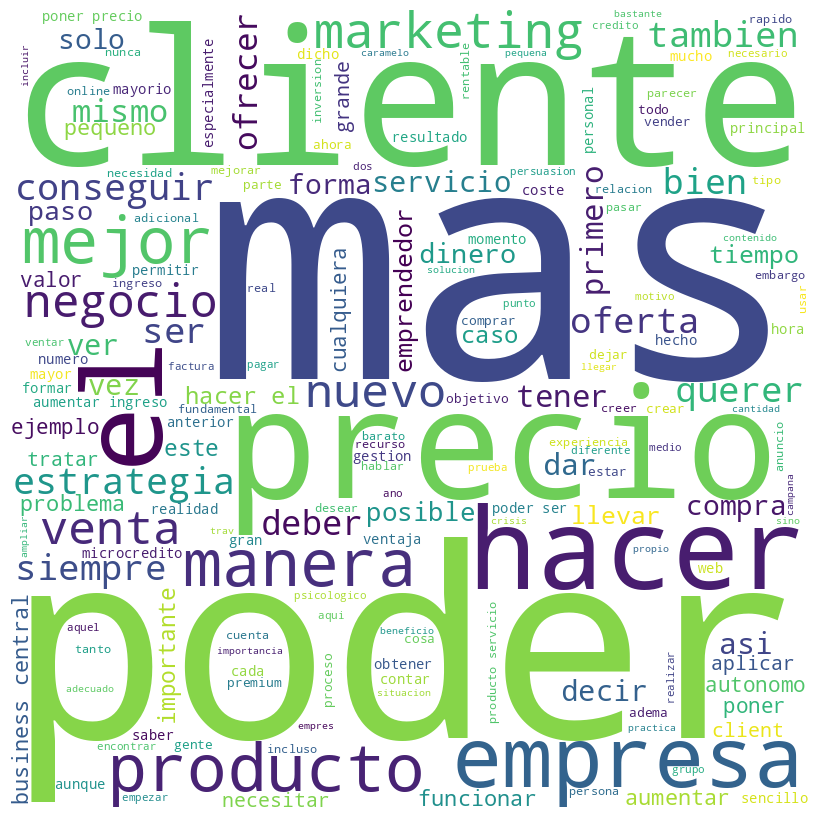

'Nube de palabras para la categoría entretenimiento'


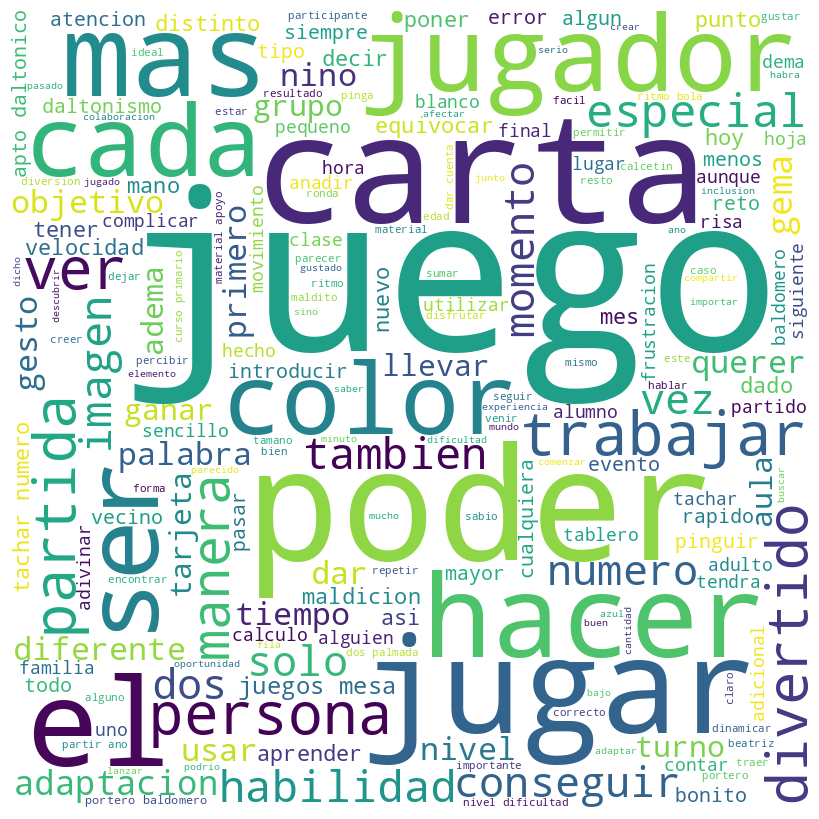

'Nube de palabras para la categoría fitness y deporte'


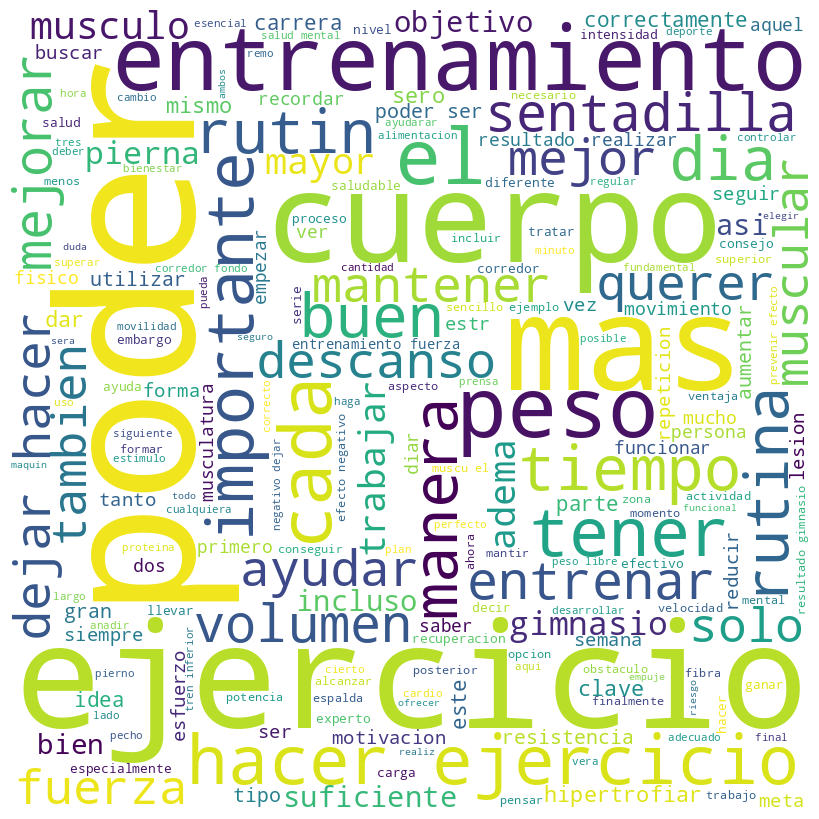

'Nube de palabras para la categoría medicina y salud'


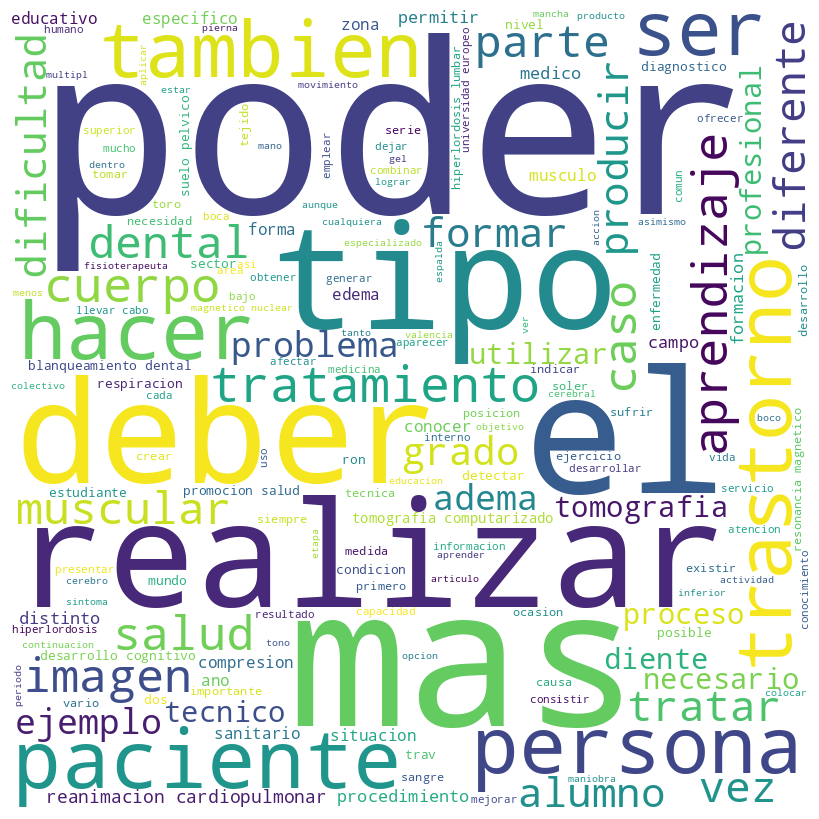

In [ ]:
for cat in categorias:
        lista_completa_noticias = df_contenido_y_categorias[df_contenido_y_categorias['categoria'] == cat]['contenido'].tolist()
        texto_completo_por_categoria = {}
        contenido_concatenado = []
        for n in lista_completa_noticias:
                contenido_concatenado.append(' '.join(n))

        # Une los elementos de la lista resultado en un solo texto
        texto_completo_por_categoria[cat] = ' '.join(contenido_concatenado)

        pp.pprint(f'Nube de palabras para la categoría {cat}')
        # Crear la nube de palabras
        wordcloud = WordCloud(width = 800, height = 800,
        background_color ='white',
        stopwords = None,
        min_font_size = 10).generate(texto_completo_por_categoria[cat])

        # Mostrar la imagen
        plt.figure(figsize = (8, 8), facecolor = None)
        plt.imshow(wordcloud)
        plt.axis("off")
        plt.tight_layout(pad = 0)
        plt.show()

Se observa que existen palabras que permiten distinguir claramente la pertenencia a una categoría específica y son palabras con considerablemente destacadas.

No obstante, hay ciertas palabras que se advierte que presentan una frecuencia elevada en los textos: 'poder' y 'mas'.  Las palabras "poder" y "más" ocupan mucho espacio en la nube de palabrasa en todas las categorías, lo que sugiere que son términos muy comunes en tu conjunto de noticias.

Dado que estas palabras no proporcionan una discriminación clara entre las categorías y no aportan información relevante para distinguir el contenido de las noticias, se considera beneficioso eliminarlas antes de realizar cualquier análisis de texto o clasificación. Es decir, dichas palabras serán onsideradas stop words, ya que no aportan a la diferenciación nítida de los contenidos por categoría, lo que permitirá enfocarse en términos más informativos y relevantes para la clasificación.

En resumen, se considera que eliminar las palabras "poder" y "más" de las noticias podría ayudar a mejorar la calidad y relevancia de las características utilizadas para una eventual clasificación, lo que posiblemente conduzca a un mejor rendimiento en los modelos de clasificación.


In [ ]:
# Se define la función para remover stopwords 'poder' y 'mas'
def eliminar_stopwords(lista):
    nueva_lista = []
    for elemento in lista:
        elemento = elemento.strip()
        if elemento == 'el':
            print(elemento)
        # Eliminar stopwords
        if elemento != 'poder' and elemento != 'mas' and elemento != 'el' and elemento != 'hacer' and elemento != 'deber' and elemento != 'realizar' and elemento != 'tambien':
            nueva_lista.append(elemento)

    return nueva_lista

In [ ]:
# Eliminación de stopwords

lista_contenido = []
for noticia in df_contenido_y_categorias['contenido'].tolist():
    noticia_sin_stopwords = eliminar_stopwords(noticia)

    lista_contenido.append(noticia_sin_stopwords)

df_contenido_y_categorias['contenido'] = lista_contenido
# Se muestran los títulos sin acentos
df_contenido_y_categorias['contenido'].head()

/tmp/ipykernel_27041/1265420592.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0    [uso, ejercicio, prensar, sentadilla, habitual...
1    [buscar, alcanzar, este, diferente, aspecto, v...
2    [ejercicio, parte, importante, estilo, vida, s...
3    [ejercicio, fuerza, esencial, corredor, pensar...
4    [mundo, mismo, objetivo, gimnasio, mucho, gent...
Name: contenido, dtype: object

In [ ]:
from wordcloud import STOPWORDS

In [ ]:
stop_words = STOPWORDS.update(["el"])

'Nube de palabras para la categoría economia y finanzas'


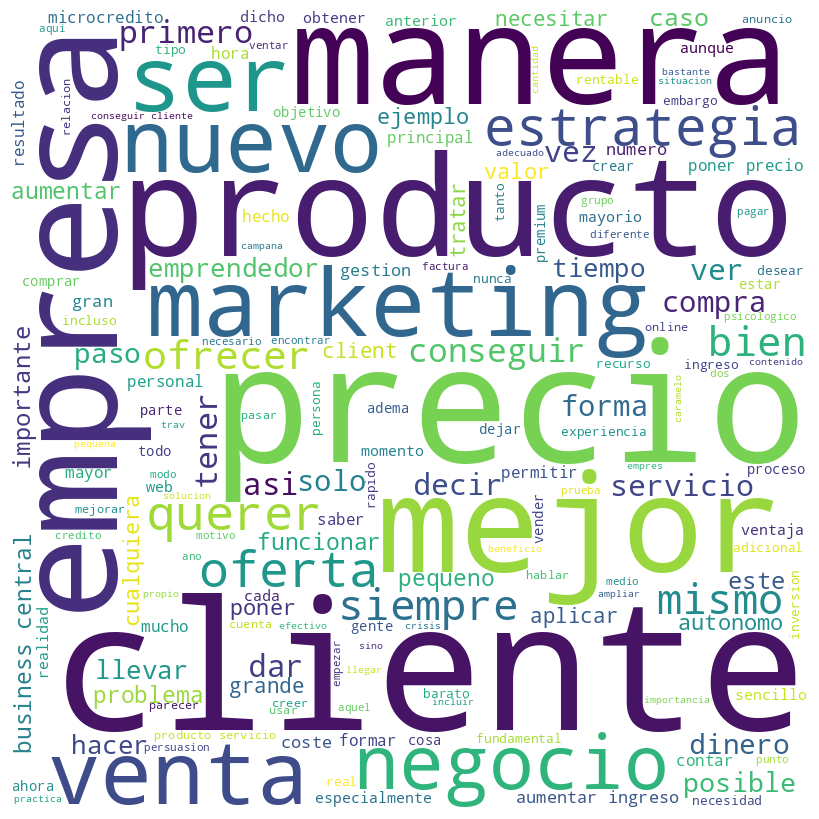

'Nube de palabras para la categoría entretenimiento'


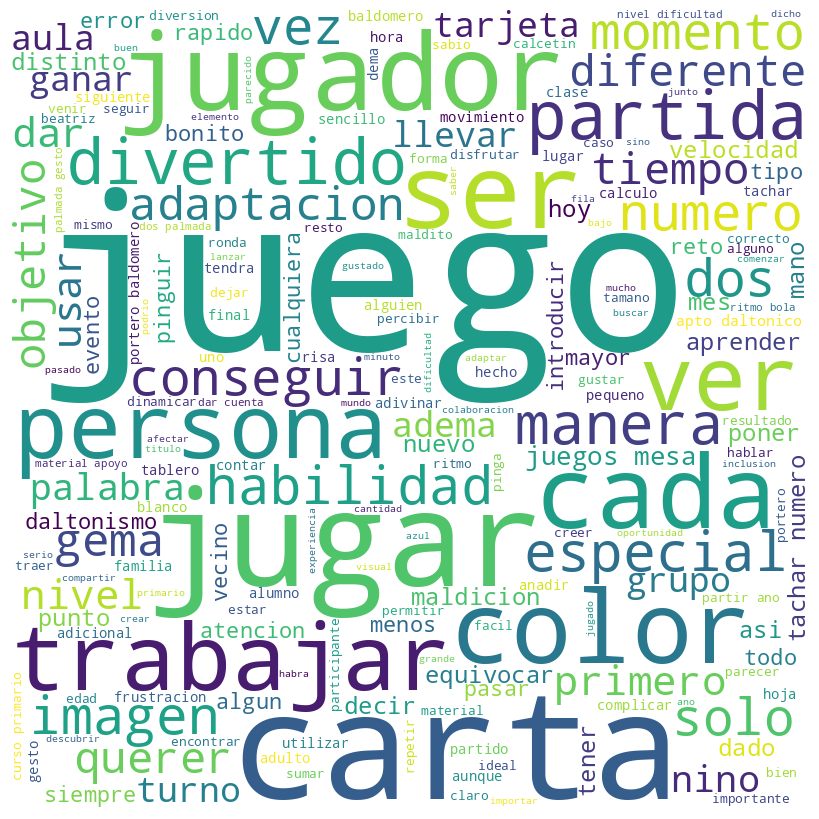

'Nube de palabras para la categoría fitness y deporte'


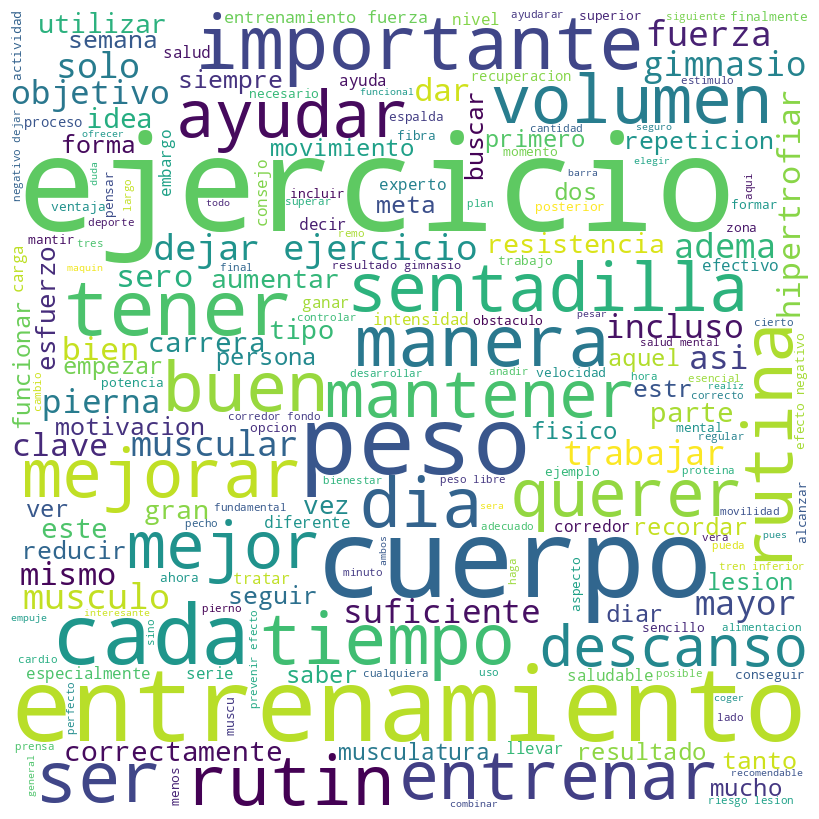

'Nube de palabras para la categoría medicina y salud'


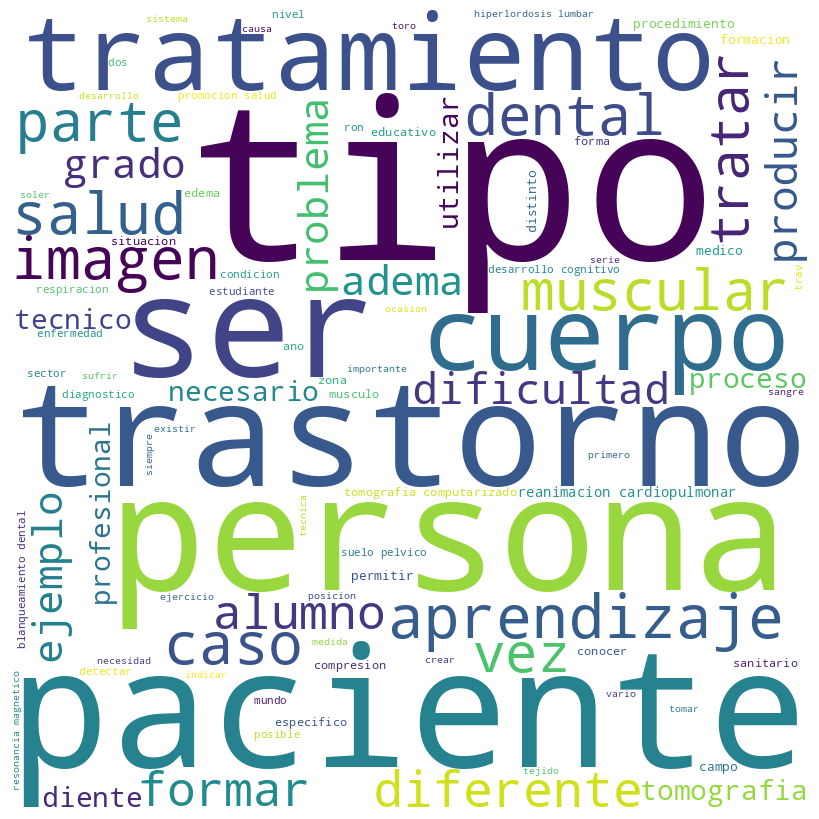

In [ ]:
for cat in categorias:
        lista_completa_noticias = df_contenido_y_categorias[df_contenido_y_categorias['categoria'] == cat]['contenido'].tolist()
        texto_completo_por_categoria = {}
        contenido_concatenado = []
        for n in lista_completa_noticias:
                contenido_concatenado.append(' '.join(n))

        # Une los elementos de la lista resultado en un solo texto
        texto_completo_por_categoria[cat] = ' '.join(contenido_concatenado)

        pp.pprint(f'Nube de palabras para la categoría {cat}')
        # Crear la nube de palabras
        wordcloud = WordCloud(width = 800, height = 800,
        background_color ='white',
        stopwords = stop_words,
        min_font_size = 10).generate(texto_completo_por_categoria[cat])

        # Mostrar la imagen
        plt.figure(figsize = (8, 8), facecolor = None)
        plt.imshow(wordcloud)
        plt.axis("off")
        plt.tight_layout(pad = 0)
        plt.show()

Se ha conseguido que las palabras que aportan información relevante y discriminativa para cada categoría sean de las más destacadas en los textos, viendose reflejado en los gráficos.

Es oportuno destacar, luego del extenso proceso de acondicionamiento de los datos, que al observar en detalle las nuevas nubes de palabras, se pueden detectar nuevamente elementos que podrían considerarse stopwords. Es decir, el proceso de acondicionamiento de los datos es inexorablemente iterativo y cuan exhaustivo sea dependerá de los objetivos a alcanzar.

## Ejercicio 4:
Use los modelos de embedding propuestos sobre el final de la Unidad 2 para evaluar la
similitud entre los títulos de las noticias de una de las categorías.

Reflexione sobre las limitaciones del modelo en base a los resultados obtenidos, en
contraposición a los resultados que hubiera esperado obtener

Se importan las librerías necesarias

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

Se obtiene la lista de títulos para la categoría seleccionada. En este caso, fitness y deporte.

In [ ]:
titulos_noticias_deportes_y_fitness = df_titulos_y_categorias[df_titulos_y_categorias['categoria'] == 'fitness y deporte']['titulo'].tolist()
titulos_noticias_deportes_y_fitness = [' '.join(tokens) for tokens in titulos_noticias_deportes_y_fitness]

#### Similaridad con Doc2Vec

Para evaluar la similaridad entre títulos se hará uso de la librería Doc2Vec que es una extensión de Word2Vec pero para utilizar sobre oraciones o documentos completos.

Como los títulos son oraciones y queremos que se establezcan similaridades entre los títulos nompletos y no entre palabras aisladas, Doc2Vec parece adecuado para tal fin.

In [ ]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/flor/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

Se tokenizan y etiquetan los datos para poder entrenar al modelo.

In [ ]:
# Tokenizar los datos y etiquetarlos
tagged_data = [TaggedDocument(words=word_tokenize(_d), tags=[str(i)]) for i, _d in enumerate(titulos_noticias_deportes_y_fitness)]
# Configurar parámetros para el modelo
model = Doc2Vec(tagged_data,vector_size=20, window=2, min_count=1, workers=4, epochs=1000)
# Construir el vocabulario
model.build_vocab(tagged_data)

print('Ejemplo de uno de los vectores creados: ')
print(model.dv[0])

Ejemplo de uno de los vectores creados: 
[ 0.24275713  0.06610519 -0.77662414  0.28664443  0.3463192  -0.34895423
 -0.6958674  -0.3809966  -0.49561387 -0.48375234 -0.01520822  0.8068808
 -0.9807494  -1.035677   -0.45254412  0.01862027  0.34225607  0.36886498
 -1.0033308   0.01745775]


Se obtendrá la lista de titulos originales para la categoría seleccionada. Se realiza este paso para poder mostrar un título más prolijo y sintacticamente coherente al momento de observar las similitudes.

Luego, se obtendrán por título, auquel otro que tenga la mayor similitud encontrada.

In [ ]:
# Se obtiene una lista con los títulos originales para la categoría fitness y deporte
tutilos_originales_fitness_y_deporte = df_noticias[df_noticias['categoria'] == 'fitness y deporte']['titulo'].tolist()

In [ ]:
for i in range(10):
    # Encontrar el documento más similar al vector inferido
    similares = model.docvecs.most_similar([model.dv[i]], topn=10)
    # La función most_similar devuelve una lista de tuplas (etiqueta, similitud)
    etiqueta_similar_max, similitud_max = similares[1]
    print(f'El título con mayor similitud para ""{tutilos_originales_fitness_y_deporte[i]}"" es: ""{tutilos_originales_fitness_y_deporte[int(etiqueta_similar_max)]}"" con una similitud de ""{similitud_max}"".')


    etiqueta_similar_min, similitud_min = similares[9]
    print(f'El título con menor similitud para ""{tutilos_originales_fitness_y_deporte[i]}"" es: ""{tutilos_originales_fitness_y_deporte[int(etiqueta_similar_min)]}"" con una similitud de ""{similitud_min}"".')
    print('\n')

El título con mayor similitud para ""  ¿Qué es mejor, prensa o sentadilla?"" es: ""  La clave del éxito para entrenar: motivación, disciplina y perseverancia"" con una similitud de ""0.6796526908874512"".
El título con menor similitud para ""  ¿Qué es mejor, prensa o sentadilla?"" es: ""  ¿Qué le pasa a tu cuerpo cuando dejas de hacer ejercicio?"" con una similitud de ""0.470191091299057"".


El título con mayor similitud para ""  La clave del éxito para entrenar: motivación, disciplina y perseverancia"" es: ""  ¿Qué es mejor, prensa o sentadilla?"" con una similitud de ""0.6796526908874512"".
El título con menor similitud para ""  La clave del éxito para entrenar: motivación, disciplina y perseverancia"" es: ""  ¿Por qué no veo resultados en el gym? Estas son las razones"" con una similitud de ""0.31812843680381775"".


El título con mayor similitud para ""  ¿Qué le pasa a tu cuerpo cuando dejas de hacer ejercicio?"" es: ""  Cómo recuperarte tras un ultra trail"" con una similitud de 

/tmp/ipykernel_27041/3159796061.py:3: DeprecationWarning:

Call to deprecated `docvecs` (The `docvecs` property has been renamed `dv`.).



Se observa que los niveles de mayor similitud hallada entre los títulos es razonablemente alta. En algunos caso llegando hasta casi el 80%. Hay títulos que representan la mayor similaridad con más de un título. Se entiende que en el espacio vectorial que los representa, dichos títulos se encuentran muy cercanos con los demás. Es decir, el ángulo entre dichos vectores es de los menores encontrados.
Se esperaba hallar resultados de estas características para las similaridades más altas. No se aspiraba a similaridades que lleguen a 1 ya que para ello los títulos deberían ser exactamente iguales y, si bien corresponden a la misma temática, dentro de ella se pueden hallar diversos subtemas.

En cuanto a las menores similaridades halladas entre los títulos de las noticias se considera que continuan representando una similaridad bastante alta en algunos casos, (mayores a 0.4). El umbral más bajo ha sido 0.31.

#### Similaridad con Universal Sentence Encoding

Se observarán ahora las similaridades obtenidas entre los títulos utilizando un modelo de encoding que captura el significado semántico de lo que representa. Tal vez, bajo esta consideración, se robustece la interpretación de la similitu entre títulos.

In [ ]:
import bokeh
import bokeh.models
import bokeh.plotting
from bokeh.models import ColumnDataSource
from bokeh.models import LabelSet
import os
import tensorflow.compat.v2 as tf
import tensorflow_hub as hub
import tensorflow_text

In [ ]:
def visualize_similarity(embeddings_1, embeddings_2, labels_1, labels_2, tit_g_1, tit_g_2,

    plot_title,
    plot_width=1200, plot_height=600,
    xaxis_font_size='12pt', yaxis_font_size='12pt'):

    assert len(embeddings_1) == len(labels_1)
    assert len(embeddings_2) == len(labels_2)
    # arccos based text similarity (Yang et al. 2019; Cer et al. 2019)
    sim = 1 - np.arccos(cosine_similarity(embeddings_1, embeddings_2))/np.pi
    embeddings_1_col, embeddings_2_col, sim_col = [], [], []
    for i in range(len(embeddings_1)):
        for j in range(len(embeddings_2)):
            embeddings_1_col.append(tit_g_1[i])
            embeddings_2_col.append(tit_g_2[j])
            sim_col.append(sim[i][j])
    df = pd.DataFrame(zip(embeddings_1_col, embeddings_2_col, sim_col),
    columns=['embeddings_1', 'embeddings_2', 'sim'])
    df['sim_text'] = df['sim'].round(2).astype(str)
    mapper = bokeh.models.LinearColorMapper(
    palette=[*reversed(bokeh.palettes.YlOrRd[9])], low=df.sim.min(),
    high=df.sim.max())
    p = bokeh.plotting.figure(title=plot_title, x_range=tit_g_1,
    x_axis_location="above",
    y_range=[*reversed(tit_g_2)],
    width=plot_width, height=plot_height,
    tools="save",toolbar_location='below', tooltips=[
    ('pair', '@embeddings_1 ||| @embeddings_2'),
    ('sim', '@sim')])

    # Añade las etiquetas de texto a la matriz
    source = ColumnDataSource(df)
    labels = LabelSet(x='embeddings_1', y='embeddings_2', text='sim_text',
                                x_offset=-5, y_offset=-8, source=source, render_mode = 'canvas')


    p.rect(x="embeddings_1", y="embeddings_2", width=1, height=1, source=df,
        fill_color={'field': 'sim', 'transform': mapper}, line_color=None)



    p.title.text_font_size = '12pt'
    p.axis.axis_line_color = None
    p.axis.major_tick_line_color = None
    p.axis.major_label_standoff = 16
    p.xaxis.major_label_text_font_size = xaxis_font_size
    p.xaxis.major_label_orientation = 0.25 * np.pi
    p.yaxis.major_label_text_font_size = yaxis_font_size
    p.min_border_right = 300
    p.add_layout(labels)
    bokeh.io.output_notebook()
    bokeh.io.show(p)

In [ ]:
# El modelo que usaremos es uno multilingüe (de 16 idiomas)
module_url = 'https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3'
model = hub.load(module_url)
def embed_text(input):
    return model(input)

result = embed_text(titulos_noticias_deportes_y_fitness)

# Se acortan los textos de los títulos para la representación
titulos_a_graficar = []
for sent in tutilos_originales_fitness_y_deporte:
    if len(sent) > 35:
        sent = sent[:35] + '...'
    titulos_a_graficar.append(sent)

for t in tutilos_originales_fitness_y_deporte:
    print(t)

visualize_similarity(result, result, titulos_noticias_deportes_y_fitness, titulos_noticias_deportes_y_fitness,titulos_a_graficar, titulos_a_graficar, 'Similaridad Títulos noticias')

  ¿Qué es mejor, prensa o sentadilla?
  La clave del éxito para entrenar: motivación, disciplina y perseverancia
  ¿Qué le pasa a tu cuerpo cuando dejas de hacer ejercicio?
  Los mejores ejercicios de fuerza para corredores de fondo
  Cómo entrenar con pesas sin ganar volumen
  Cómo recuperarte tras un ultra trail
  Top 5 ejercicios de bajo impacto para entrenar
  ¿Por qué no veo resultados en el gym? Estas son las razones
  ¿Cómo crecen los músculos? | Explicación de la hipertrofia muscular
  Rutinas para entrenar cuando tienes poco tiempo


/tmp/ipykernel_27041/3084118339.py:10: RuntimeWarning:

invalid value encountered in arccos



Loading BokehJS ...

En esta oportunidad, el modelo ha detectado las similaridades más elevadas en pares de títulos distintos de los encontrados con el modelo anterior. Se considera que esta diferencia de similitudes encuentra su explicación en que el último modelo empleado captura el significado semántico de las oraciones y el contexto en el que se utilizan las palabras.

Aún así, las similaridades encontradas no difieren grandemente en valor numérico a las halladass con el modelo anterior.

## Ejercicio 5:
Escriba un programa interactivo que, según la categoría seleccionada por el usuario,
devuelva un resumen de las noticias incluidas en ella.

Justifique la elección del modelo usado para tal fin.

Opcional: Investigar y programar un bot de Telegram que entregue un resumen de noticias
del blog de su elección. Recomendamos el uso de pyTelegramBotAPI.

In [ ]:
import seaborn as sns
import networkx as nx

Dado el contexto, se utilizará un enfoque extractivo para generar resúmenes de las noticias.
Las razones que acompañan la elección de dicho enfoque son las siguientes:

- Mayor control sobre la precisión:

    Los modelos extractivos tienden a ser más precisos en la selección de la información relevante del texto original. Esto es especialmente importante en este caso porque, al tratarse de noticias para informar al lector, se necesitan resúmenes precisos y fieles al contenido original.

- Facilita la evaluación:

    Como los resúmenes extractivos seleccionan directamente fragmentos del texto original, es más fácil evaluar la calidad del resumen, ya que se puede comparar directamente con el texto fuente.

- Conservación de la integridad del texto:

    Los resúmenes extractivos mantienen la coherencia y cohesión del texto original, ya que utilizan partes del texto existente. Esto es beneficioso para mantener la fidelidad al contenido original. Dentro de las categorías elegidas se encuentra la de medicina y salud. Si bien conservar la integridad es aplicable a todas las categorías, la mencionada anteriormente se considera más sensible debido a que puede tener repercusiones más pronunciadas en las personas. Por ello, se considera fundamental conservar la integridad.

- Menos probabilidades de generar información incorrecta o engañosa:

    Los modelos abstractivos a veces pueden generar información que no estaba presente en el texto original, lo que podría llevar a interpretaciones incorrectas o engañosas. Los extractivos evitan este riesgo.


Es cierto que los resúmenes extractivos pueden ser menos creativos y no generarán resúmenes completamente nuevos. Sin embargo, en el contexto de noticias, donde la precisión y la fidelidad al contenido original son cruciales, el enfoque extractivo ha sido la opción preferida.

In [ ]:
# Función para generar un resumen extractivo usando PageRank
def summarize(similarity_matrix,  original_sentences, num_sentences=5):
    # Crear un grafo a partir de la matriz de similitud
    nx_graph = nx.from_numpy_array(similarity_matrix)
    # Aplicar PageRank al grafo
    scores = nx.pagerank(nx_graph, max_iter=50000, tol=1.0e-1)
    # Ordenar las oraciones por su puntuación y seleccionar las mejores
    ranked_sentences = sorted(((scores[i], s) for i, s in enumerate(original_sentences)), reverse=True)
    return ' '.join([ranked_sentences[i][1] for i in range(num_sentences)])

In [ ]:
# Cargar el modelo de spaCy
nlp = spacy.load('es_core_news_md')

Se realiza un tratamiento pertinente al contenido original de las noticias. El mismo consiste en la remoción de símbolos que se ha observado (por iteraciones previas) introducen una incorrecta segmentación del texto y, por lo tanto, de los resúmenes producidos.

In [ ]:
df_contenido_noticias = df_noticias[['contenido', 'categoria']]
df_contenido_noticias = df_contenido_noticias.sort_values(by='categoria')

simbolos_a_eliminar = ['1.', '2.', '3.', '4.', '5.', '.6', '.7', '.8', '.9', '.10', '\xa0']

for simbolo in simbolos_a_eliminar:
# Aplica el reemplazo utilizando una expresión regular
    df_contenido_noticias['contenido'] = df_contenido_noticias['contenido'].apply(lambda x: x.replace(simbolo, ''))

" # Se remueven los números presentes en las noticias\ndf_contenido_noticias['contenido'] = df_contenido_noticias['contenido'].str.replace(r'\x08\\d+\x08', '', regex=True)\ndf_contenido_noticias['contenido'] = df_contenido_noticias['contenido'].str.replace(r'\x08\\d+', '', regex=True) \ndf_contenido_noticias['contenido'] = df_contenido_noticias['contenido'].str.replace(r'\\d+\x08', '', regex=True) \ndf_contenido_noticias['contenido'] = df_contenido_noticias['contenido'].str.replace(r'\\d+', '', regex=True) \n\n# Se aplica la función a cada noticia\ndf_contenido_noticias['contenido'] = df_contenido_noticias['contenido'].apply(remove_stopwords) "

In [ ]:
import emoji

In [ ]:
# Eliminación de emojis
df_contenido_noticias['contenido'] = df_contenido_noticias['contenido'].apply(lambda x: emoji.replace_emoji(x, replace=' '))

In [ ]:
df_contenido_noticias['contenido'].head()

29    \n(Actualizado a 2020, le recomiendo que guard...
21    \nTener un acceso rápido a financiación es una...
22    \nLos mercados latinoamericanos necesitan de i...
23    \nGestionar la contabilidad de un autónomo con...
24    \nLas ventas dependen principalmente de las em...
25    \nSer pequeño en una economía cuyas reglas de ...
26    \n«Si quieres tener un negocio rentable, te ti...
27    \nEs indudable que la crisis actual del corona...
28    \nLa importancia del precio para una empresa e...
20    \nEn el mundo empresarial actual, contar con h...
39    \n¿Conoces el juego Lady Up? Descubre porque a...
31    \n¿Te gustan los juegos donde todos juegan a l...
32    \n\n Apocalipsocks, un juego de mesa divertido...
33    \nQué alegría contar con otro de los juegos ll...
34    \nHoy, gracias a Beatriz Herrera nos llevamos ...
35    \nHoycompartimos contigo el juegoAgentes del t...
36    \nContinuamos con la ayuda de María García, qu...
37    \nEn la entrada de hoy queremos compartir 

Se crean las listas que contendran los textos de las noticias por categoría.

In [ ]:
lista_noticias_economia_y_finanzas = df_contenido_noticias[df_contenido_noticias['categoria'] == 'economia y finanzas']['contenido'].tolist()
lista_noticias_entretenimiento = df_contenido_noticias[df_contenido_noticias['categoria'] == 'entretenimiento']['contenido'].tolist()
lista_noticias_fitness_y_deporte = df_contenido_noticias[df_contenido_noticias['categoria'] == 'fitness y deporte']['contenido'].tolist()
lista_noticias_medicina_y_salud = df_contenido_noticias[df_contenido_noticias['categoria'] == 'medicina y salud']['contenido'].tolist()

In [ ]:
# Contenido noticias por categoría
text = {
    'economia y finanzas': lista_noticias_economia_y_finanzas,
    'entretenimiento': lista_noticias_entretenimiento,
    'fitness y deporte': lista_noticias_fitness_y_deporte,
    'medicina y salud': lista_noticias_medicina_y_salud
}

for key, values in text.items():
    for i, noticia in enumerate(values):
        text[key][i] = nlp(text[key][i])


In [ ]:
pp.pprint(text['entretenimiento'][3])


Qué alegría contar con otro de los juegos llevados al aula de nuestra profe jugona Beatriz.
Si la vez anterior nos trajo la Morada Maldita, esta vez nos trae otro de los grandes éxitos. Si ya has jugado a Taco Gato Cabra Queso Pizza, ya sabrás de lo divertido que es, pero hoy junto a Beatriz le damos una vuelta de tuerca más y aprendemos de ella para ver cómo lo ha llevado a su clase de cuarto de primaria.
Título del juego : Taco Gato Cabra Queso Pizza
Curso: 4 de primaria
Habilidades y competencias que se trabajan:
Velocidad de procesamiento: para librarnos de cartas, la velocidad es importante. Además evitar llevarte la pila de cartas hay que ser la primera persona en poner la mano en el montón.
Atención: Hay que estar muy atentos tanto a nivel auditivo (al decir las palabras de taco, gato…), y a nivel visual con las cartas y las diferencias entre unas y otras, así como con las cartas especiales.
Flexibilidad cognitiva: Ser capaz de ir cambiando el chip entre sacar la carta, poner l

Se define la función que dará lugar a la creación de los resúmenes y la visualización de las matrices de similitud para cada noticia.

In [ ]:
def resumen_noticia(contenido_noticia):
    # Lematizar y eliminar stopwords de cada oración
    lemmatized_sentences = []
    original_sentences = []
    for sent in contenido_noticia.sents:
        lemmatized_sentence = " ".join([token.lemma_ for token in sent if not token.is_stop and not token.is_punct])
        if lemmatized_sentence.strip() != '': # Asegurarse de que la oración no esté vacía
            lemmatized_sentences.append(lemmatized_sentence)
            original_sentences.append(str(sent).strip())

    # Procesar las oraciones lematizadas con spaCy para obtener sus vectores
    lemmatized_docs = [nlp(sent) for sent in lemmatized_sentences]

    # Obtenemos una lista con los vectores de cada oración
    sentence_vectors = [sent.vector for sent in lemmatized_docs]

    # Crear una matriz de similitud entre las oraciones filtradas
    similarity_matrix = cosine_similarity(sentence_vectors)

    # Acortar las oraciones originales para usarlas como etiquetas en el gráfico
    sentence_labels_short = []
    for sent in original_sentences:
        if len(sent) > 10:
            sent = sent[:10] + '...'
        sentence_labels_short.append(sent)

    # Graficar la matriz de similitud usando un mapa de calor
    plt.figure(figsize=(15, 10))
    sns.heatmap(similarity_matrix, annot=False, cmap='YlGnBu', xticklabels=sentence_labels_short, yticklabels=sentence_labels_short)
    plt.title("Matriz de Similitud")
    plt.xticks(rotation=90) # Rotar las etiquetas del eje x para mejorar la legibilidad
    plt.yticks(rotation=0) # Puedes ajustar la rotación de las etiquetas del eje y si es necesario
    plt.tight_layout() # Ajustar el layout para que todo encaje bien
    plt.show()
    # Generar resumen extractivo
    resumen = summarize(similarity_matrix, original_sentences, num_sentences=3)
    print("\nResumen Extractivo:")
    print(resumen)
    return resumen

Se aplica la función para generar resumen extractivo a cada noticia.

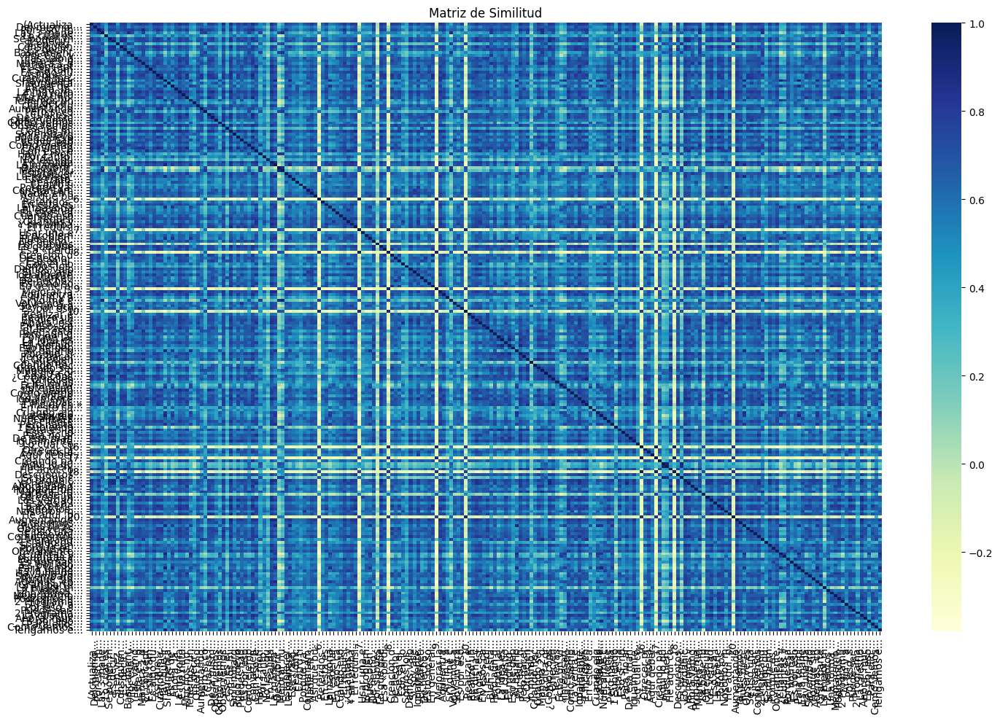


Resumen Extractivo:
Obviamente, no querremos que compren productos que no necesitan como en el ejemplo que he puesto de mi hermano, pero eso da una idea del enorme poder de la relación. Además, comunicarse frecuentemente también sirve para crear y detectar más oportunidades. Mejorar las habilidades comerciales del equipo
Como estamos viendo, la estrategia general para conseguir más clientes nuevos suele basarse en:
Hacer más de una cosa que consigue dichos clientes nuevos (más campañas, llamadas, etc).Hacer mejor dichas acciones anteriores.


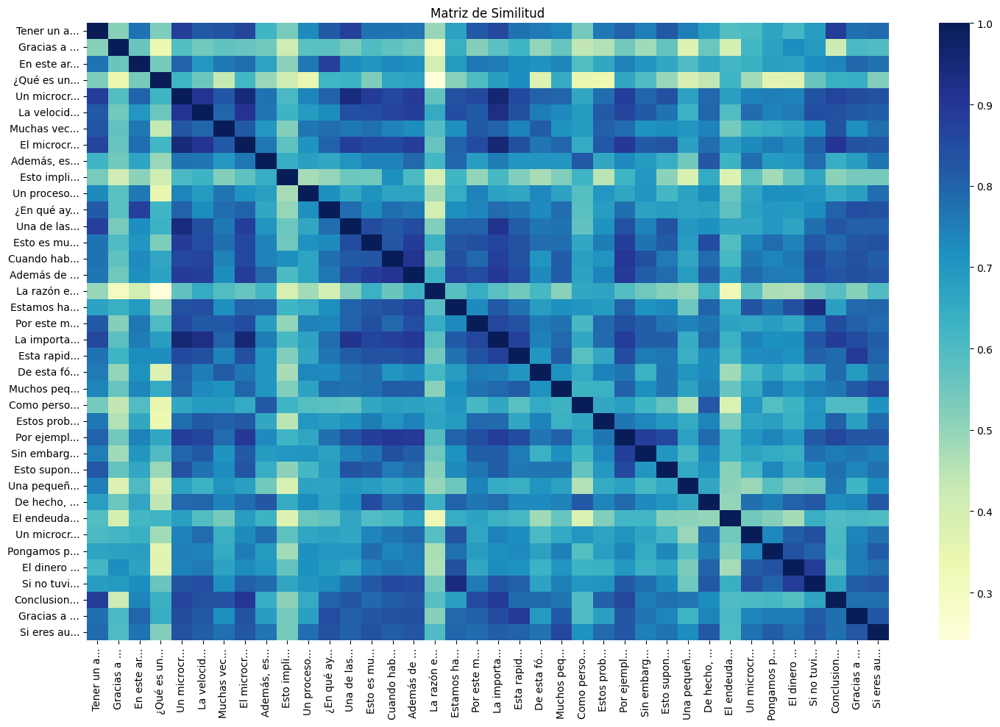


Resumen Extractivo:
Un microcrédito es como un préstamo personal pero que cuenta con dos características bien claras, se obtiene de forma rápida y permite tener acceso a una pequeña cantidad de dinero. La importancia de la inmediatez en los microcréditos
La propia naturaleza de los microcréditos permite acceder al dinero de una forma más rápida. El microcrédito, debido a la forma en la que se encuentran concedidos este tipo de préstamos, permite a la empresa acceder al dinero de forma rápida debido a la poca burocracia que existe durante el procedimiento.


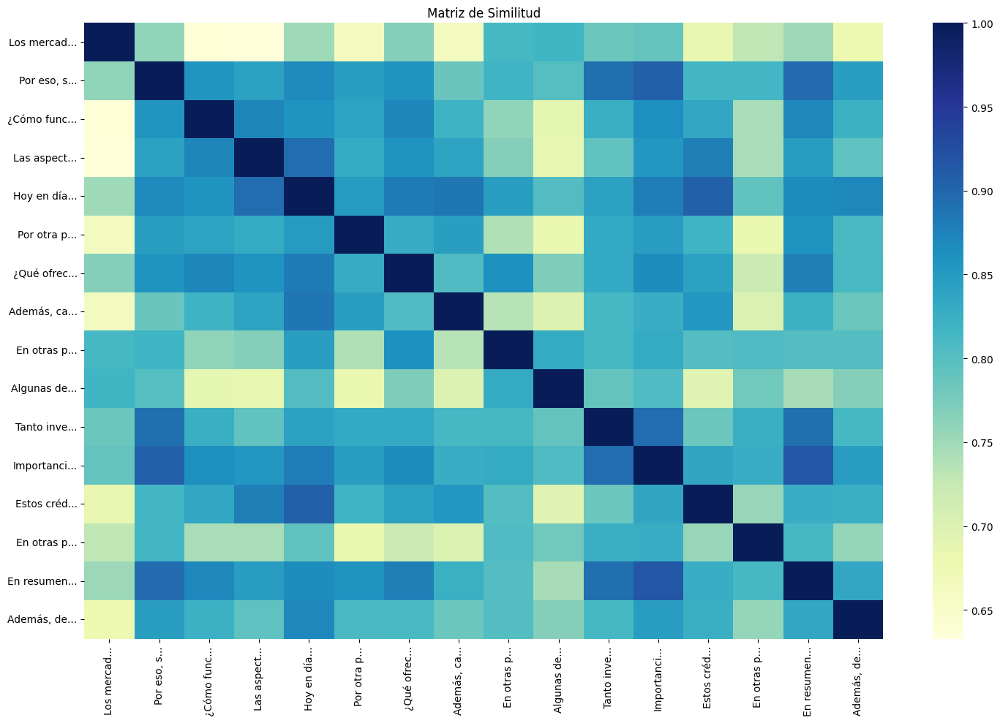


Resumen Extractivo:
Hoy en día,el precio que asume cada PYME por recibir un crédito ya no es tan altocomo en tiempos anteriores, como máximo, la tasa de interés podría alcanzar sólo un 46.
Para las empresas, antes que para nadie más, estás formas de negociación son una manera eficiente y sin intermediarios de lograr un financiamiento simple para cubrir sus necesidades, además de tener el acercamiento necesario con el inversor. Importancia del financiamiento participativo en Latinoamérica
Las empresas y emprendedores buscan tener contacto con los expertos en el mercado y en los negocios de diferentes ramas, para ellos, existen diversas posibilidades de recibir un préstamo de más de un inversionista, lo que significa mucho para cualquier organización. En resumen, las plataformas digitales están acercando los lazos y las posibles negociaciones entre las dos partes más resaltantes de una inversión: tal como lo son los inversionistas y los negocios en crecimiento.


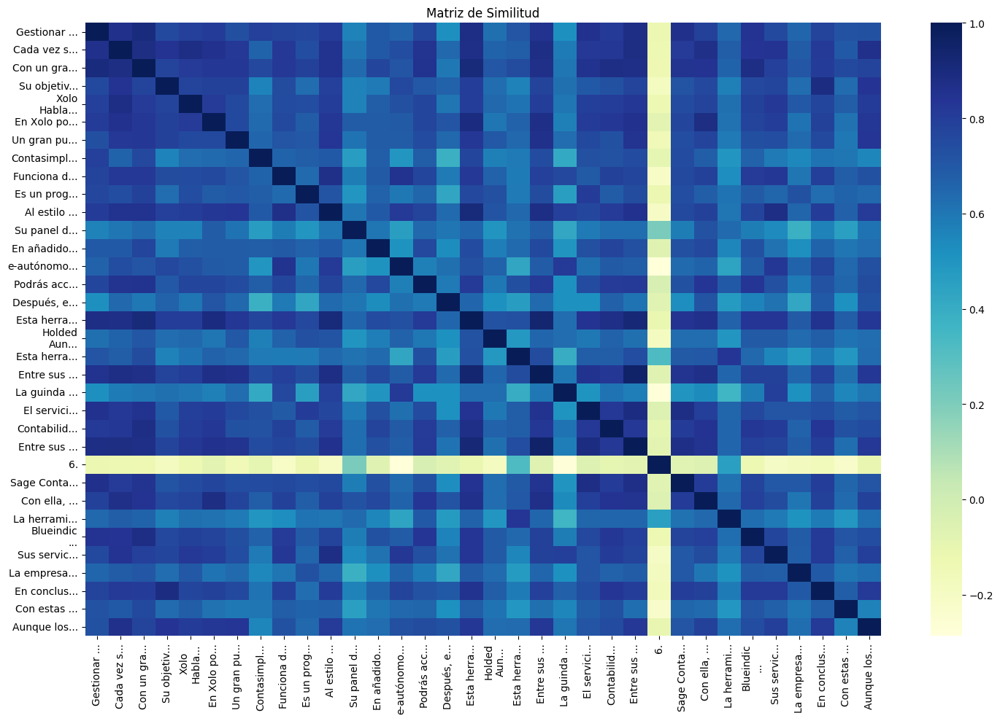


Resumen Extractivo:
Al estilo de otros servicios similares, Contasimple ofrece la fotografía de tickets para conservarlas en formato digital y evitar papeleos innecesarios, así como la creación de facturas personalizadas con presupuestos y albaranes. Esta herramienta digital pensada para autónomos también incluye funciones como el envío de presupuestos a tus clientes que posteriormente se convierten en facturas, creación de facturas periódicas, actualización de libros contables, almacenamiento ilimitado y previsión de impuestos en tiempo real usando gráficos. Con un gran número de aplicaciones y servicios en línea ahí fuera, hemos querido compartir contigo en este artículo las mejores herramientas digitales para gestionar tu contabilidad como autónomo.


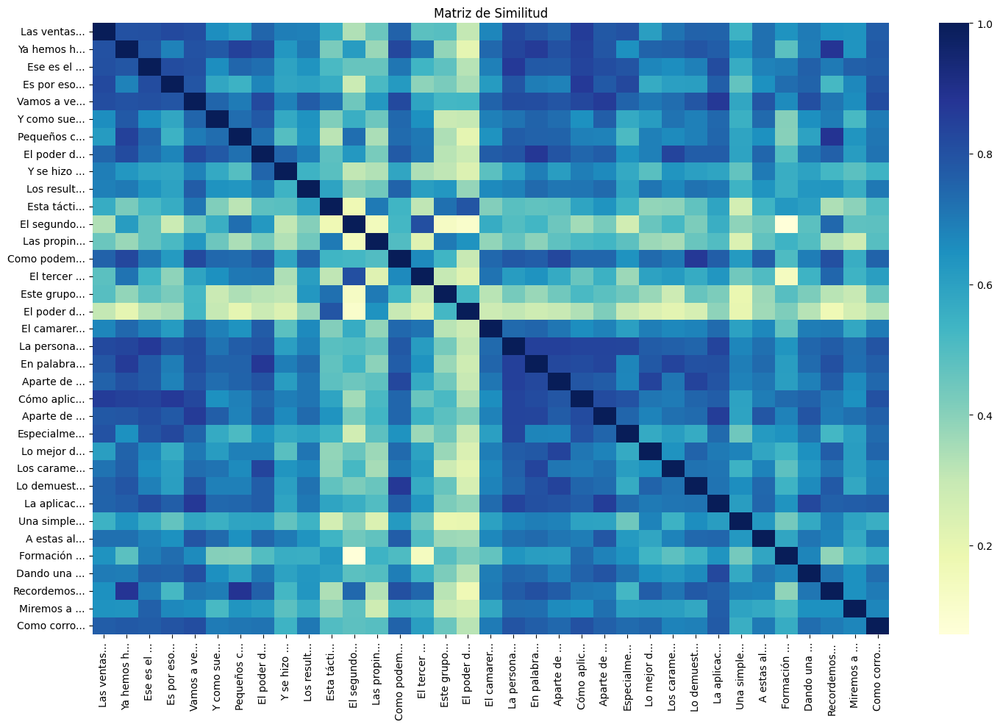


Resumen Extractivo:
Vamos a ver todo esto aplicado a un caso de estudio real en el que, utilizando ese momento crítico tras la compra, se consiguieron aumentar las propinas a los camareros de un local hasta en un 2
Como veremos, es muy interesante, porque se intentaron tres formas distintas de hacerlo y los resultados fueron bastante dispares. La personalización, el trato diferenciado y hacer sentir especial al otro es muy poderoso, especialmente tras la compra, que es cuando todos los vendedores se olvidan de sus compradores porque ya tienen el dinero en el bolsillo. Aparte de eso, personalizar la experiencia y tratar al cliente de manera que no sea un número es lo que marcará la diferencia con los competidores.


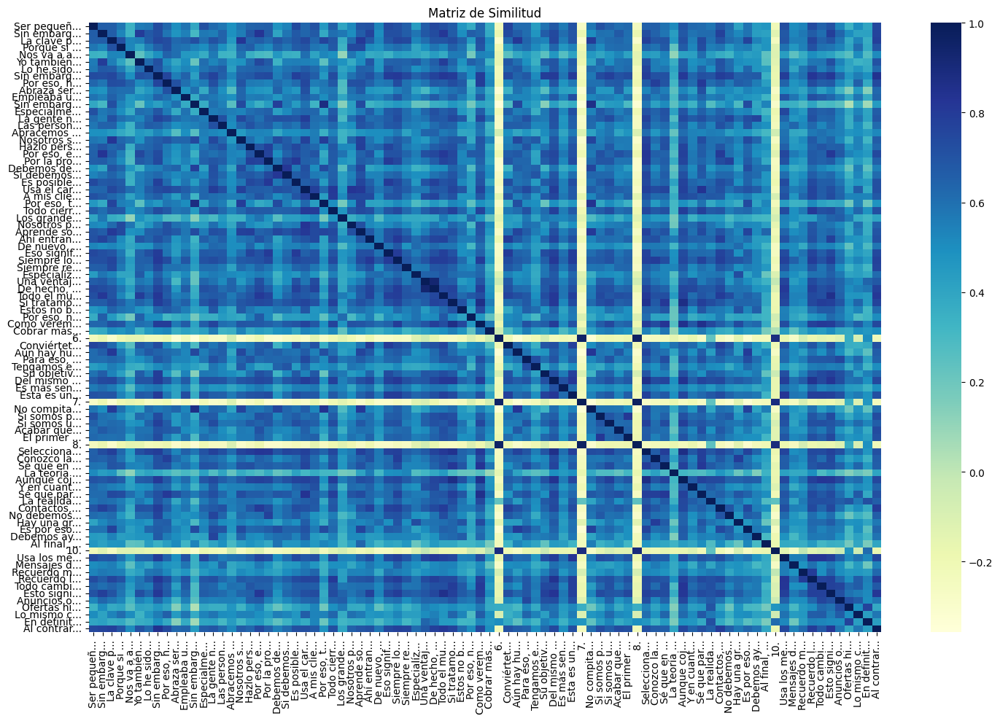


Resumen Extractivo:
Selecciona bien los clientes
Porque como no tendremos mucho esfuerzo ni tiempo (especialmente en el caso de profesionales dedicados a servicios), el que tenemos hemos de reservarlo para clientes de calidad. Del mismo modo, podemos volcar nuestra experiencia en libros e informes que proporcionaremos a posibles clientes, demostrando que sabemos de lo que hablamos y nuestras soluciones son superiores. Aunque cojamos a clientes que no sean los más adecuados en un momento dado, tenemos que estar siempre atentos a buscar activamente mejores opciones.


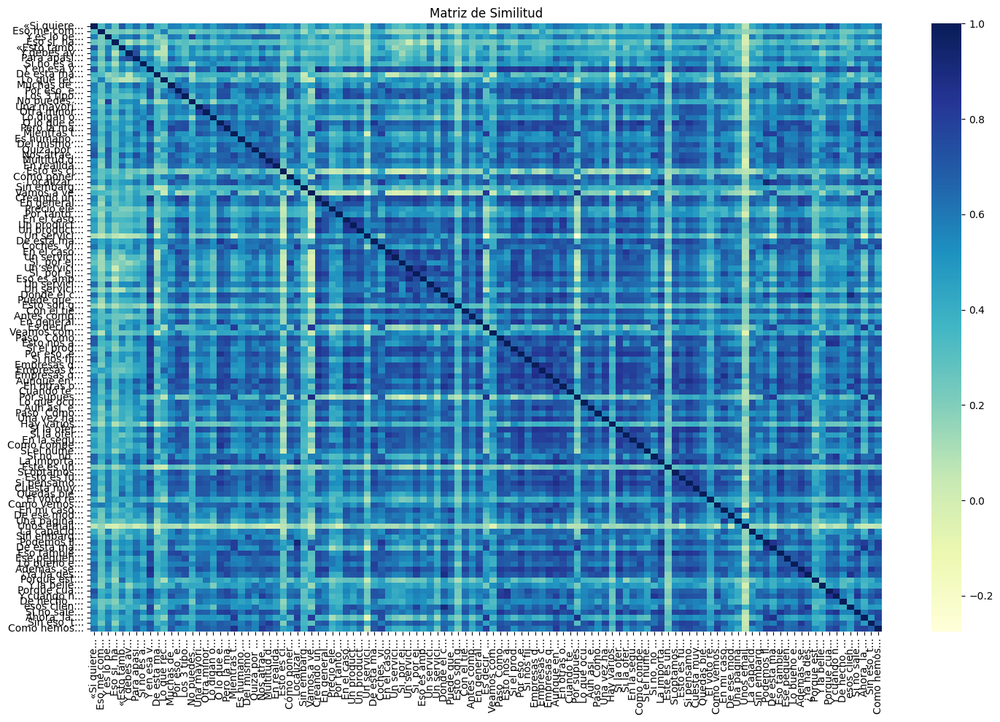


Resumen Extractivo:
La importancia de los pedidos previos
Algunos tratan de aplicar esta estrategia preguntando a los clientes si estarían interesados en esa oferta premium que han pensado y si tienen intención de comprarla en caso de que la lances. Y en esa verdad se encuentra la estrategia más efectiva para cualquier negocio:
Encontrar a esos clientes que quieren más de ti y ofrecerles un producto o servicio premium que estén deseando. Además, serán clientes que conectan con nosotros y comprenden el valor de lo que hacemos, con lo que resultará satisfactorio trabajar con ellos.


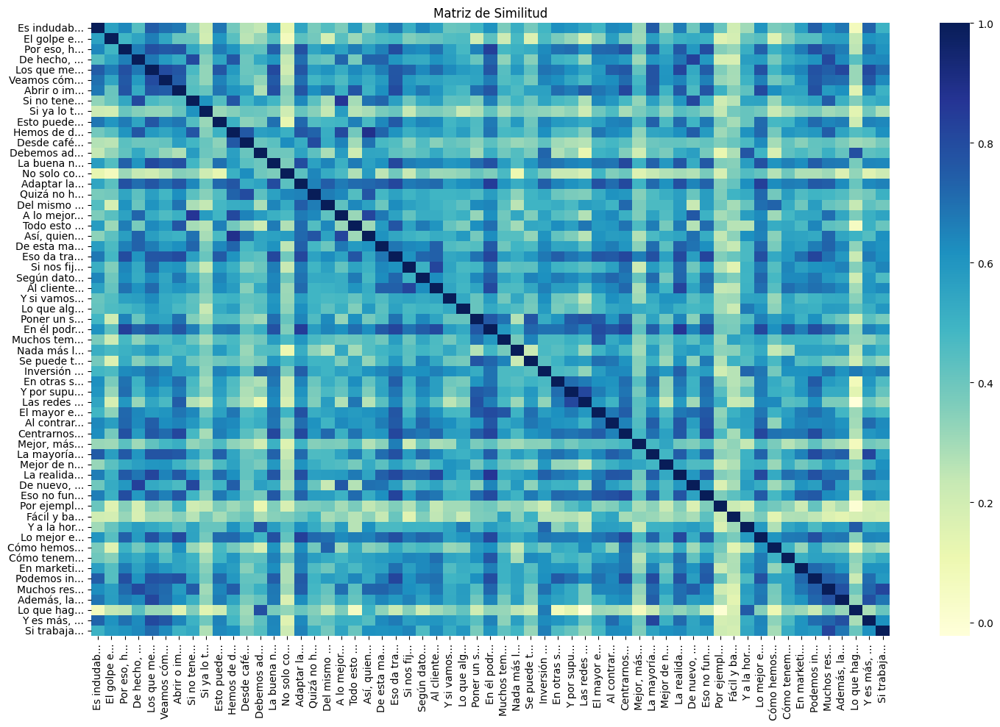


Resumen Extractivo:
Adaptar la oferta y tratar de aumentar el valor por venta
No solo se trata de invertir en que nuestra oferta se pueda llevar, lo ideal es adaptarla a cosas que encajan mejor con esa manera nueva de consumir. En él podremos publicitar esa seguridad del punto anterior y permitir un sistema de pedidos online para fomentar los dos primeros consejos, como la posibilidad de llevarse lo que vendemos y la oferta ampliada que pueden consultar online. Lo mejor es el marketing de educación, es decir, explicar qué estamos haciendo…
Para ser su opción de comida y bebida segura, con las medidas que hemos puesto.


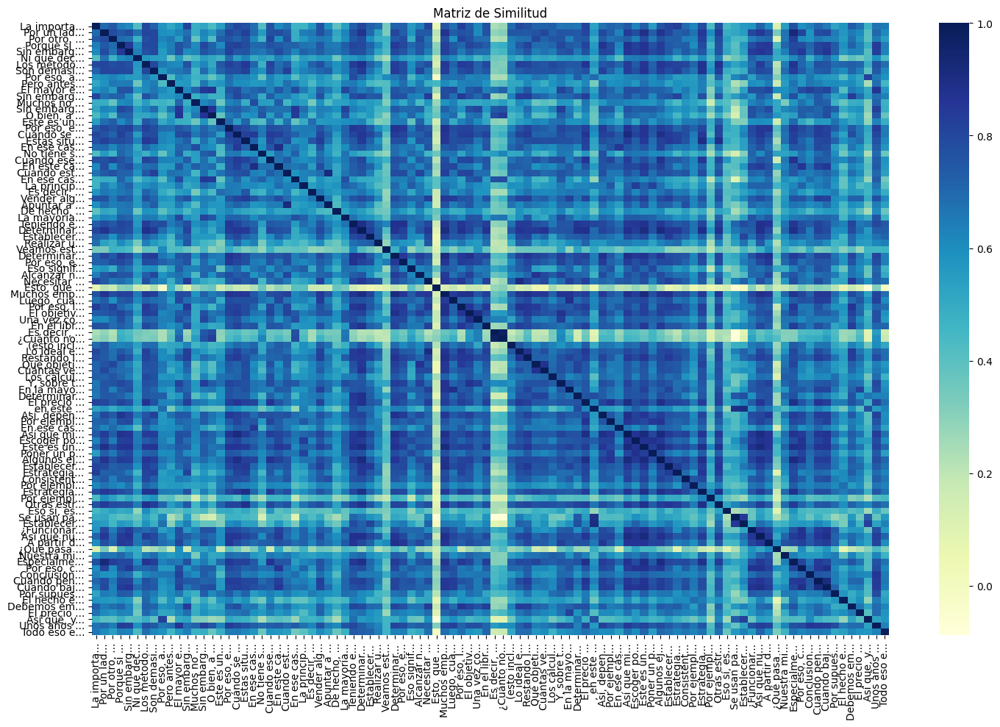


Resumen Extractivo:
Este es un tema muy desconocido por la mayoría de emprendedores y responsables de marketing, pero podemos elegir desde estrategias de precios psicológicos, hasta precios de penetración temporales, descuentos, bundling, etc.
Esto, seguramente, nos obligará a retocar de nuevo nuestro modelo económico inicial, analizando qué sucede en la hoja de cálculo cuando cambiamos precios y viendo qué resultados podemos obtener con ellos. Muchos emprendedores, simplemente, ponen precios a ciegas sin saber realmente qué margen de beneficio obtienen, en qué costes incurren, cuántas ventas deben alcanzar para conseguir el llamado «punto de equilibrio» (el momento en el que los ingresos cubren todos los costes) o cuántas ventas necesitan para alcanzar los beneficios que se han propuesto como objetivo en su actividad. Así que miramos a la competencia y sus precios, determinamos cómo queremos ser posicionados en la mente del cliente y ajustamos el precio para ser coherentes.


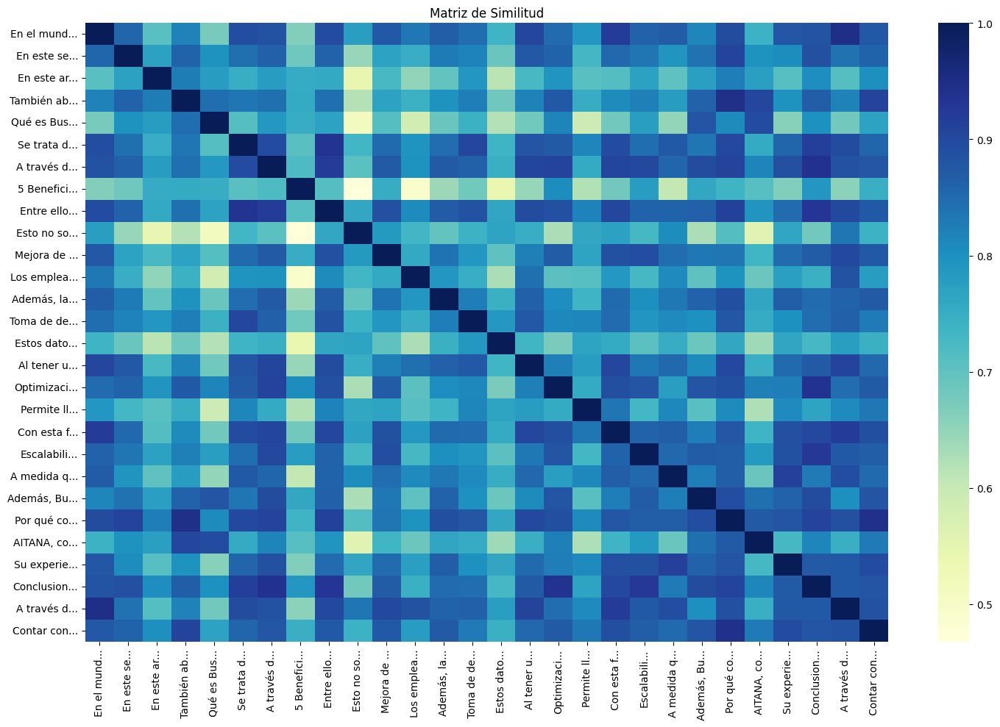


Resumen Extractivo:
Por qué contar con un partner para la implementación de Business Central
La implementación exitosa de Business Central requiere conocimientos técnicos especializados y experiencia en la configuración y adaptación del sistema a las necesidades específicas de cada empresa.
Es por eso que contar con un partner de confianza y experimentado, como AITANA, empresa de referencia partner de Microsoft, resulta fundamental. Entre ellos, destacan:
Automatización de procesos
Business Central permite automatizar tareas rutinarias y repetitivas, como la generación de informes financieros, la gestión de inventario y la facturación. Conclusiones
En resumen, Business Central proporciona a las pymes una solución integral y flexible para la gestión de sus operaciones.


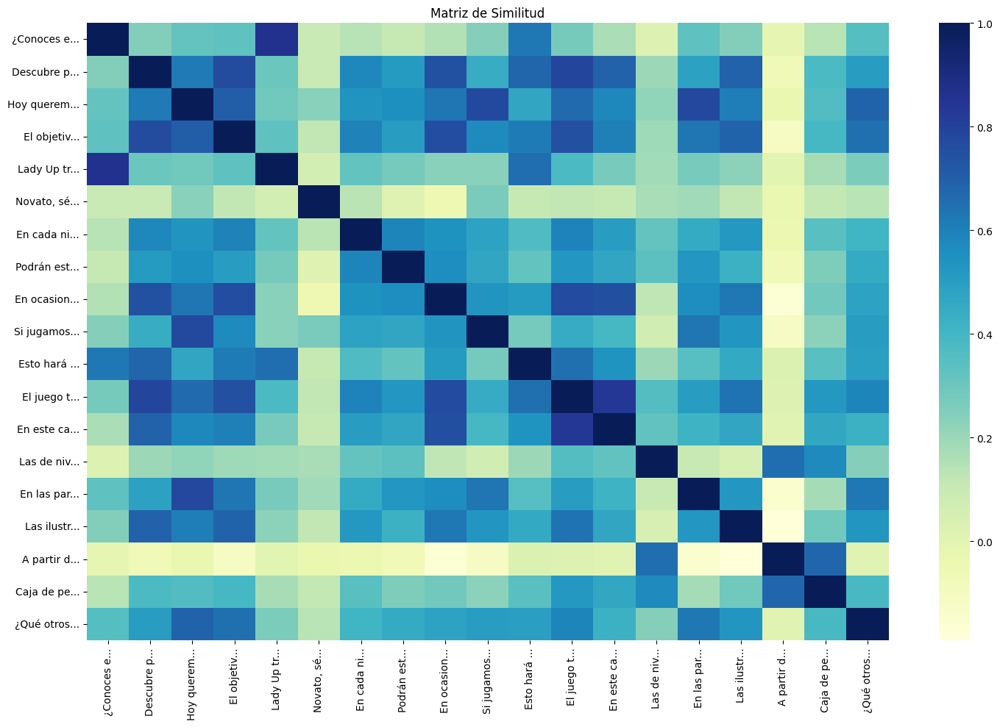


Resumen Extractivo:
Caja de pequeño formato  Distintos niveles de dificultad
En el juego hay 80 cartas de coreografía y 25 cartas de insectos (5 para cada jugador). El juego también presenta una variante adicional llamada Grandes Bichos, en la que mezclaremos cartas de los distintos niveles de dificultad. Hoy queremos hablar sobre TCG factory un juego que nos ha gustado mucho en casa y nos ha permitido jugar partidas muy reñidas entre niños y adultos.


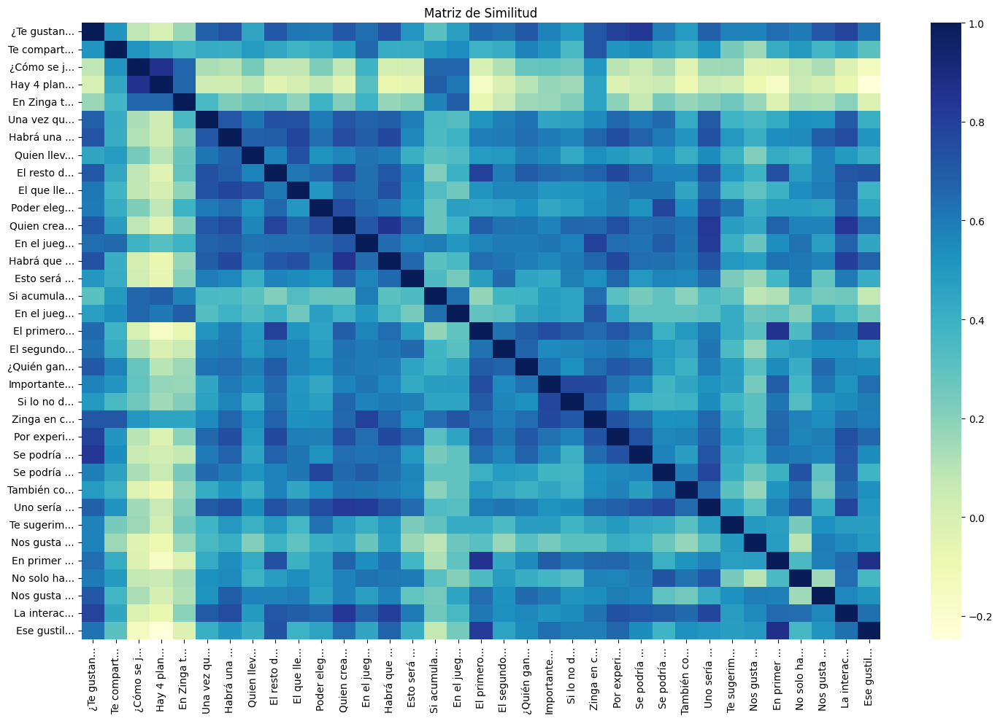


Resumen Extractivo:
Zinga en clase
Nos parece un juego que es ideal en esa etapa en la que están comenzando a hacer sus primeros cálculos, hay que tener en cuenta que los resultados van a estar siempre entre el 1 y el 12, por lo que son sencillos, no obstante al introducir el factor velocidad la cosa se complica.
Es importante a la hora de introducirlo usarlo con peques que tengan niveles parecidos ya que si no vamos a causar aburrimiento en unos y frustración en otros por lo que desaparecerá el interés en jugarse
El juego está previsto de 2 a 4 jugadores, ya que hay 4 tableros diferentes, aunque en el propio juego se propone que podrían jugar hasta 6, habiendo dos tableros repetidos. En el juego también podrás usar EXTRAS, esto es volver a decir un número que ya has tachado previamente, y es que cuando acumulas 3 extras puedes tachar un número de tu hoja a tu elección en el momento. Quien crea haber encontrado este resultado que le permite tachar un número tocará el timbre y dirá el 

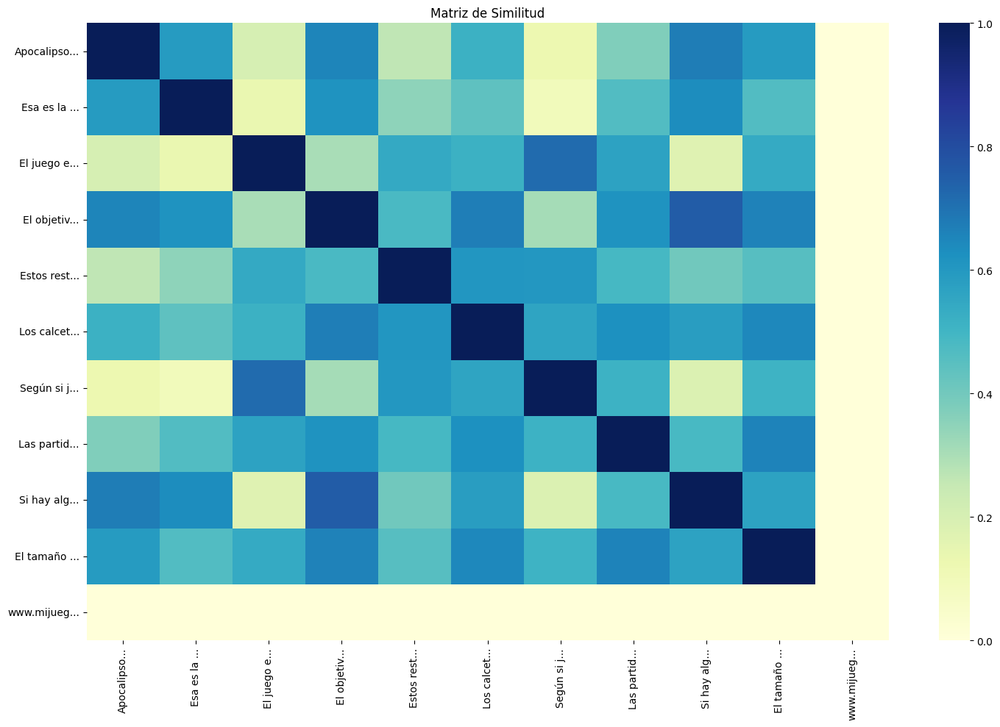


Resumen Extractivo:
Los calcetines tienen poderes especiales, 5 para ser exactos y el objetivo de ellos es fastidiar un poquito al resto de jugadores, vienen en castellano y en inglés, lo que le da un plus. El tamaño del juego es súper manejable, te cabe en un bolso de sobra
Por poco más de 10 € tienes un juego divertido para jugar en familia y con amigos y que os va a hacer pasar muy buenos ratos. El objetivo es ser el que más pares de calcetines idénticos acumula, pero claro, con el frenesí de las búsqueda a veces nos pasamos de rápido y nos encontramos con que hemos emparejado dos calcetines que se parecen pero que no son idénticos.


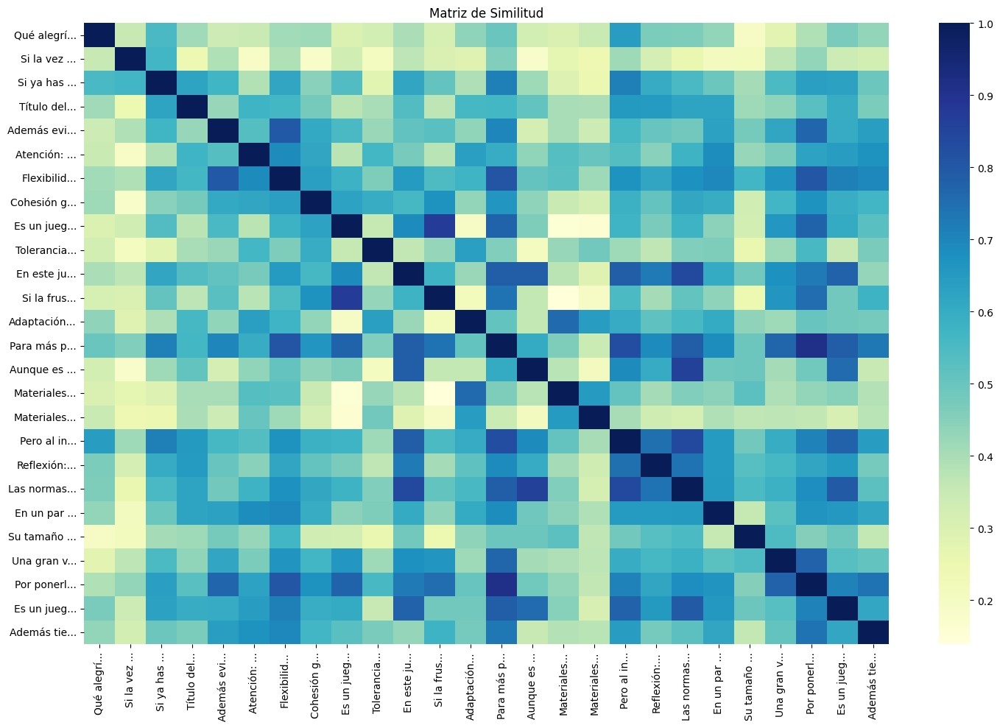


Resumen Extractivo:
Para más pequeños quizás propondría empezar a jugar son las cartas especiales y luego, cuando tengan la dinámica del juego, ir introduciéndolas una a una hasta que se acostumbren a ellas. Por ponerle una pega es que, como cualquier juego de cartas, las cartas sufren mucho y se puede deteriorar con relativa facilidad, al ser un juego en el que la velocidad es importante no creo que fuese bueno ponerle fundas a las cartas para aumentar su tiempo de vida. Pero al introducir el juego se utilizó una sesión de taller de juegos con la colaboración de las familias, con el fin de que los niños aprendieran a jugar y practicaran con un adulto que ya sabía jugar al juego.


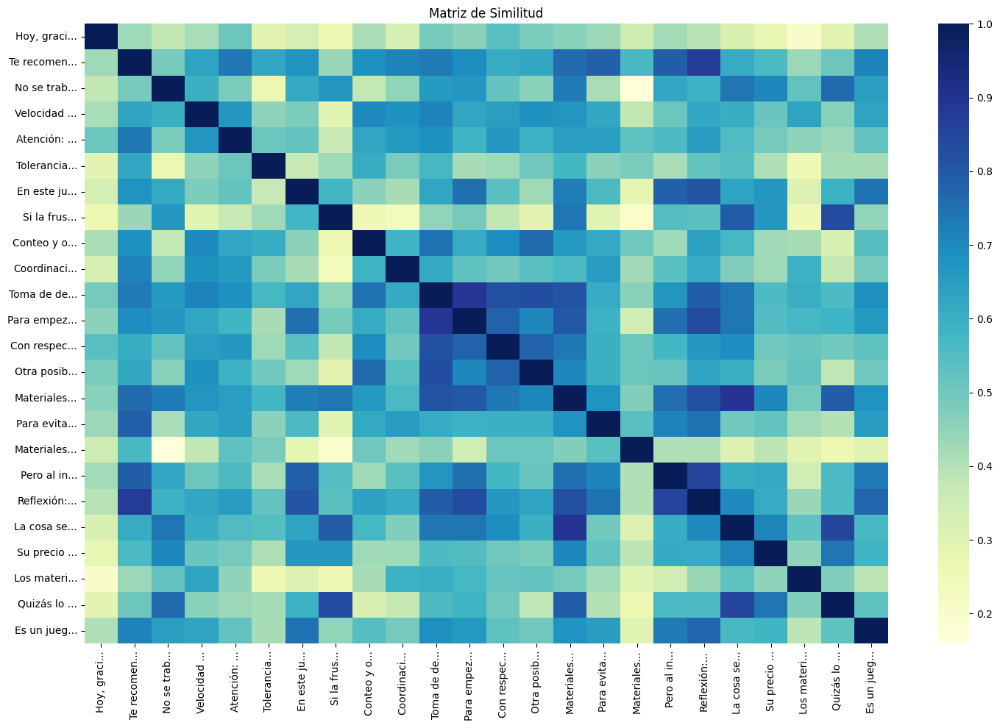


Resumen Extractivo:
Materiales adicionales creados:
Recordar en qué consisten cada una de las cartas del juego (las de reto, las maldiciones y los eventos) puede ser complicado para los niños y tienen que estar mirando continuamente las instrucciones y estas pueden destrozarse en unas cuantas partidas. Toma de decisiones bajo presión

Adaptación o adaptaciones realizadas:
EL juego trae además de las cartas reto, unas cartas de maldiciones para el jugador que consigue la gema morada y cartas de eventos que tendrán que seguir todos los jugadores. Reflexión:
Visualmente es un juego muy atractivo, su estética atrae mucho a los alumnos, además es un juego divertido y al introducir las cartas de maldiciones (las de eventos aun no las usamos) hace que sea aun más divertido.
Las normas y dinámica de juego son muy sencillas por lo que no es un juego difícil de aprender ni de jugar.


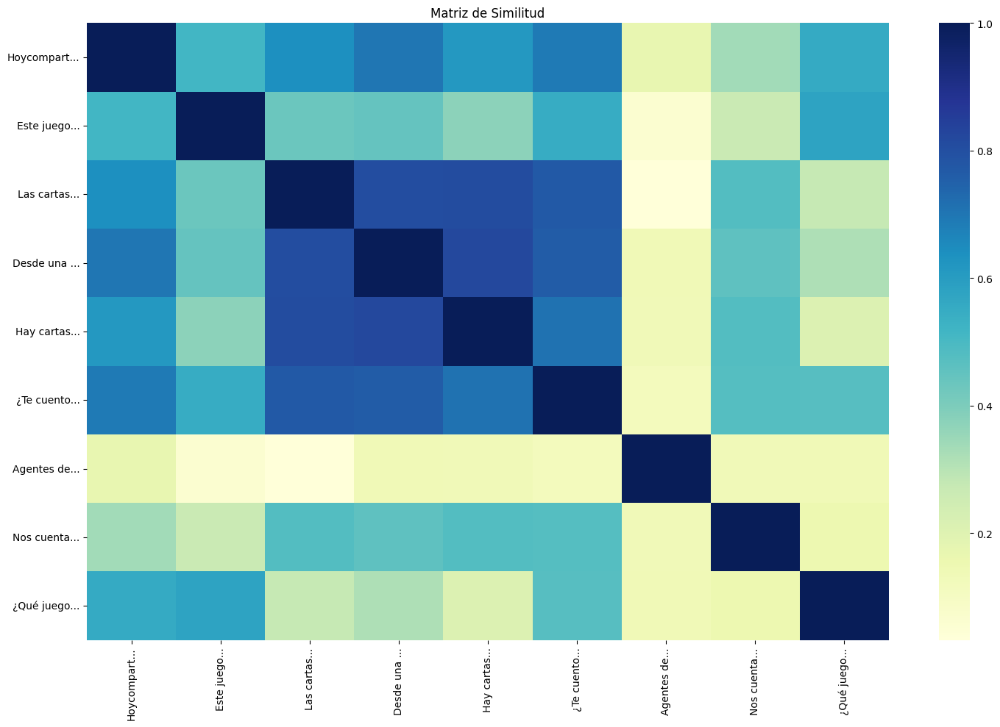


Resumen Extractivo:
¿Te cuento una curiosidad? Tenemos especial cariño a este juego y es que tuvimos la gran suerte de conocer su lanzamiento en persona en el pasado festival de juegos de mesa en una ciudad tan especial para nosotros como Córdoba. Desde una línea cronológica asociada a distintas edades y épocas, fuentes de energía diferentes, número en distintos idiomas, etc... Objetivo del juego: los jugadores llevaremos a cabo batallas que nos permitan conseguir las mejores cartas que nos den la mayor cantidad de puntos. Hoycompartimos contigo el juegoAgentes del tiempo, un título de@classgameseditorialy@falomirjuegoscon el que hemos pasado momentos muy divertidos de juego y aprendizaje.


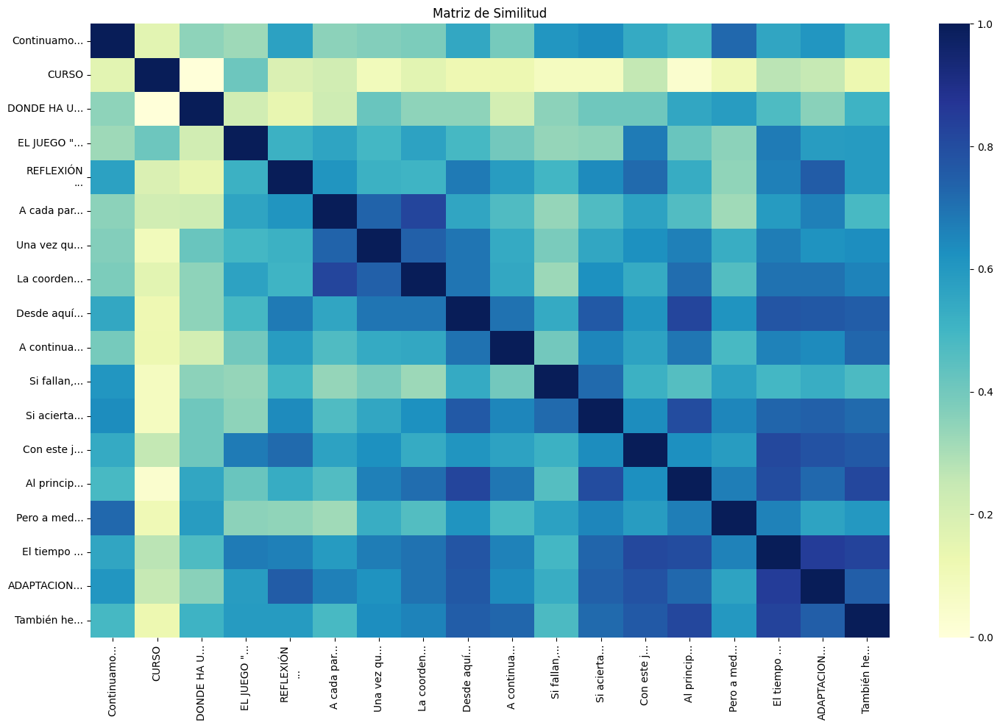


Resumen Extractivo:
El tiempo de debate que se emplea al final para “descubrir” al portero sirve para trabajar la comunicación lingüística, lo que convierte el juego en una herramienta fantástica para aquellas personas a las que les cueste relacionarse con los demás. ADAPTACIONES en el juego El Portero Baldomero para el aula
lo que hemos hecho ha sido proyectar en la pizarra digital la tarjeta con las palabras clave para que todos los participantes pudiesen verla a la vez y se dejase menos en evidencia a Baldomero. También hemos utilizado el juego para hablar de las emociones y hacer ver a los demás qué se siente cuando te acusan erróneamente de algo.


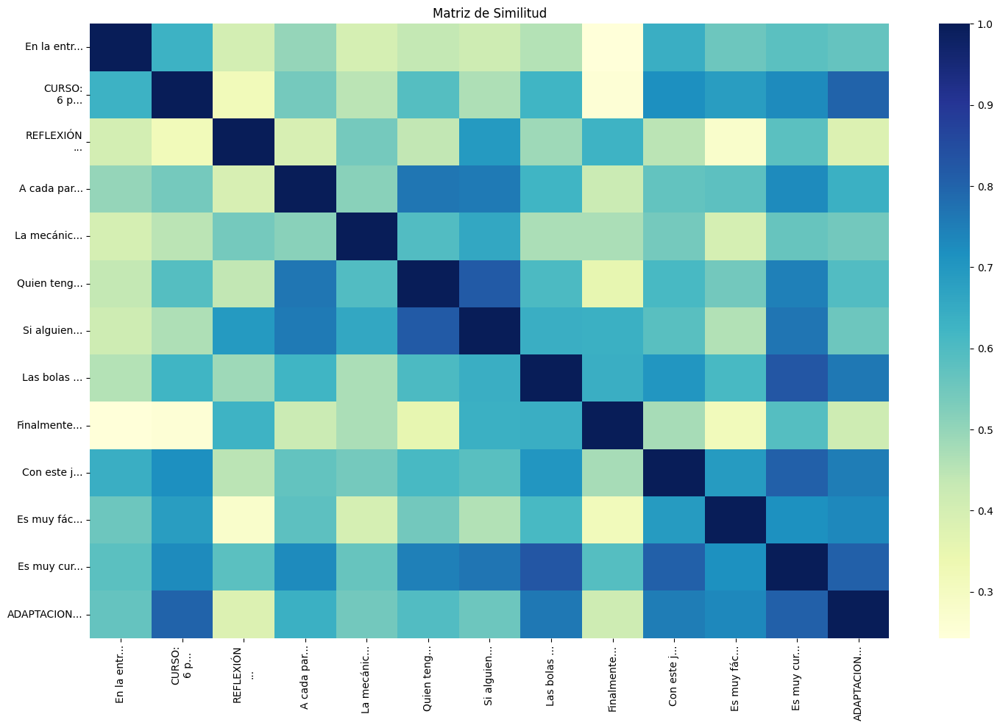


Resumen Extractivo:
Es muy curioso ver cómo están pendientes de sus movimientos y de los movimientos de los demás, puesto que, cuando alguien se equivoca, siempre se dan cuenta en un reducidísimo espacio de tiempo.
Como el alumnado tiene una edad elevada, no ha hecho falta modificar el juego, pero las primeras partidas las jugaron sin la bonificación de la bola que hay que repartir cuando alguien se equivoca, para que se familiarizasen con el proceso. Con este juego se trabajan todas las habilidades anteriormente explicadas con mucho éxito. Si alguien se equivoca de gesto, no se da cuenta de que han hecho el suyo o pierde el ritmo, recibirá una carta de bola como castigo, enviará su gesto a otra persona (que ya tendrá dos, lo que complica más el juego) y cogerá un nuevo gesto.


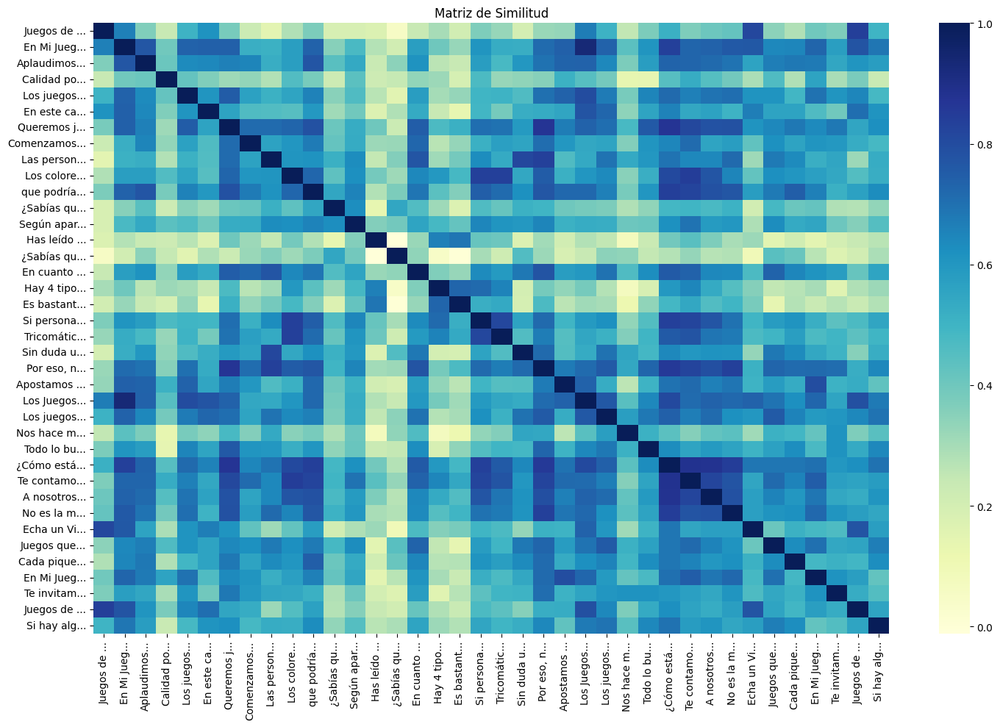


Resumen Extractivo:
¿Cómo están trabajando los autores y editoriales para hacer sus juegos de mesa aptos para daltónicos?
Hay diferentes maneras de hacer que un juego puede ser disfrutado por todos, sin importar como vemos los colores o qué tipos de colores tenemos más dificultad en apreciar. Te contamos 3 maneras distintas que nos encontramos

Utilizar colores que tengan mucho contraste entre ellos de manera que se puedan distinguir de una manera más clara.
Utilizar símbolos o imágenes en lugar de colores, a al menos acompañarlos y presentarlos de manera simultánea de manera que se puedan distinguir entre diferentes elementos del juego. Por eso, nos hemos propuesto encontrar juegos que cualquier persona pueda disfrutar plenamente, independientemente de cómo vea el arcoíris.


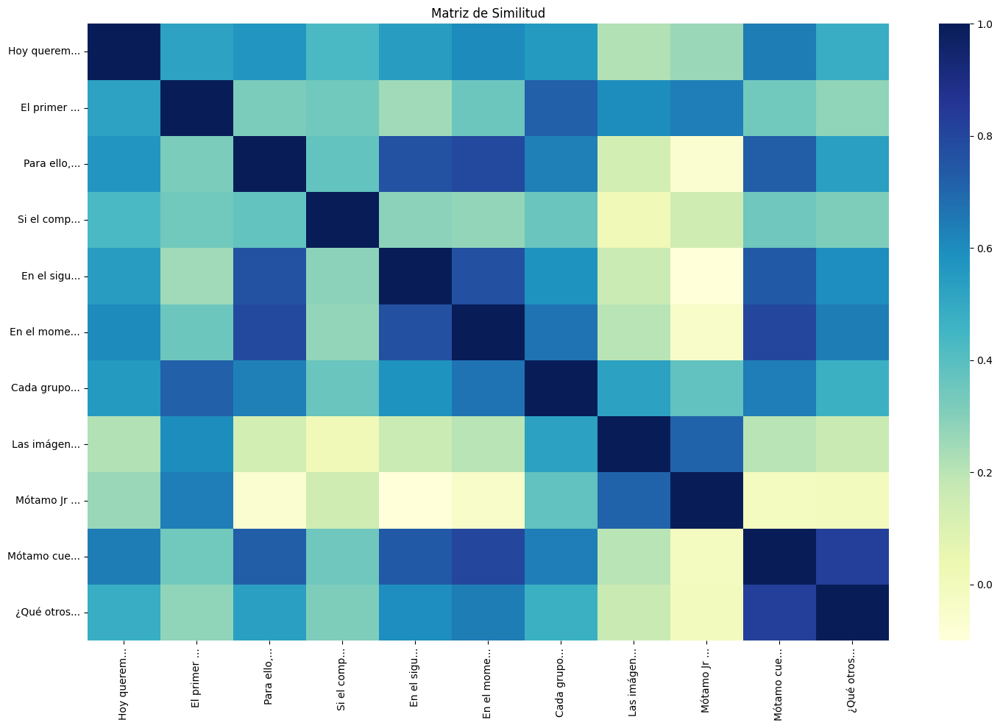


Resumen Extractivo:
Cada grupo volverá siempre a comenzar por la primera imagen y es que hasta que no se adivinen las 4 imágenes de manera consecutiva no se dará la carta por ganada. Mótamo cuenta además con una versión para los más mayores, en la que en lugar de tener que adivinar 4 imágenes, tendremos que adivinar 6.Nos ha gustado mucho por  se amplia y se afianza el vocabulario  ideal para clases de lengua, inglés o cualquier otro idioma  caja de pequeño tamaño ideal para transportar  en el aula se puede adaptar y crear breves historias orales/escritas que relacionen los objetos de cada carta  se trabaja la memoria y la flexibilidad cognitiva a la hora de tratar de identificar una imagen a través de palabras relacionadas.  al jugarse en grupo se mejoran las conexiones entre personas y la creación de nuevos vínculos  un juego muy fácil de explicar y de ponerse a jugar  el ambiente que se genera tanto en casa como en el aula es muy divertido y bonito. El primer grupo en ganar 5 carta

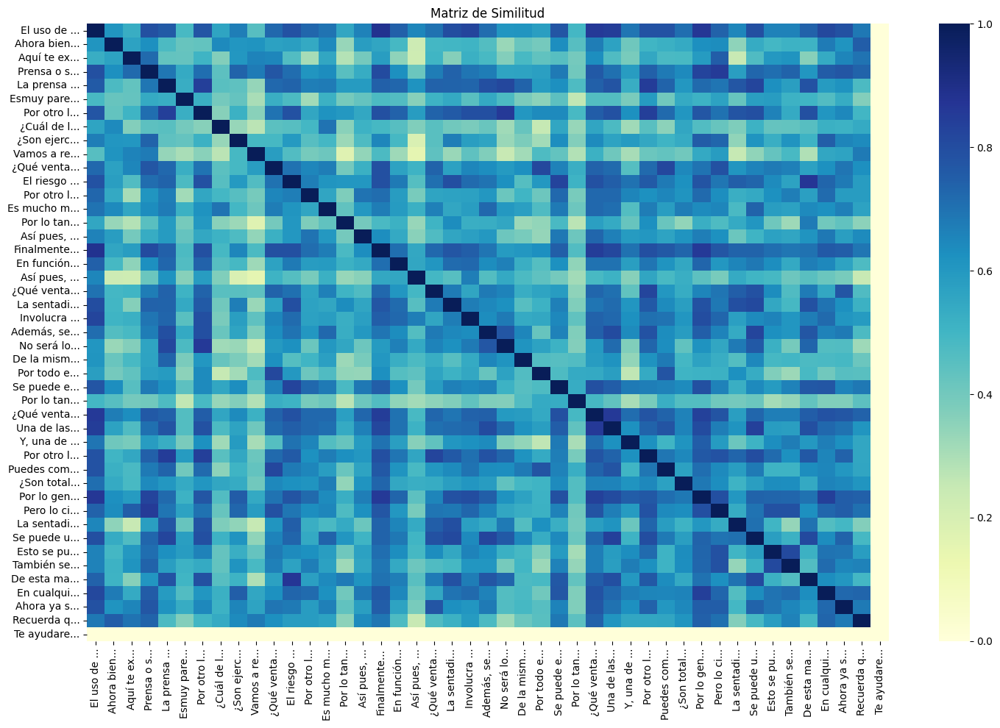


Resumen Extractivo:
El uso de ejercicios deprensa o sentadillaes muy habitual en cualquier rutina de fuerza o de entrenamiento funcional en la que se pretende trabajar correctamente el tren inferior. ¿Qué ventajas ofrece?Pues, para empezar, que supone un trabajo importante del corey de muchos músculos estabilizadores. Por lo general, existe la postura de un entrenamiento correcto, es aquel que se centra en todas las partes del cuerpo y que no sobrecarga con ejercicios reiterativos.


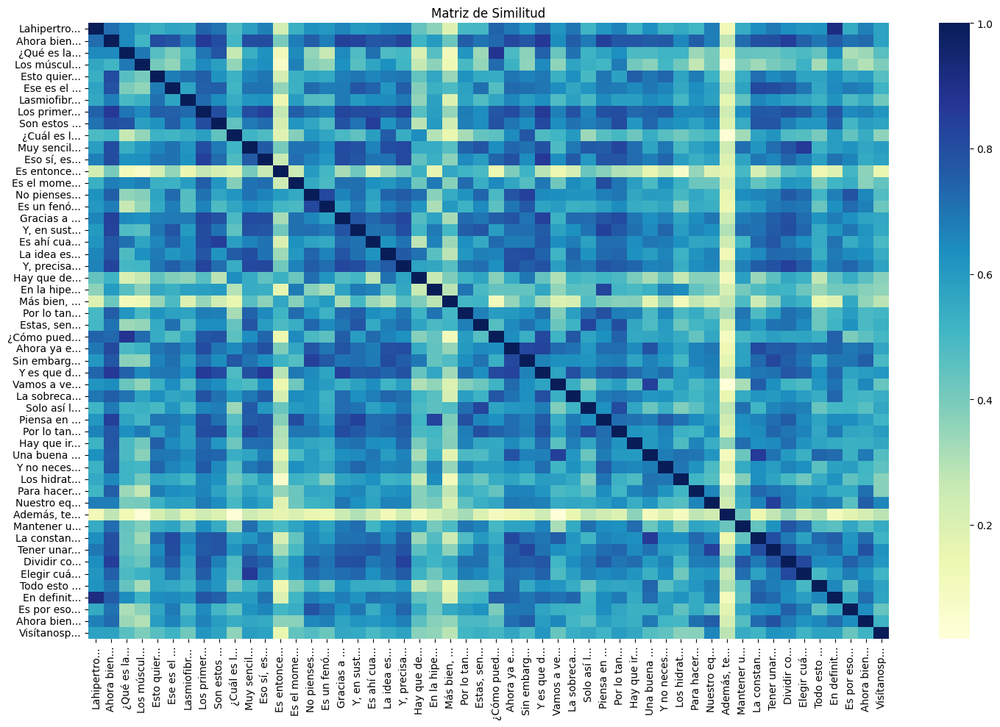


Resumen Extractivo:
Ahora bien, es importante que sepas en qué consiste la ganancia muscular para que puedas adaptarte correctamente a tu entrenamiento. Los primeros tienen una función elástica, mientras que los segundos son las proteínas que actúan en aquellos momentos de esfuerzo muscular. Y, precisamente por eso, ha creado músculos que en el futuro podrán hacer frente a dicha carga.


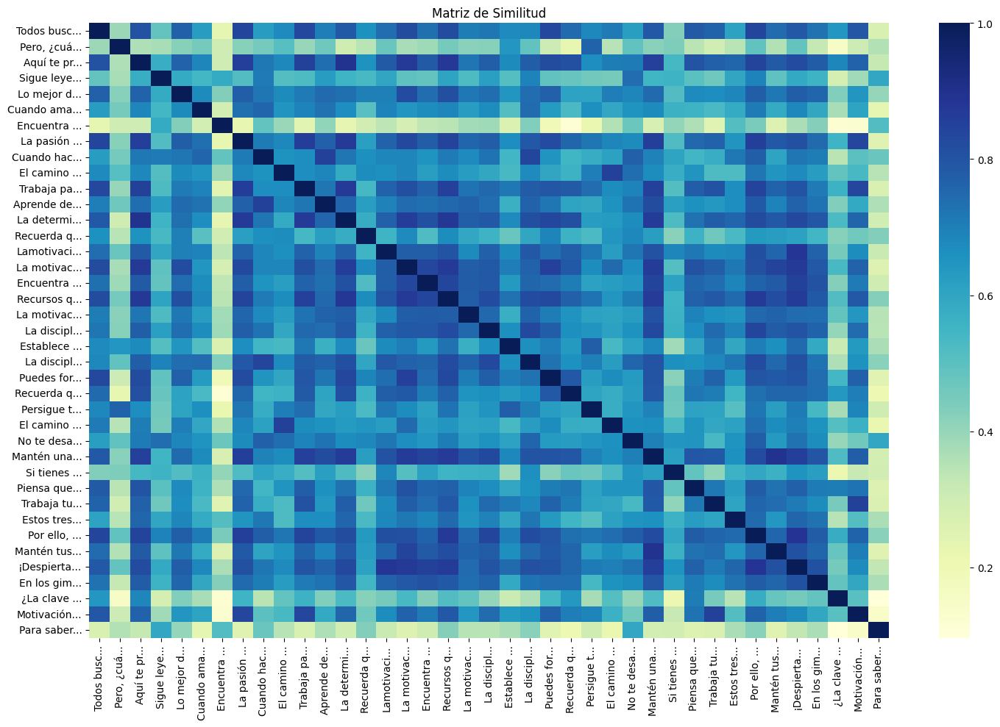


Resumen Extractivo:
Por ello, si estás buscando alcanzar el éxito en el gimnasio, recuerda que la motivación, la disciplina y la perseverancia son tusaliados más valiosos. Recursos que te ayudan a tener motivación para entrenar
También puedes buscar fuentes de motivación externas, comoestablecer metas realistasy tener imágenes o frases inspiradoras que te recuerden por qué estás comprometido con tu entrenamiento. ¡Despierta tu potencial en nuestro gimnasio!
Si estás buscando una manera efectiva demejorar tu condición física, fortalecer tu cuerpo y alcanzar tus objetivos de bienestar, ¡has llegado al lugar adecuado!


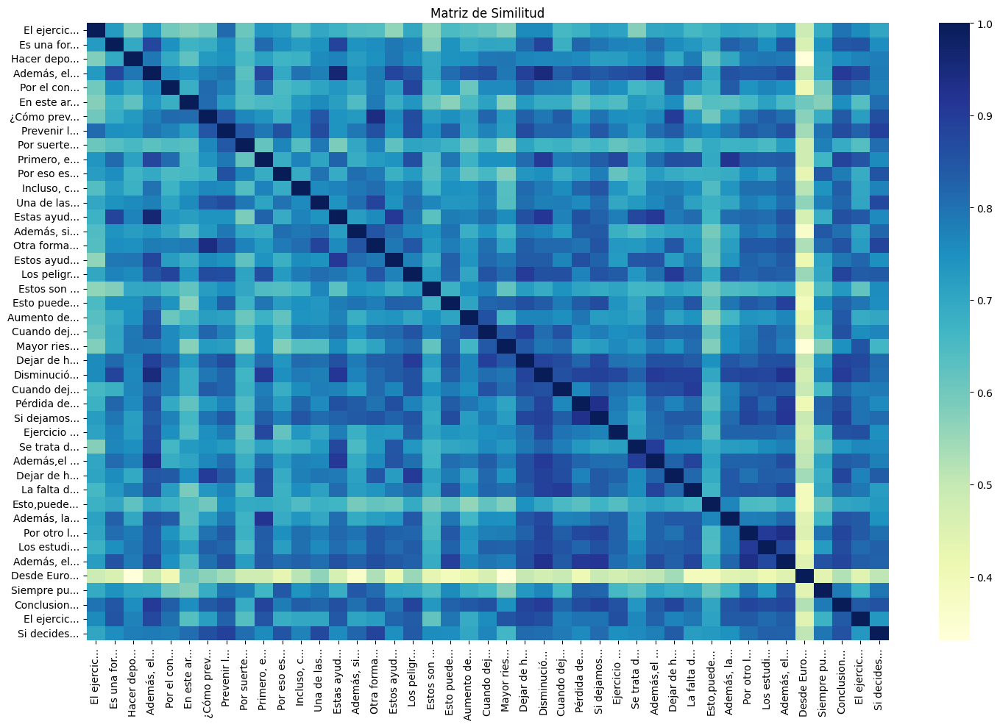


Resumen Extractivo:
Conclusiones: por qué es importante no dejar de hacer ejercicio
En conclusión, hacer ejercicio regularmente es esencial para mantener una buena salud y un peso saludable. Disminución del bienestar mental:El ejercicio es una forma importante de reducir el estrés y mejorar el bienestar mental. Dejar de hacer ejercicio aumenta el riesgo de estas enfermedades y puede disminuir la calidad de vida.


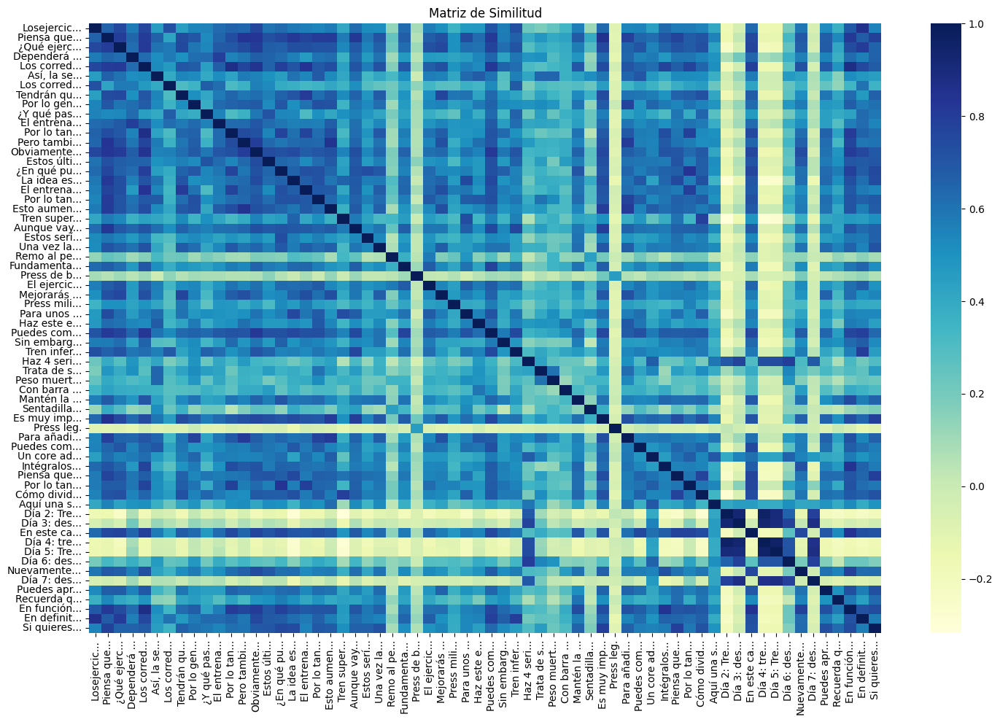


Resumen Extractivo:
¿Qué ejercicios de fuerza son los mejores para los corredores? Cómo dividir la rutina de fuerza de un corredor de fondo
Ahora que ya conoces los ejercicios, resta por ver cómo programarlos a lo largo de la semana. La idea esque tengan un cuerpo atlético, con un músculo fuerte.


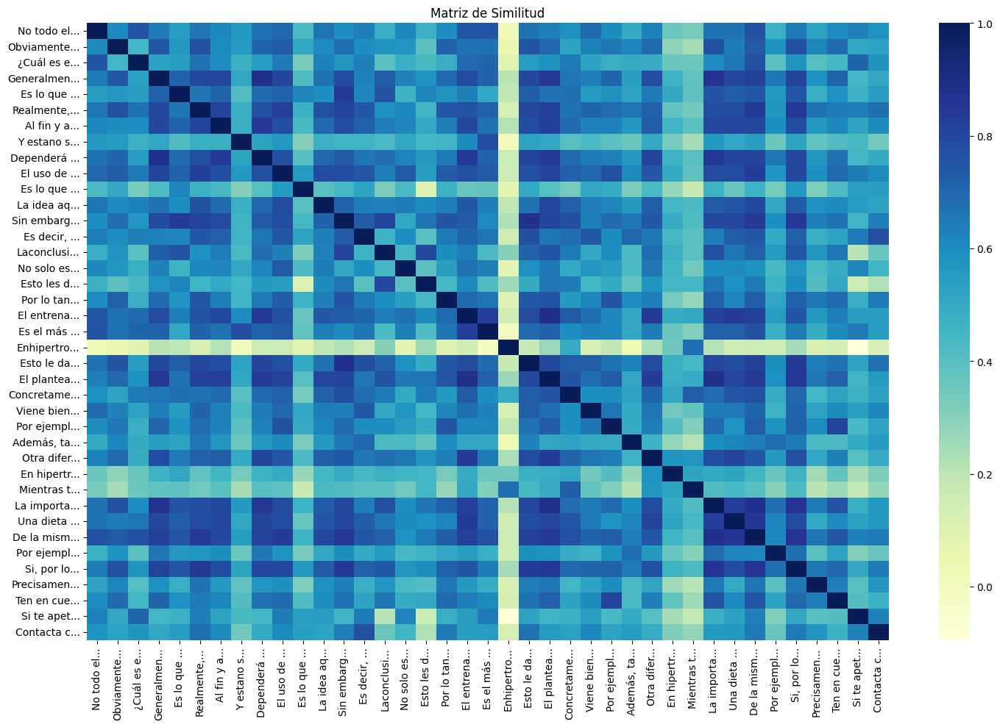


Resumen Extractivo:
De la misma manera,si llevas una dieta más contenida, es probable que ese volumen no lo ganes a la misma velocidad, y se mantenga en unos niveles que a ti te interesen.
Entrenar con pesas sin ganar volumen: conclusión
Laidea final es queexisten muchos otros factores que interfieren con tu cuerpo. Si, por lo general, el cardio forma parte de tu entrenamiento y se lleva mucho protagonismo, conseguir un volumen importante te exigirá consumir gran cantidad de calorías. El planteamiento del entrenamiento de fuerza es muy diferente:se emplean pesos superiores pero con muchas menos repeticiones.


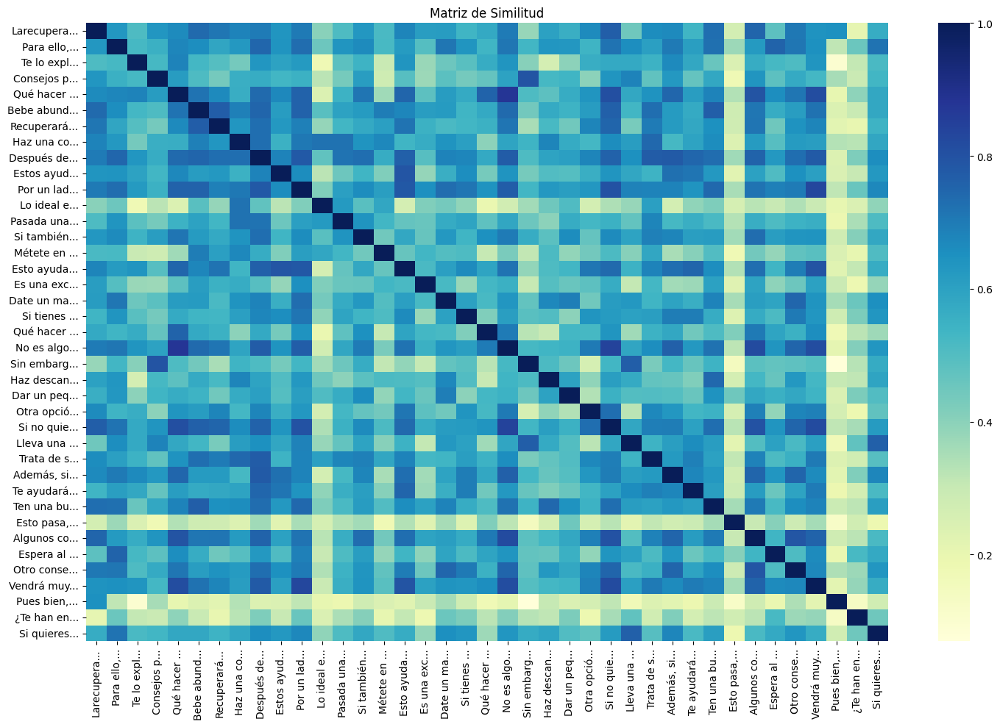


Resumen Extractivo:
Por un lado, te darán la recarga rápida de energía que necesitarás, y también repondrán parte de los nutrientes que tus músculos necesitan para estar en perfecto estado, de manera que el desgaste no será tan evidente en días posteriores. Después de haber ejercido un estrés tan grande en tu organismo, lo más recomendable es empezar con una comida más bienligeraque se centre en los hidratos. Si no quieres cargar con entrenamientos de fuerza o resistencia, es totalmente normal, pero no permanezcas inactivo.


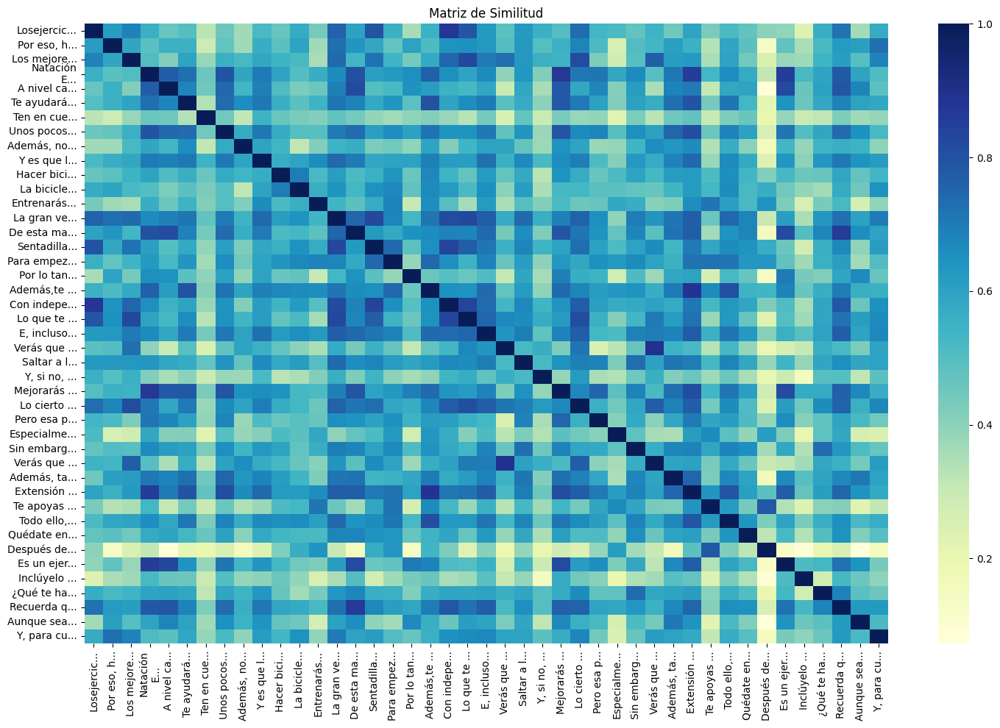


Resumen Extractivo:
Extensión de espalda sobre una pierna
Finalmente, un ejercicio para mejorar elequilibrioy para trabajar bien elfemoral. La gran ventaja de la bicicleta estática es que puedes controlar a la perfección los niveles de intensidad que quieras darle a tu entrenamiento. E, incluso, si quieres añadir un poco de intensidad, será suficiente con que subas las repeticiones o con que las realices llevando un balón medicinal en las manos.


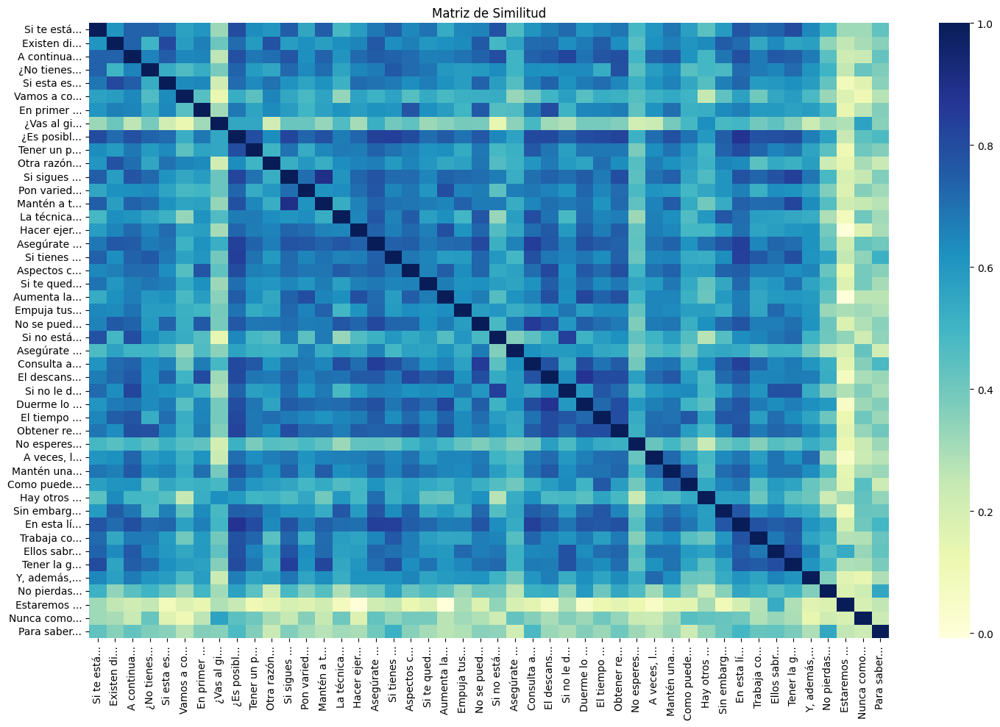


Resumen Extractivo:
¿Es posible que estés perdiendo tiempo y esfuerzo? Tener la ayuda de un entrenador personal o buscar programas de entrenamiento buenos para tus necesidades puede marcar la diferencia. En esta línea, la mejor solución es acudir a un buen gimnasio donde los expertos en la materia te puedan guiar correctamente para que tu esfuerzo no se quede sinrecompensa. Asegúrate de aprender la forma adecuada de cada ejercicio y concéntrate en mantener una postura correcta y movimientos controlados.


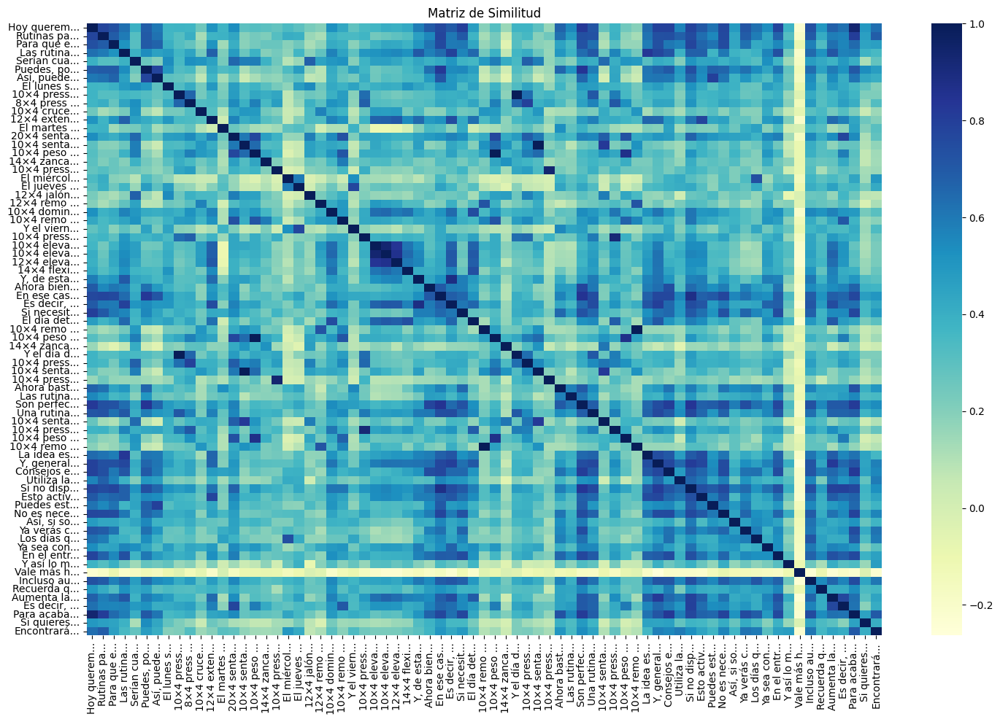


Resumen Extractivo:
Si no dispones de una hora para entrenar, en lugar de emplear las máquinas para el cardio, puedes coger algo de peso y realizar el ejercicio que tenías programado, pero aumentando las repeticiones y con mucha menos carga. Son perfectas, ya que con tres entrenamientos a la semana puedes empezar a notar cambios, y ahorrarás mucho tiempo. Incluso aunque solo sean unas flexiones en casa, eso te ayudará mucho más que saltarte el entrenamiento.


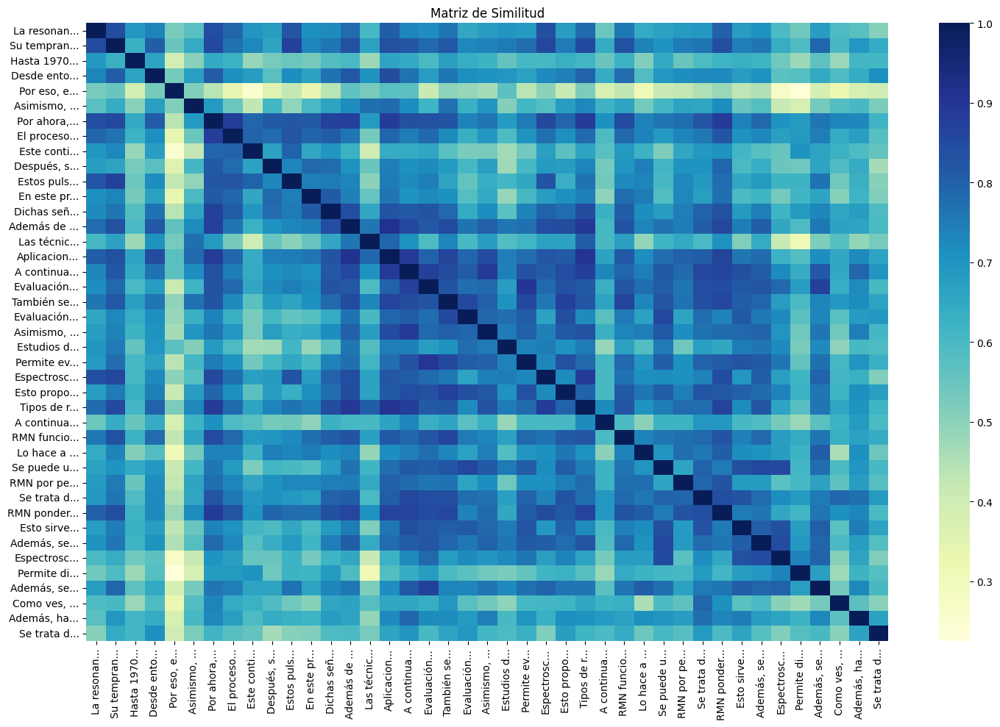


Resumen Extractivo:
A continuación, te presentamos algunas de sus principales aplicaciones:Diagnóstico y seguimiento de enfermedades: es especialmente útil en trastornos que afectan a los tejidos blandos y los órganos internos. Por ahora, te invitamos a leer este artículo si quieres saber más sobre la resonancia magnética nuclear, sus aplicaciones y los diferentes tipos que existen.¿En qué consiste una resonancia magnética nuclear?Se trata de una técnica no invasiva y no ionizante que utiliza campos magnéticos y ondas de radio para generar imágenes del interior del cuerpo humano. Aplicaciones de la resonancia magnética nuclearAl facilitar imágenes de una calidad excepcional, la RMN se emplea en distintas etapas del seguimiento de condiciones médicas.


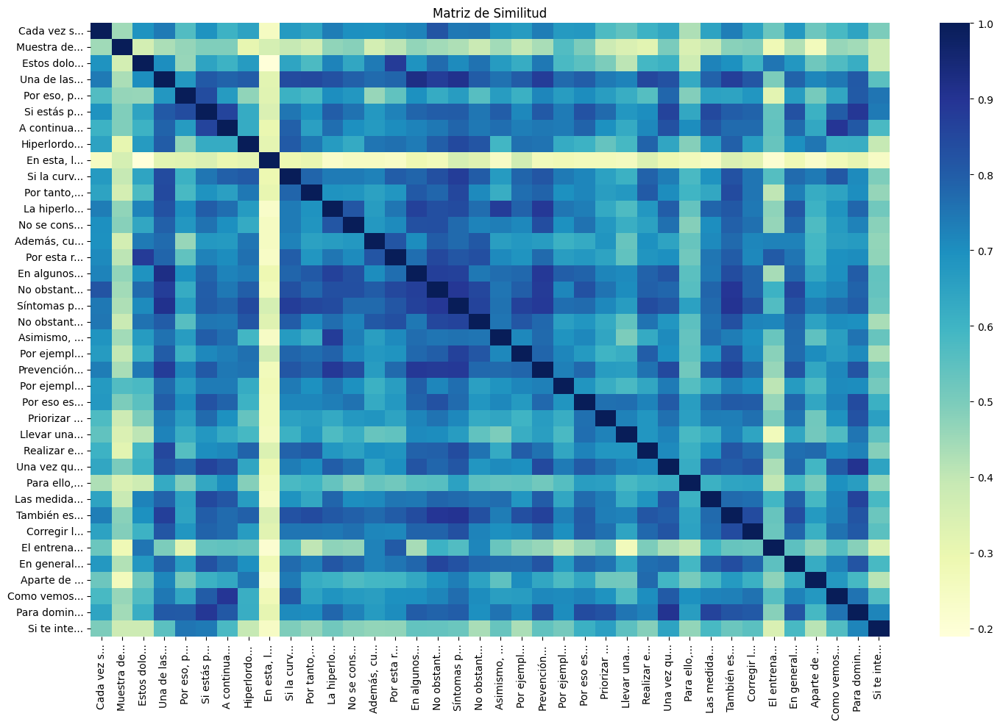


Resumen Extractivo:
Síntomas principales de la hiperlordosis lumbarDiagnosticar la hiperlordosis lumbar no es excesivamente complicado, ya que la curva que se forma en la espalda de los pacientes es muy característica. Una de las patologías más frecuentes en la espalda es la hiperlordosis lumbar, un tipo de alteración de la postura que los fisioterapeutas deben conocer en profundidad. También es importante hacer estiramientos con la persona afectada, en los que se produzca una flexión de la columna lumbar.


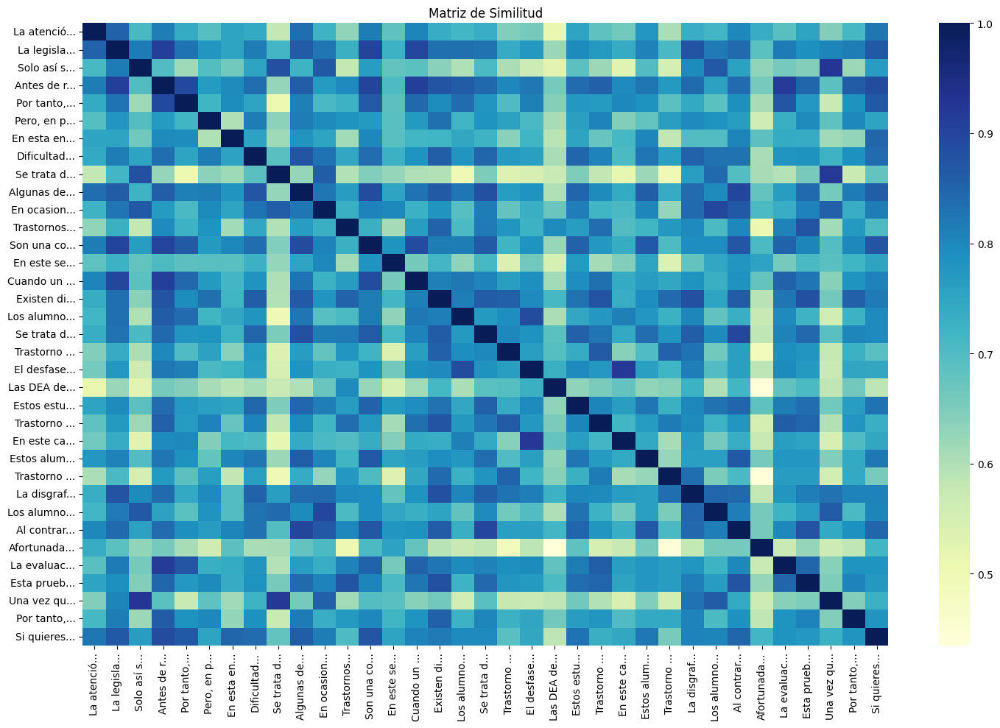


Resumen Extractivo:
Antes de realizar ninguna adaptación curricular, los profesores deben contar con un diagnóstico que determine si el estudiante tiene algún tipo de trastorno o dificultad educativa específica, una labor que recae sobre los profesionales de la psicología. La legislación contempla diferentes tipos de necesidades educativas especiales (NEE) y necesidades específicas de adaptación educativa (NEAE), y los profesores deben hacer ciertas adaptaciones en sus clases para atenderlas. Al contrario de lo que se puede llegar a pensar, los trastornos del aprendizaje no están relacionados con la falta de inteligencia, sino que se deben simplemente a una serie de carencias relacionadas con cómo las personas procesamos la información.


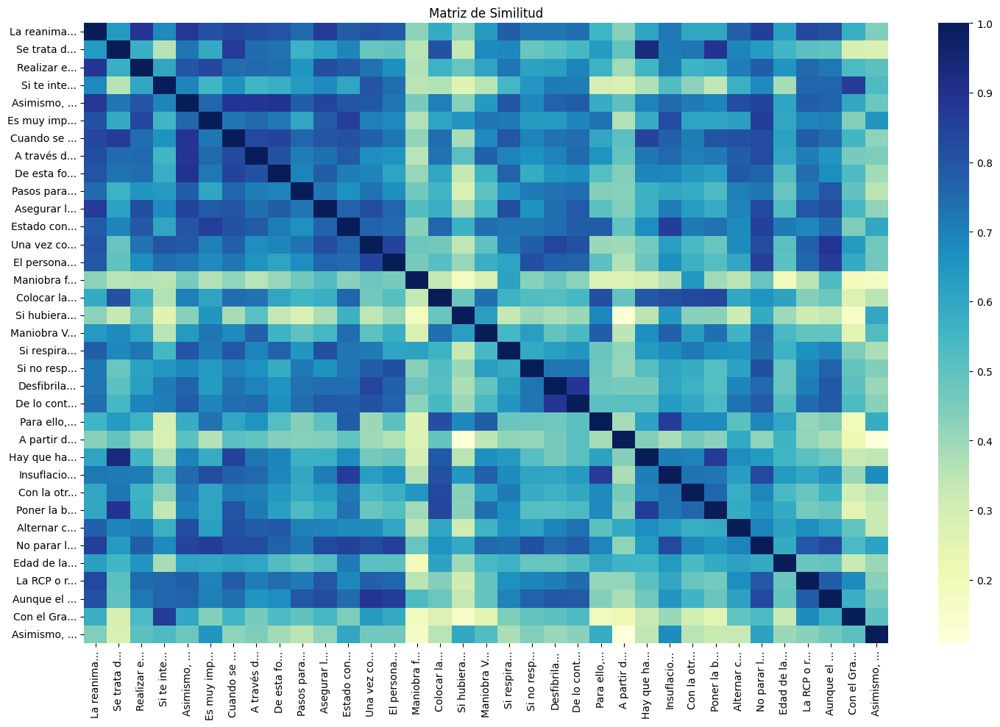


Resumen Extractivo:
No parar la maniobra: no dejar de realizar la RCP hasta que el paciente inicie de forma natural y espontánea la respiración o que lleguen los servicios de emergencia para atenderlo. Asimismo, cuentas con formación en otros puntos geográficos como Valencia y Canarias.¿En qué consiste la reanimación cardiopulmonar o RCP?Cuando se sufre una parada cardiorrespiratoria, queda bloqueada de forma inesperada el bombeo de sangre al corazón o la respiración, por lo que la sangre no circula y deja de transportar oxígeno al cuerpo, es decir, ni a órganos ni tejidos. Cuando se realiza la reanimación cardiopulmonar o RCP de intercalan movimientos de compresión en el tórax junto con respiración boca a boca al individuo en cuestión.


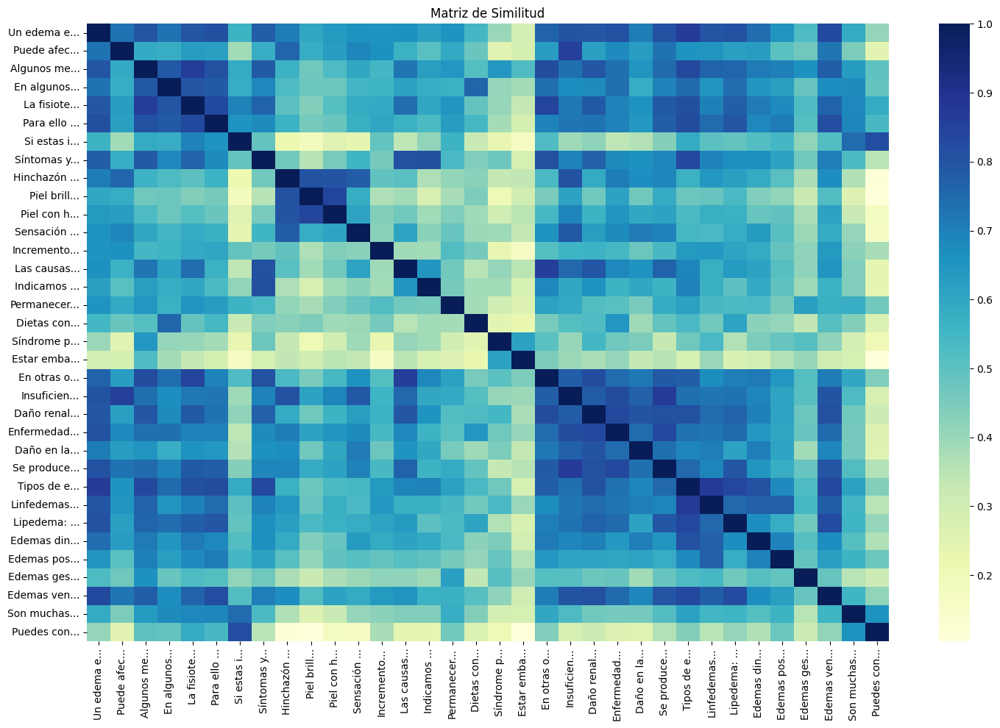


Resumen Extractivo:
Algunos medicamentos o estados como el embarazo pueden favorecer la aparición de edemas. Un edema es un signo que se manifiesta a través de la inflamación de tejidos blandos por la acumulación de líquido en el espacio tisular. Tipos de edemasExisten dos tipos de edemas estáticos o linfedemas y edemas linfáticos, ambos se dividen en varios tipos, los indicamos a continuación:Edemas linfáticosLinfedemas primarios: también conocidos como congénitos, normalmente aparecen en el nacimiento a causa de una malformación del sistema linfático.


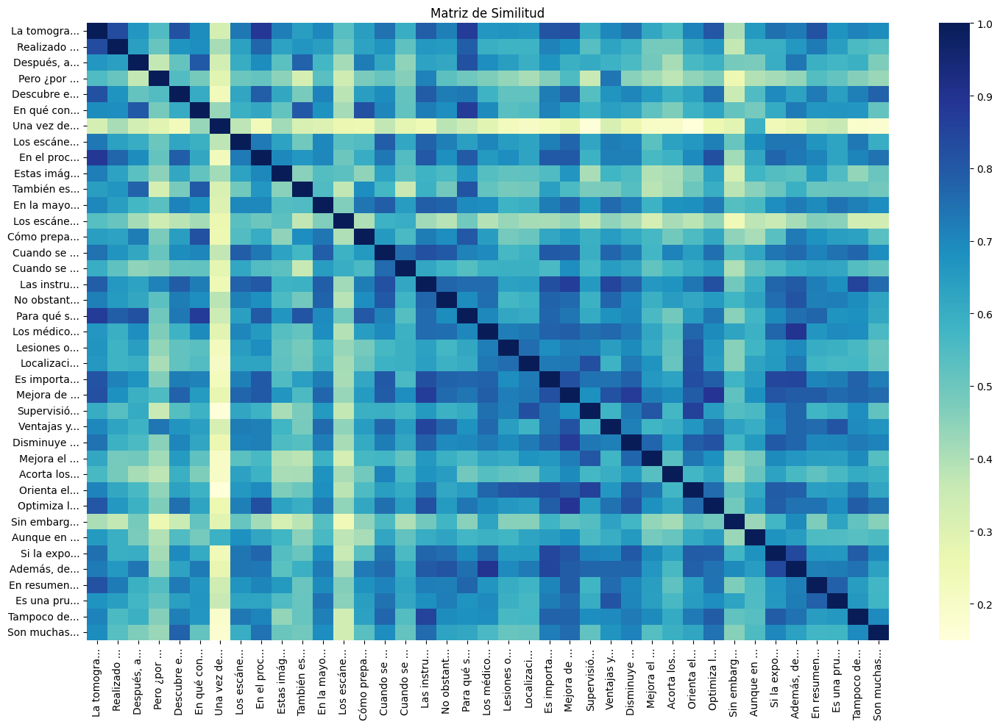


Resumen Extractivo:
Mejora de procedimientos quirúrgicos, ya que proporciona orientación sobre la ubicación adecuada para realizar incisiones, como en el caso de las biopsias. Las instrucciones para las tomografías computarizadas cambian en función del motivo del procedimiento, por lo que es esencial mantener una conversación con el médico que ha ordenado la TC o con el centro médico donde se llevará a cabo el procedimiento. Es importante destacar las condiciones pulmonares, como la neumonía, donde a menudo se emplean agentes de contraste para resaltar la afección.


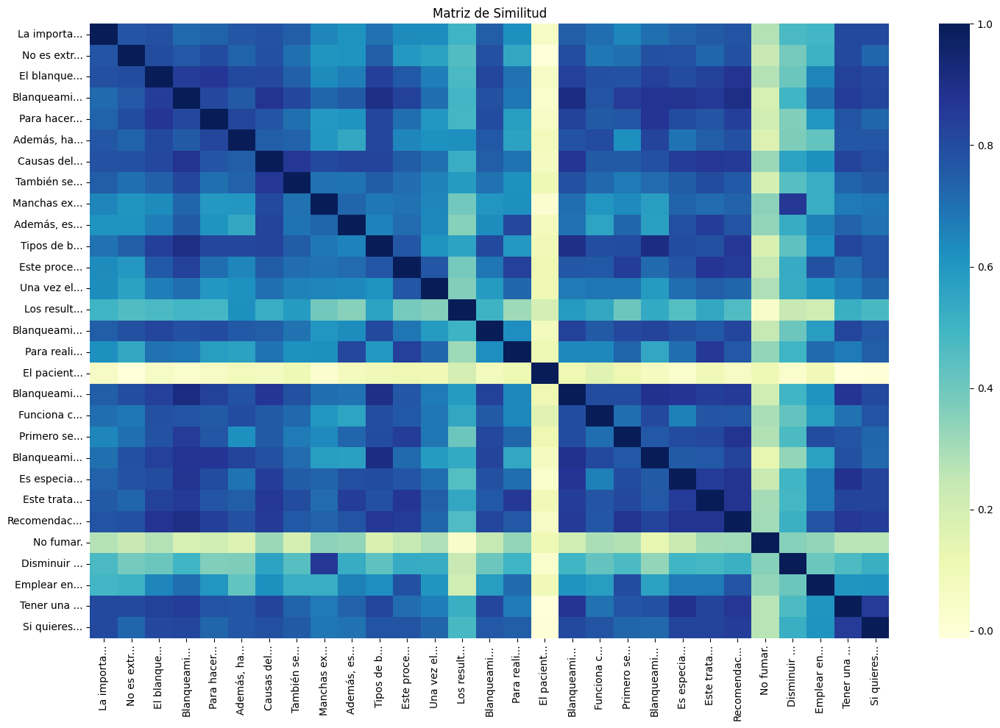


Resumen Extractivo:
Recomendaciones después de un blanqueamiento dentalSi quieres mantener tus dientes sanos y limpios después de un blanqueamiento dental, estos son algunos de los consejos que puedes seguir:Mantener una buena higiene bucal: cepillar los dientes al menos tres veces al día, utilizar hilo dental, hacer limpiezas periódicas en la clínica…Usar productos que contengan fluoruro. Este tratamiento dental se precisa de varias sesiones y se aplica sobre un diente en concreto, no sobre toda la dentadura, introduciendo un gel y dejándolo actuar hasta que se elimine la tinción. Blanqueamiento dental mixto: es el blanqueamiento más recomendable para las personas que presentan una tinción muy oscura.


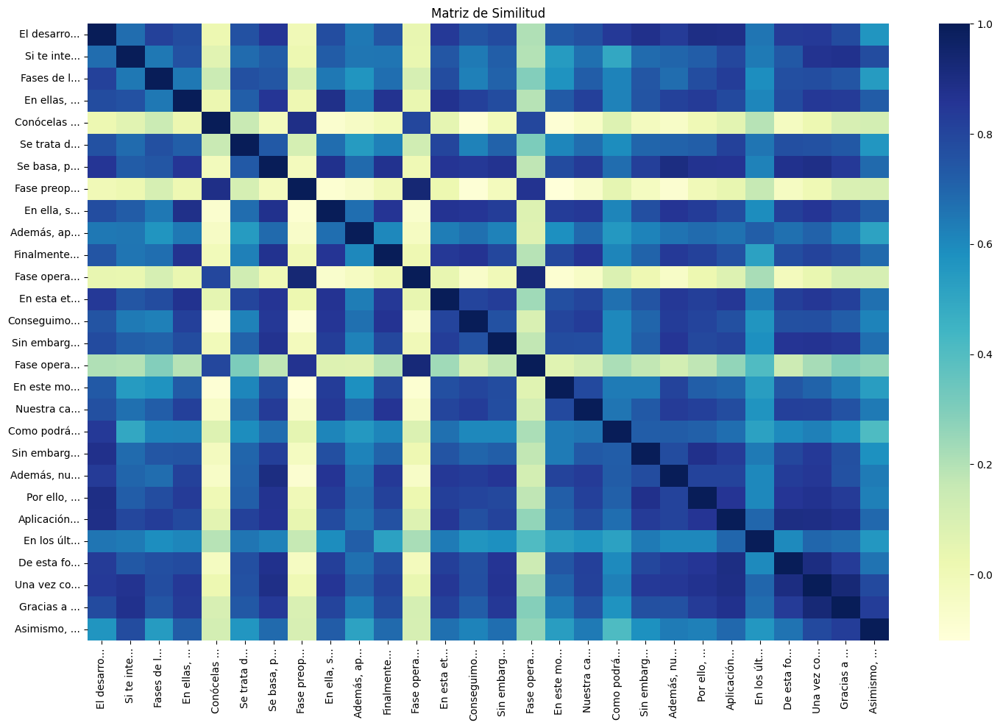


Resumen Extractivo:
Gracias a la oferta formativa que ofrece este Grado Superior en Educación Infantil, lo estudiantes obtendrán los conocimientos oportunos enfocados a crear metodologías educativas activas, a diseñar estrategias de aprendizaje basados en el juego y a la creación de propuestas y materiales didácticos que consigan aumentar la autonomía y el correcto desarrollo madurativo del alumnado del primer ciclo de infantil. Aplicación del desarrollo cognitivo en el sistema escolar del futuroIdentificar las distintas fases del desarrollo cognitivo en el crecimiento del ser humano permite ajustarlas a los procesos de enseñanza y aprendizaje en el ámbito escolar. Una vez comprendida la importancia del aprendizaje activo en la infancia y en cómo ayuda a su desarrollo cognitivo, toma mucha más relevancia que los futuros técnicos de Educación Infantil adquieran una excelente preparación y formación con la que puedan desempeñar sus competencias profesionales de una forma exitosa.


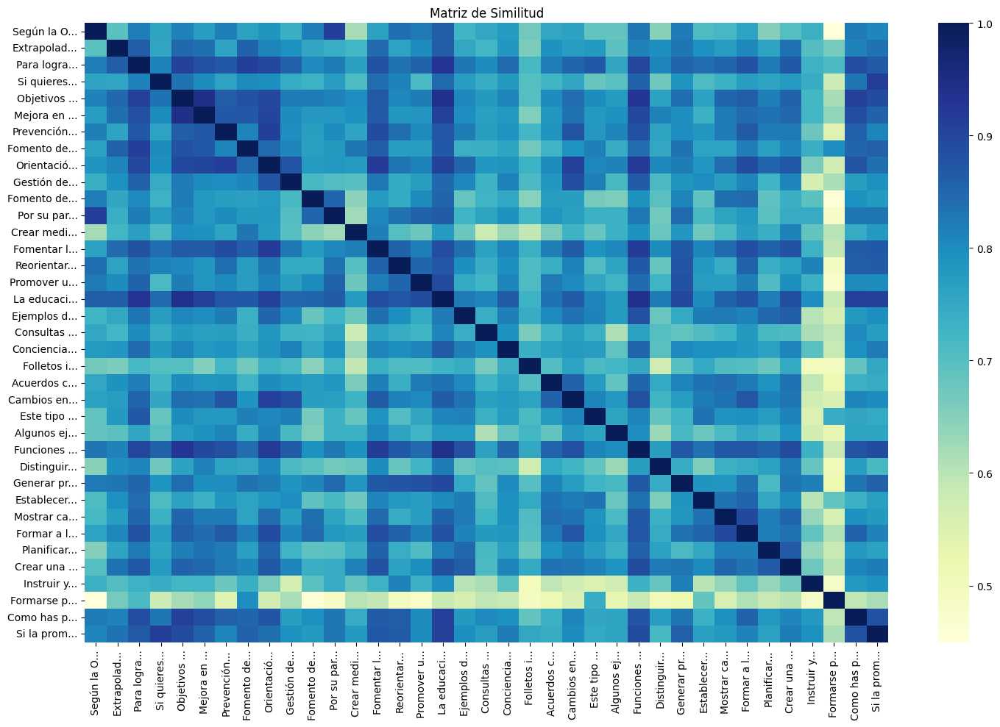


Resumen Extractivo:
La educación para la salud, necesaria para ejercer una influencia positiva sobre su promoción, hace referencia a las prácticas que posibilitan el desarrollo de habilidades y conocimientos necesarios para que los ciudadanos mejoren su salud individual y colectiva. Funciones del profesional de la promoción de la saludEl profesional de la promoción de la salud ha de cumplir una serie de funciones en el desarrollo de su actividad:Detectar necesidades, establecer objetivos, seleccionar las mejores estrategias y analizar el impacto de los procesos de educación. Para lograrlo, podemos apostar por perfeccionar las habilidades y capacidades del personal involucrado en el sector sanitario (por ejemplo, a través de formaciones especializadas como el Máster en Salud Pública), pero también por favorecer las condiciones sociales, ambientales y económicas que lo rodean.


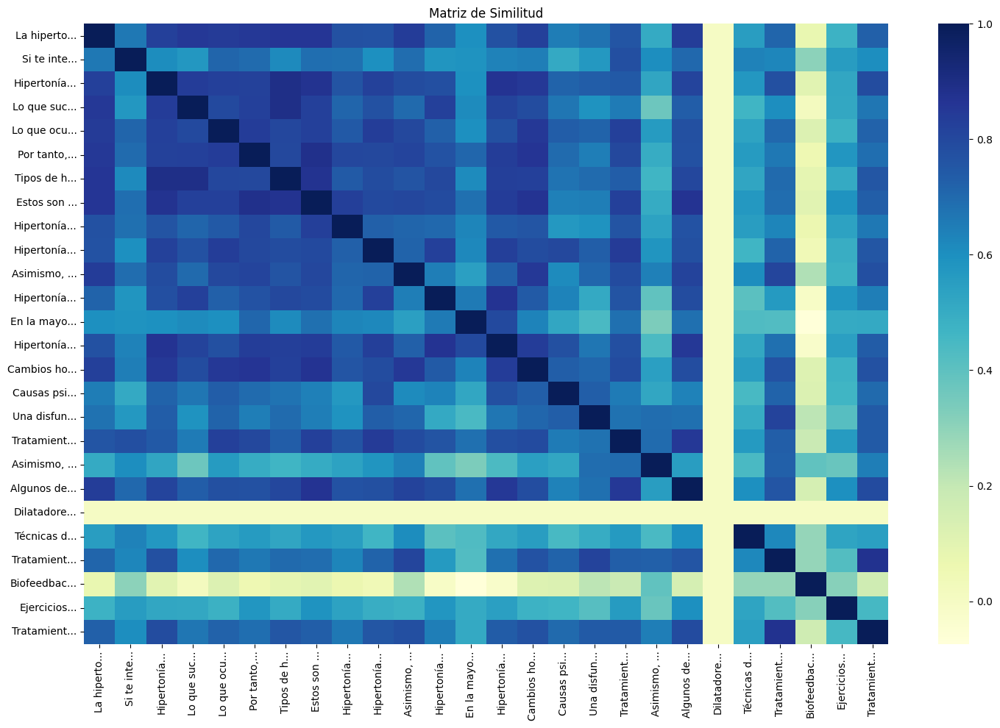


Resumen Extractivo:
Estos son los tipos de hipertonía muscular que existen:Hipertonía elástica: el músculo movilizado vuelve a su posición de origen cuando se deja de hacer el movimiento de forma manual. Algunos de los tratamientos más recurrentes utilizados para tratar la hipertonía del suelo pélvico encontramos:Masajes perineales. Tratamiento hipertonía suelo pélvicoAl tratarse de una afección que puede tener diferentes orígenes, se puede atender desde diferentes ramas de la medicina, aunque como primera opción, siempre se recomienda acudir al fisioterapeuta especializado en suelo pélvico y aplicar técnicas que no sean invasivas.


In [ ]:
noticias_resumidas = {}
for key, values in text.items():
    noticias_resumidas[key] = []
    for i, noticia in enumerate(values):
        resumen = resumen_noticia(text[key][i])
        noticias_resumidas[key].append(resumen)


En general, para cada noticia, se observa en las matrices la existencia de oraciones con un elevado registro de similitud. Esto es positivo ya que nos da indicio de la presencia de un texto coherente que puede ser representado destacando unas pocas oraciones. Se han elegido 3 oraciones por noticia para la confección de los resúmenes ya que algunos textos son  muy largos y lo que se busca es informar el contenido más destacado de cada noticia y no abrumar al lector con excesivos detalles.

#### Programa interactivo para brindar un resumen de las noticias por categoría

In [ ]:
def obtener_resumen_categoria():
    print("Categorías disponibles:")
    for categoria in noticias_resumidas.keys():
        print(f"- {categoria}")

    categoria_elegida = input("Elija una categoría: ")

    if categoria_elegida in noticias_resumidas:
        resumenes = noticias_resumidas[categoria_elegida]
        texto = ''
        for resumen in resumenes:
            texto += resumen + '\n'
        return texto
    else:
        return "Categoría no válida. Por favor, elija una categoría de la lista."


In [ ]:
resumenes = obtener_resumen_categoria()
print("\nResumen de noticias:")
print(f"- {resumenes}")


Categorías disponibles:
- economia y finanzas
- entretenimiento
- fitness y deporte
- medicina y salud

Resumen de noticias:
- Categoría no válida. Por favor, elija una categoría de la lista.


#### Opcional: creación de un bot de Telegram para brindar resúmenes por categoría

In [ ]:
categorias_noticias = []
for key in noticias_resumidas.keys():
    categorias_noticias.append(key)
categorias_noticias

['economia y finanzas',
 'entretenimiento',
 'fitness y deporte',
 'medicina y salud']

In [ ]:
import telebot

# Se debe reemplazar 'TOKEN_AQUI' con el token que proporcionó BotFather
TOKEN = 'TOKEN_AQUI'

bot = telebot.TeleBot(TOKEN)

# Definir un diccionario para mantener el estado de la conversación
conversaciones = {}

@bot.message_handler(commands=['start', 'help'])
def send_welcome(message):
    bot.reply_to(message, "¡Hola! Soy tu bot de noticias. Escribe /categorias para ver las opciones de categorías disponibles.")

@bot.message_handler(commands=['categorias'])
def send_categories(message):
    categories = '\n'.join(noticias_resumidas.keys())
    bot.reply_to(message, f"Las categorías disponibles son:\n{categories}")

@bot.message_handler(func=lambda message: True)
def echo_all(message):
    chat_id = message.chat.id
    categoria = message.text

    if chat_id not in conversaciones:
        conversaciones[chat_id] = {'state': 'esperando_categoria'}

    if conversaciones[chat_id]['state'] == 'esperando_categoria':
        if categoria in categorias_noticias:
            resumenes = noticias_resumidas[categoria]
            resumen_text = ''
            for resumen in resumenes:
                resumen_text += resumen + '\n'
            max_length = 4096

            if len(resumen_text) > max_length:
                partes = [resumen_text[i:i+max_length] for i in range(0, len(resumen_text), max_length)]
                for parte in partes:
                    bot.reply_to(message, parte)
            else:
                bot.reply_to(message, f"Resumen de noticias en la categoría '{categoria}':\n{resumen_text}")

            # Cambiar el estado a 'preguntar_otra_categoria'
            conversaciones[chat_id]['state'] = 'preguntar_otra_categoria'
            bot.reply_to(message, "¿Deseas ver noticias de otra categoría? (Sí/No)")
        else:
            bot.reply_to(message, "Categoría no válida. Por favor, elija una categoría de la lista.")
    elif conversaciones[chat_id]['state'] == 'preguntar_otra_categoria':
        if categoria.lower() == 'si':
            # Si el usuario quiere ver otra categoría, volver al estado 'esperando_categoria'
            conversaciones[chat_id]['state'] = 'esperando_categoria'
            bot.reply_to(message, "Por favor, elija una categoría de la lista.")
        elif categoria.lower() == 'no':
            # Si el usuario no quiere ver más categorías, despedirse y terminar la conversación
            del conversaciones[chat_id]  # Eliminar la conversación de la memoria
            bot.reply_to(message, "¡Hasta luego! Si necesitas más noticias, no dudes en preguntar.")
            # Enviar un enlace para reiniciar la conversación
            bot.send_message(chat_id, "Para iniciar una nueva conversación, haz clic [aquí](https://t.me/Noticias_PLN_TP1_bot/)")
        else:
            bot.reply_to(message, "Por favor, responda 'Sí' o 'No'.")

bot.polling()